## ResNet 18

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


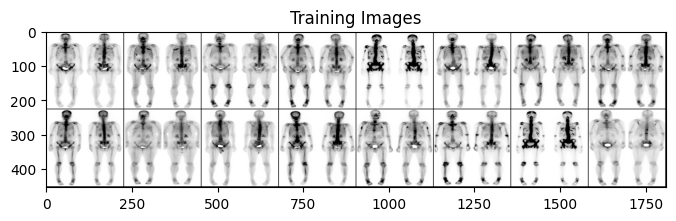

Labels: tensor([1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.4981085930779142, Test Loss: 0.5868239849805832
Epoch [2/4], Train Loss: 0.40233685206441044, Test Loss: 0.582295486330986
Epoch [3/4], Train Loss: 0.36775671726870307, Test Loss: 0.593109267950058
Epoch [4/4], Train Loss: 0.34375141179460345, Test Loss: 0.6431837990880013


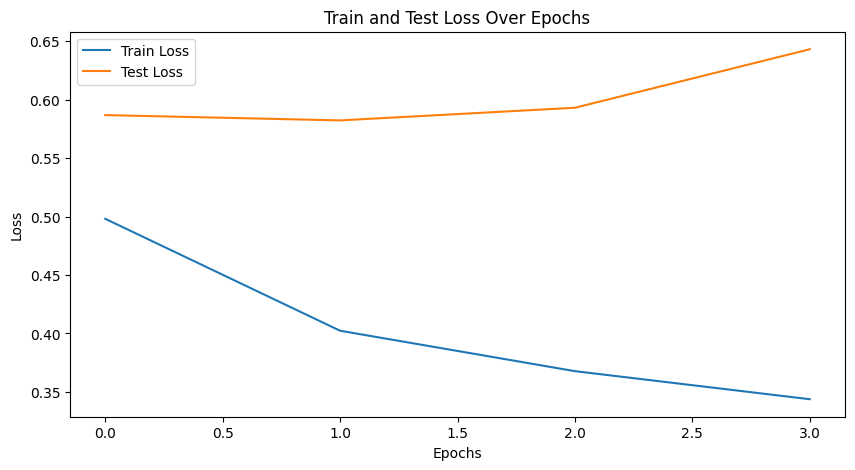

Accuracy: 0.70625
Sensitivity: 0.55
Specificity: 0.8625
PPV: 0.8
NPV: 0.6571428571428571
AUC: 0.8009375000000001
Precision: 0.8
Recall: 0.55
F1-score: 0.6518518518518519
Loss: 0.6431837990880013


In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet18_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet18_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


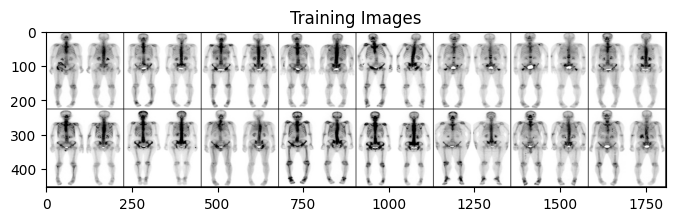

Labels: tensor([0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1])
Epoch [1/4], Train Loss: 0.5323010797350152, Test Loss: 0.5374538004398346
Epoch [2/4], Train Loss: 0.43802816616100015, Test Loss: 0.5485825330018997
Epoch [3/4], Train Loss: 0.39713758523169074, Test Loss: 0.5437821209430694
Epoch [4/4], Train Loss: 0.38312003741637596, Test Loss: 0.536772583425045


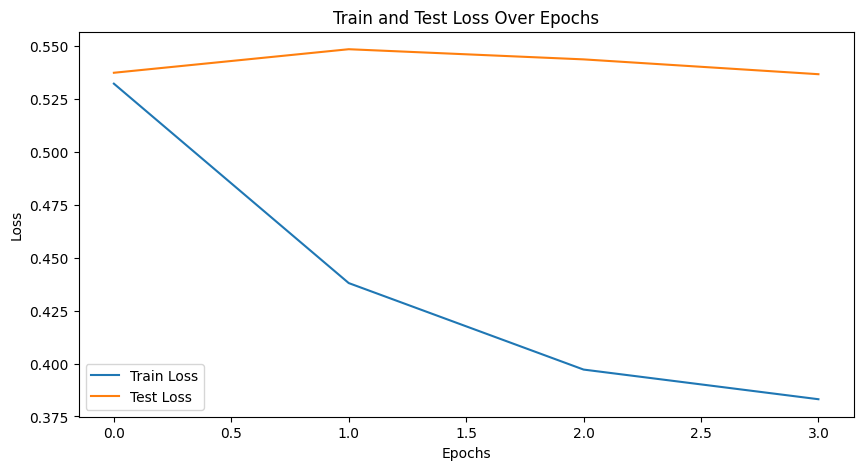

Accuracy: 0.75625
Sensitivity: 0.65
Specificity: 0.8625
PPV: 0.8253968253968254
NPV: 0.711340206185567
AUC: 0.8159375
Precision: 0.8253968253968254
Recall: 0.65
F1-score: 0.7272727272727272
Loss: 0.536772583425045


In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet18_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet18_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


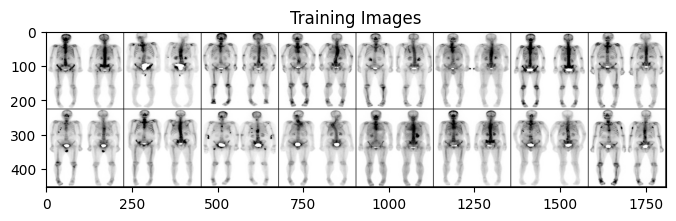

Labels: tensor([1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5468910271030607, Test Loss: 0.5622888803482056
Epoch [2/4], Train Loss: 0.45916712320256003, Test Loss: 0.5418261289596558
Epoch [3/4], Train Loss: 0.4155279321650278, Test Loss: 0.5357641905546189
Epoch [4/4], Train Loss: 0.38358964170645743, Test Loss: 0.5484141409397125


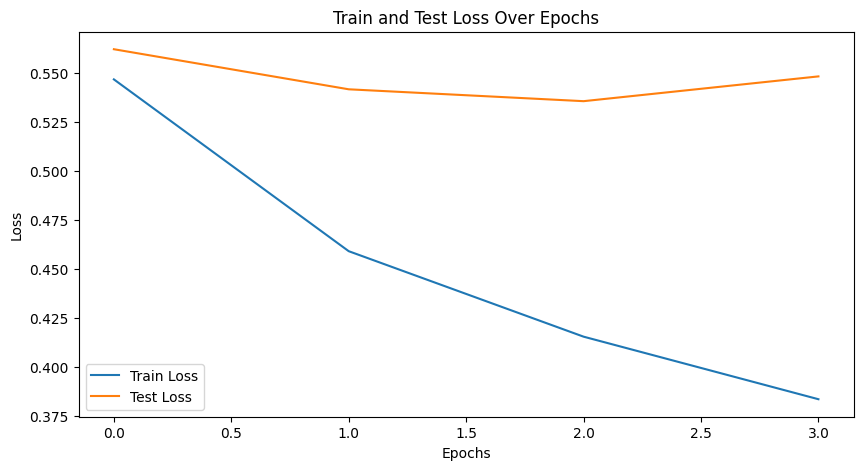

Accuracy: 0.7467532467532467
Sensitivity: 0.6363636363636364
Specificity: 0.8571428571428571
PPV: 0.8166666666666667
NPV: 0.7021276595744681
AUC: 0.8127846179794231
Precision: 0.8166666666666667
Recall: 0.6363636363636364
F1-score: 0.7153284671532846
Loss: 0.5484141409397125


In [3]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet18_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet18_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


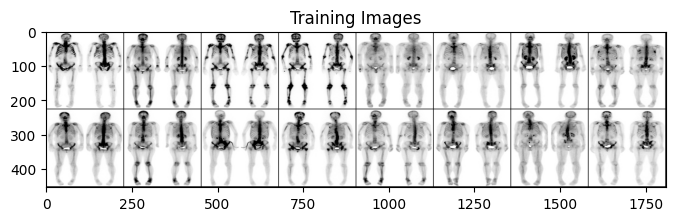

Labels: tensor([1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5490201748545888, Test Loss: 0.4941842868924141
Epoch [2/4], Train Loss: 0.44773968522554464, Test Loss: 0.4650748297572136
Epoch [3/4], Train Loss: 0.4044296448525873, Test Loss: 0.49414816573262216
Epoch [4/4], Train Loss: 0.3876325659164526, Test Loss: 0.4585402101278305


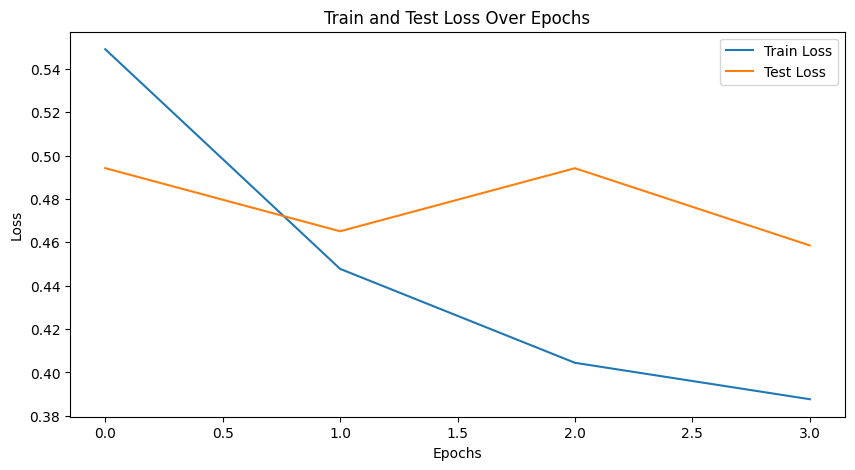

Accuracy: 0.7628205128205128
Sensitivity: 0.6923076923076923
Specificity: 0.8333333333333334
PPV: 0.8059701492537313
NPV: 0.7303370786516854
AUC: 0.8717948717948718
Precision: 0.8059701492537313
Recall: 0.6923076923076923
F1-score: 0.7448275862068965
Loss: 0.4585402101278305


In [4]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet18_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet18_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


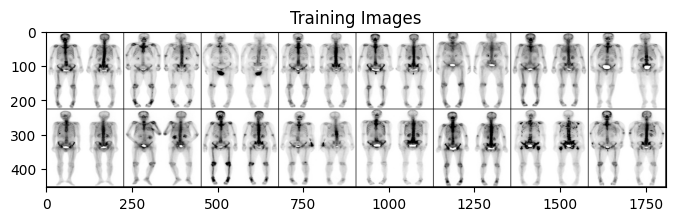

Labels: tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1])
Epoch [1/4], Train Loss: 0.5372074050738395, Test Loss: 0.5121082395315171
Epoch [2/4], Train Loss: 0.4318257448019333, Test Loss: 0.5025004953145981
Epoch [3/4], Train Loss: 0.3904512079378355, Test Loss: 0.5055546641349793
Epoch [4/4], Train Loss: 0.36503303958808336, Test Loss: 0.5334480479359627


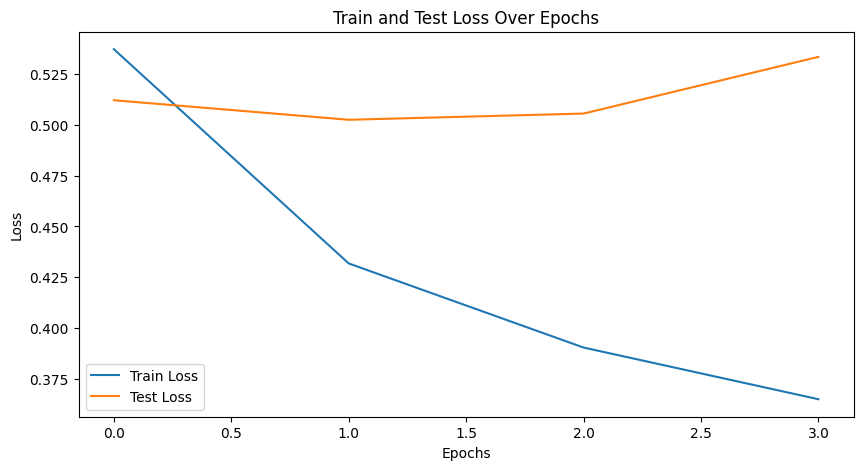

Accuracy: 0.76875
Sensitivity: 0.6375
Specificity: 0.9
PPV: 0.864406779661017
NPV: 0.7128712871287128
AUC: 0.82203125
Precision: 0.864406779661017
Recall: 0.6375
F1-score: 0.7338129496402878
Loss: 0.5334480479359627


In [5]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet18_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet18(weights=ResNet18_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet18_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ResNet 34

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


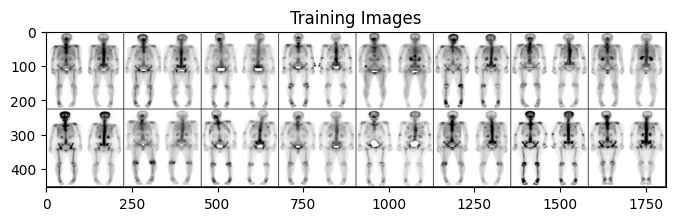

Labels: tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.547926055864223, Test Loss: 0.64990736246109
Epoch [2/4], Train Loss: 0.4513068698274279, Test Loss: 0.6435017228126526
Epoch [3/4], Train Loss: 0.4092101669571932, Test Loss: 0.6417133122682571
Epoch [4/4], Train Loss: 0.39997528858699843, Test Loss: 0.6418055713176727


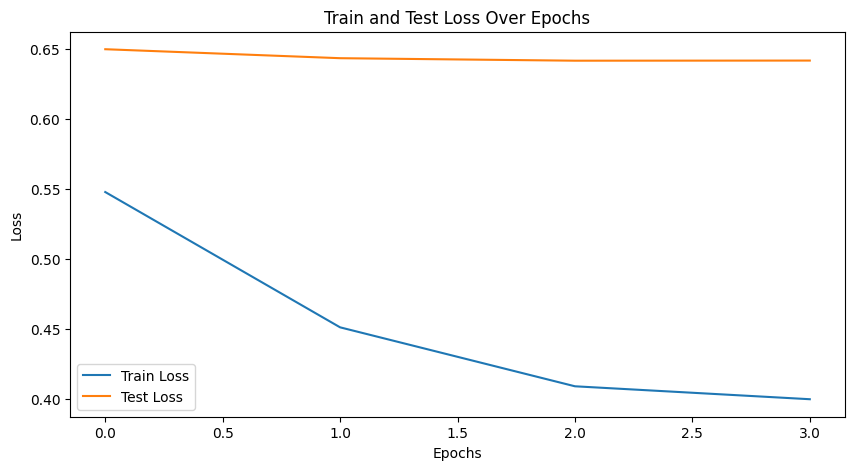

Accuracy: 0.6875
Sensitivity: 0.6
Specificity: 0.775
PPV: 0.7272727272727273
NPV: 0.6595744680851063
AUC: 0.754375
Precision: 0.7272727272727273
Recall: 0.6
F1-score: 0.6575342465753425
Loss: 0.6418055713176727


In [6]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet34_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet34_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


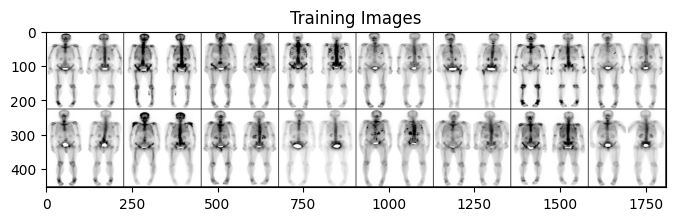

Labels: tensor([0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5730935819085362, Test Loss: 0.5781550347805023
Epoch [2/4], Train Loss: 0.48589952441963175, Test Loss: 0.5655249387025834
Epoch [3/4], Train Loss: 0.44644375557749016, Test Loss: 0.5558928489685059
Epoch [4/4], Train Loss: 0.43009412534607266, Test Loss: 0.5589842528104783


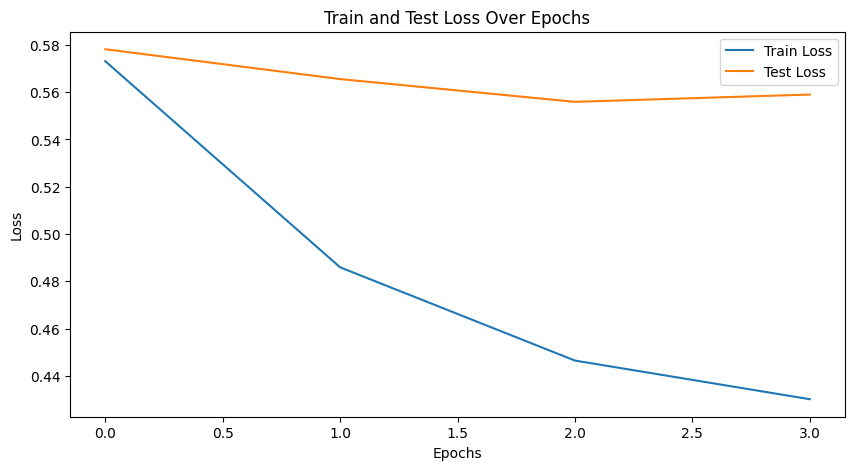

Accuracy: 0.73125
Sensitivity: 0.625
Specificity: 0.8375
PPV: 0.7936507936507936
NPV: 0.6907216494845361
AUC: 0.794375
Precision: 0.7936507936507936
Recall: 0.625
F1-score: 0.6993006993006993
Loss: 0.5589842528104783


In [7]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet34_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet34_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


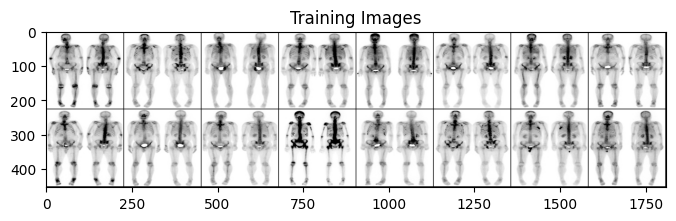

Labels: tensor([0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.5478921696833037, Test Loss: 0.5806914508342743
Epoch [2/4], Train Loss: 0.44926644832763857, Test Loss: 0.5768238067626953
Epoch [3/4], Train Loss: 0.4093947008758494, Test Loss: 0.5874032378196716
Epoch [4/4], Train Loss: 0.3894247073788666, Test Loss: 0.5742371916770935


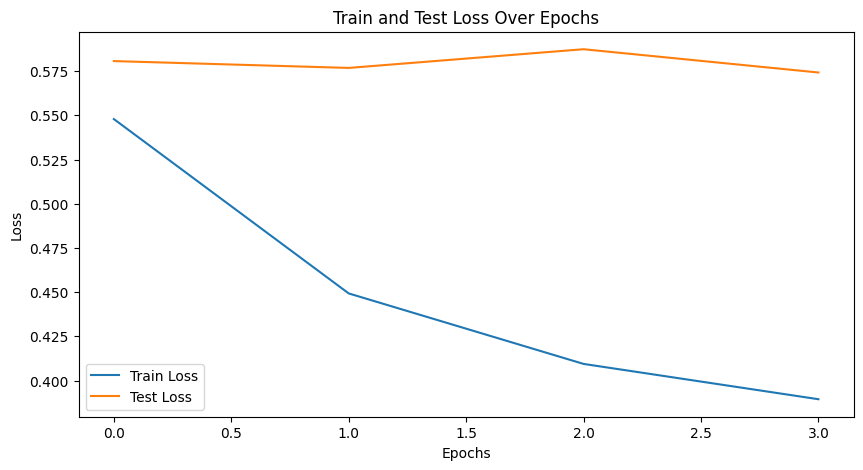

Accuracy: 0.6883116883116883
Sensitivity: 0.6493506493506493
Specificity: 0.7272727272727273
PPV: 0.704225352112676
NPV: 0.6746987951807228
AUC: 0.7896778546129194
Precision: 0.704225352112676
Recall: 0.6493506493506493
F1-score: 0.6756756756756757
Loss: 0.5742371916770935


In [8]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet34_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet34_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


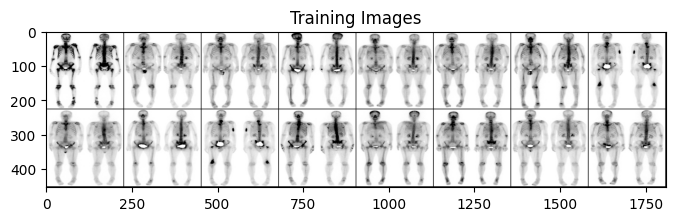

Labels: tensor([1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5581284594333288, Test Loss: 0.4772146731615067
Epoch [2/4], Train Loss: 0.4661179725623247, Test Loss: 0.47223109751939774
Epoch [3/4], Train Loss: 0.4236748044207258, Test Loss: 0.4864416405558586
Epoch [4/4], Train Loss: 0.4064037807792136, Test Loss: 0.46005013436079023


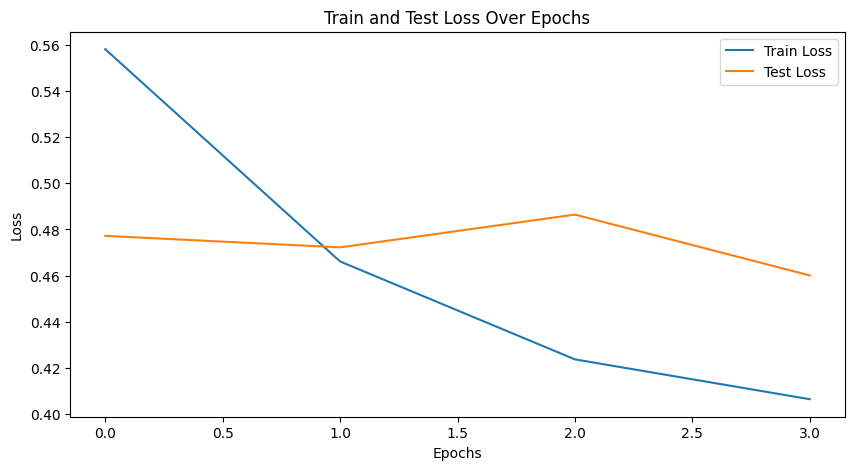

Accuracy: 0.7756410256410257
Sensitivity: 0.6794871794871795
Specificity: 0.8717948717948718
PPV: 0.8412698412698413
NPV: 0.7311827956989247
AUC: 0.868836291913215
Precision: 0.8412698412698413
Recall: 0.6794871794871795
F1-score: 0.7517730496453902
Loss: 0.46005013436079023


In [9]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet34_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet34_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


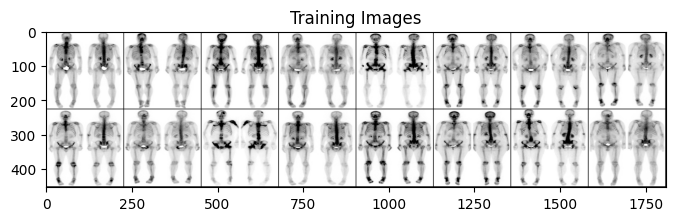

Labels: tensor([0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.5423862718190383, Test Loss: 0.4592291086912155
Epoch [2/4], Train Loss: 0.46168100150320135, Test Loss: 0.4467834711074829
Epoch [3/4], Train Loss: 0.41902153870289766, Test Loss: 0.43959822356700895
Epoch [4/4], Train Loss: 0.402279641406918, Test Loss: 0.4276447594165802


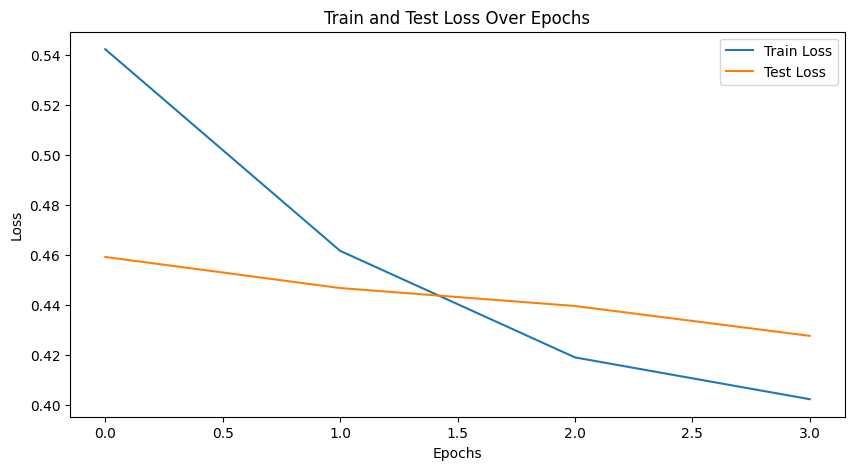

Accuracy: 0.80625
Sensitivity: 0.7625
Specificity: 0.85
PPV: 0.8356164383561644
NPV: 0.7816091954022989
AUC: 0.8921875
Precision: 0.8356164383561644
Recall: 0.7625
F1-score: 0.7973856209150326
Loss: 0.4276447594165802


In [10]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet34_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet34(weights=ResNet34_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet34_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ResNet 50

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


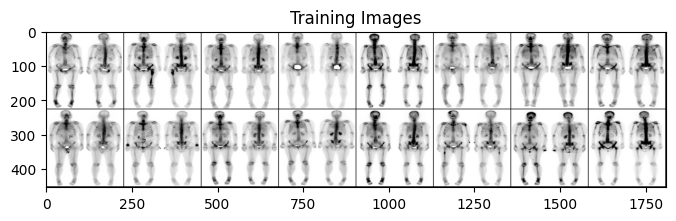

Labels: tensor([1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5713239502414916, Test Loss: 0.5779308944940567
Epoch [2/4], Train Loss: 0.4599088872737676, Test Loss: 0.6256518691778183
Epoch [3/4], Train Loss: 0.40936437383004765, Test Loss: 0.5751770824193955
Epoch [4/4], Train Loss: 0.3866334532577436, Test Loss: 0.6356936603784561


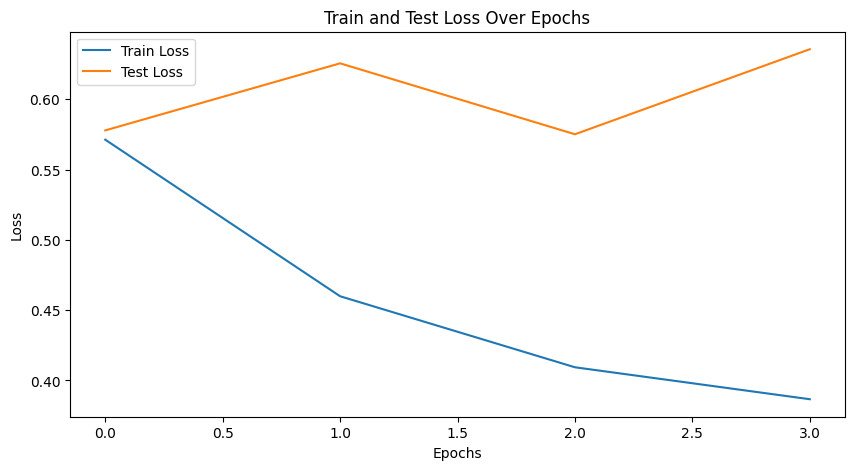

Accuracy: 0.66875
Sensitivity: 0.4875
Specificity: 0.85
PPV: 0.7647058823529411
NPV: 0.6238532110091743
AUC: 0.7582812499999999
Precision: 0.7647058823529411
Recall: 0.4875
F1-score: 0.5954198473282442
Loss: 0.6356936603784561


In [11]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet50_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet50_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


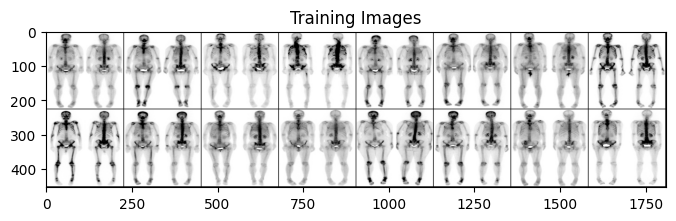

Labels: tensor([0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.5141378613640961, Test Loss: 0.5400314658880234
Epoch [2/4], Train Loss: 0.4184640679616951, Test Loss: 0.5396362602710724
Epoch [3/4], Train Loss: 0.37410585822772635, Test Loss: 0.5245776623487473
Epoch [4/4], Train Loss: 0.3474243770995476, Test Loss: 0.5524707466363907


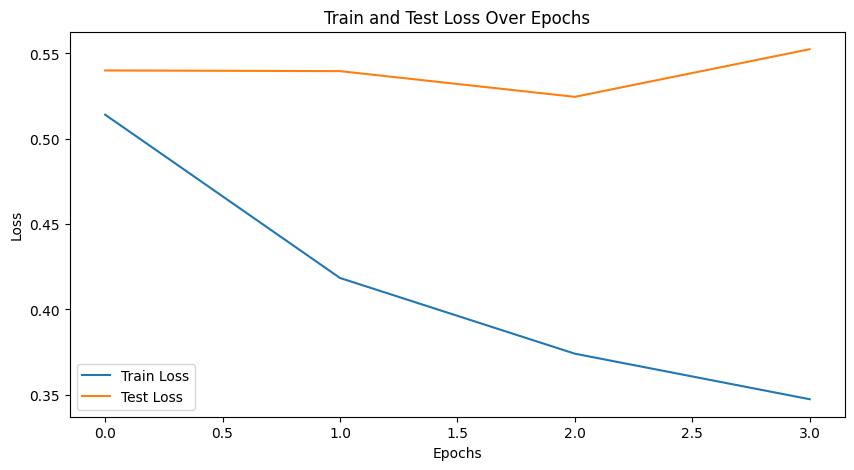

Accuracy: 0.725
Sensitivity: 0.5875
Specificity: 0.8625
PPV: 0.8103448275862069
NPV: 0.6764705882352942
AUC: 0.8173437499999999
Precision: 0.8103448275862069
Recall: 0.5875
F1-score: 0.6811594202898551
Loss: 0.5524707466363907


In [12]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet50_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet50_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


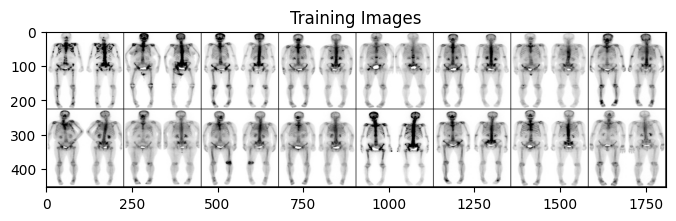

Labels: tensor([1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5577179877792747, Test Loss: 0.657901194691658
Epoch [2/4], Train Loss: 0.44527911586524216, Test Loss: 0.650624805688858
Epoch [3/4], Train Loss: 0.3988010527439488, Test Loss: 0.6424899905920028
Epoch [4/4], Train Loss: 0.37258715319980695, Test Loss: 0.6346545070409775


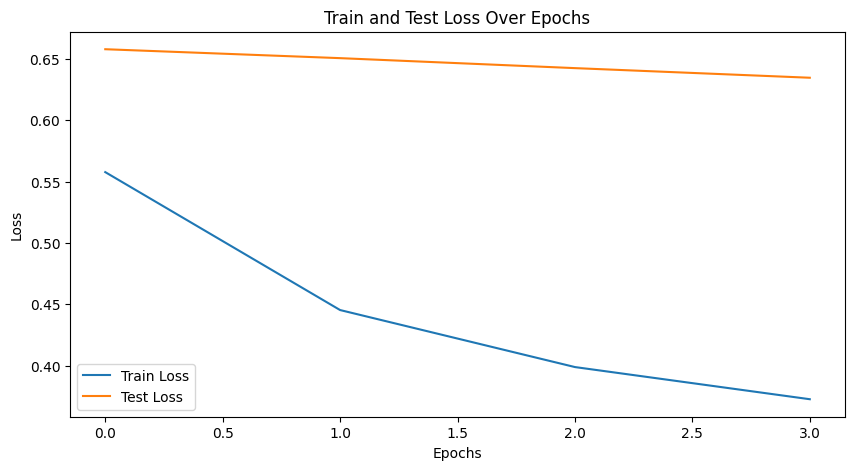

Accuracy: 0.6818181818181818
Sensitivity: 0.6233766233766234
Specificity: 0.7402597402597403
PPV: 0.7058823529411765
NPV: 0.6627906976744186
AUC: 0.7304773148928992
Precision: 0.7058823529411765
Recall: 0.6233766233766234
F1-score: 0.6620689655172415
Loss: 0.6346545070409775


In [13]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet50_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet50_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


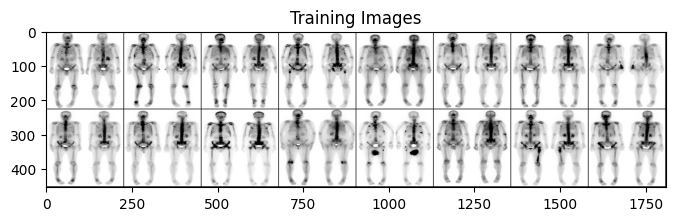

Labels: tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1])
Epoch [1/4], Train Loss: 0.5788656088333686, Test Loss: 0.4346153736114502
Epoch [2/4], Train Loss: 0.4748526065456636, Test Loss: 0.4369893461465836
Epoch [3/4], Train Loss: 0.44969573146799235, Test Loss: 0.46800210177898405
Epoch [4/4], Train Loss: 0.41850112074787177, Test Loss: 0.47833251357078554


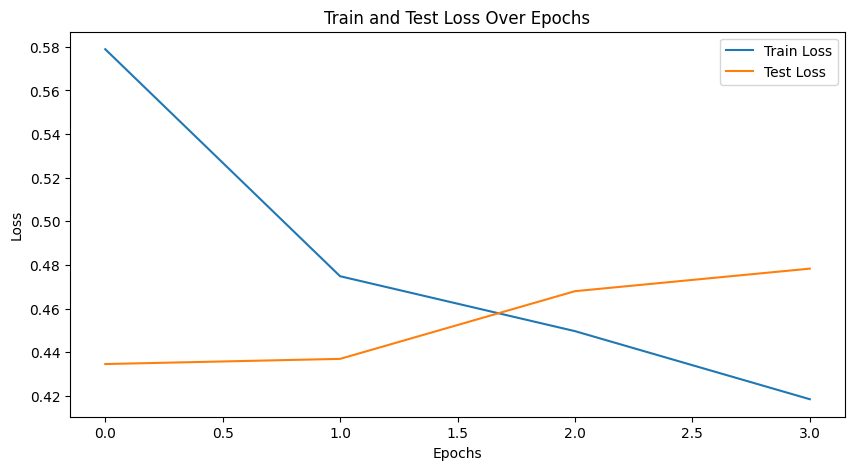

Accuracy: 0.7628205128205128
Sensitivity: 0.6538461538461539
Specificity: 0.8717948717948718
PPV: 0.8360655737704918
NPV: 0.7157894736842105
AUC: 0.8566732412886258
Precision: 0.8360655737704918
Recall: 0.6538461538461539
F1-score: 0.7338129496402876
Loss: 0.47833251357078554


In [14]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet50_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet50_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


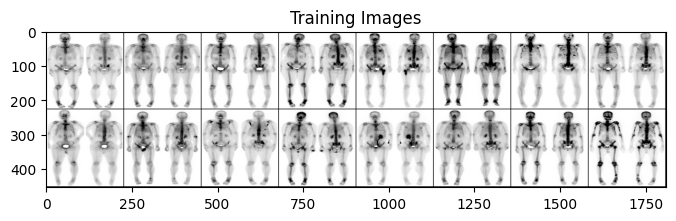

Labels: tensor([1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1])
Epoch [1/4], Train Loss: 0.5550689819151337, Test Loss: 0.6019319474697113
Epoch [2/4], Train Loss: 0.4678545688251847, Test Loss: 0.5011864840984345
Epoch [3/4], Train Loss: 0.4145968536150108, Test Loss: 0.6222973182797432
Epoch [4/4], Train Loss: 0.39017791736834834, Test Loss: 0.5849597707390786


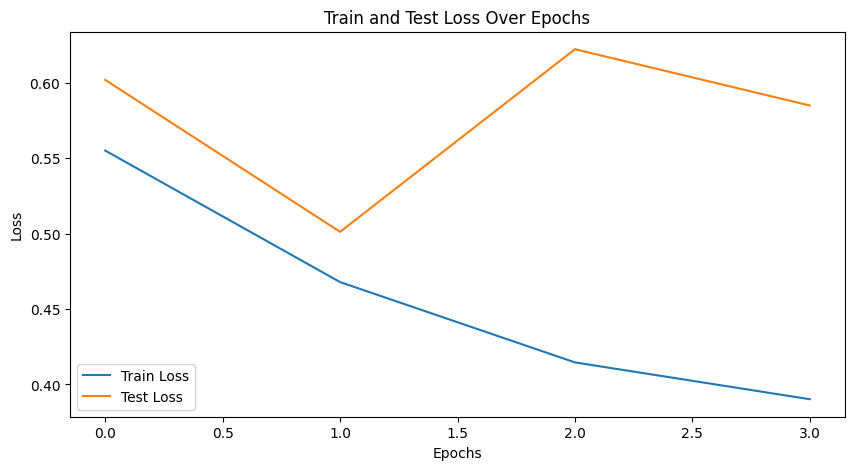

Accuracy: 0.75
Sensitivity: 0.575
Specificity: 0.925
PPV: 0.8846153846153846
NPV: 0.6851851851851852
AUC: 0.82375
Precision: 0.8846153846153846
Recall: 0.575
F1-score: 0.696969696969697
Loss: 0.5849597707390786


In [15]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet50_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet50_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ResNet 101

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


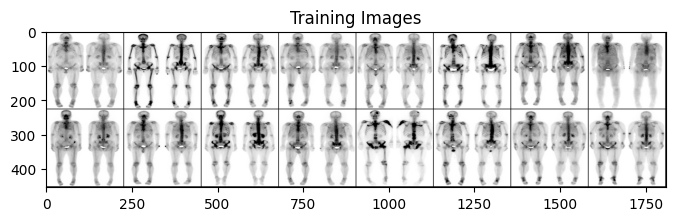

Labels: tensor([0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.558928738085969, Test Loss: 0.732996654510498
Epoch [2/4], Train Loss: 0.4612577140548276, Test Loss: 0.6926710069179535
Epoch [3/4], Train Loss: 0.41880340396779253, Test Loss: 0.6838892698287964
Epoch [4/4], Train Loss: 0.39827325057636187, Test Loss: 0.6746401429176331


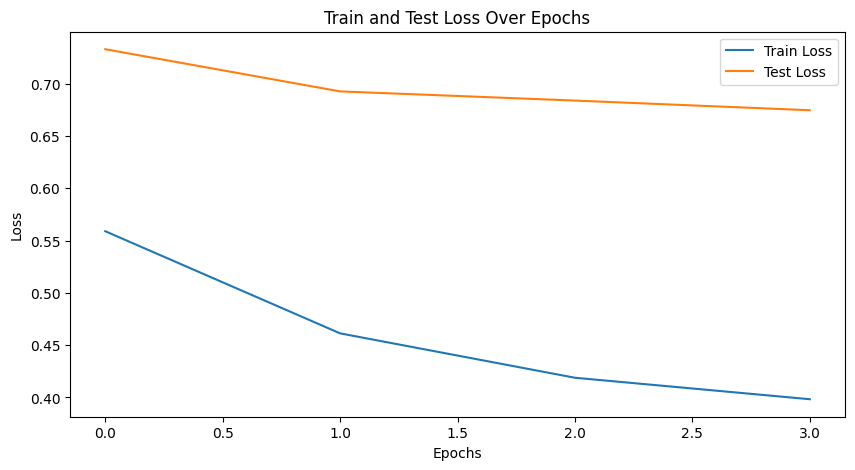

Accuracy: 0.63125
Sensitivity: 0.575
Specificity: 0.6875
PPV: 0.647887323943662
NPV: 0.6179775280898876
AUC: 0.71578125
Precision: 0.647887323943662
Recall: 0.575
F1-score: 0.609271523178808
Loss: 0.6746401429176331


In [16]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet101_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet101_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


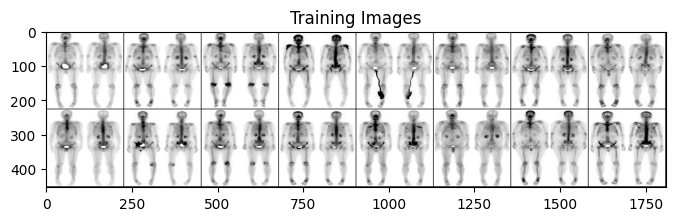

Labels: tensor([0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.5693045555098543, Test Loss: 0.5849590480327607
Epoch [2/4], Train Loss: 0.4832001892325369, Test Loss: 0.550981867313385
Epoch [3/4], Train Loss: 0.4401326928179241, Test Loss: 0.5747867405414582
Epoch [4/4], Train Loss: 0.41354555276774085, Test Loss: 0.604265320301056


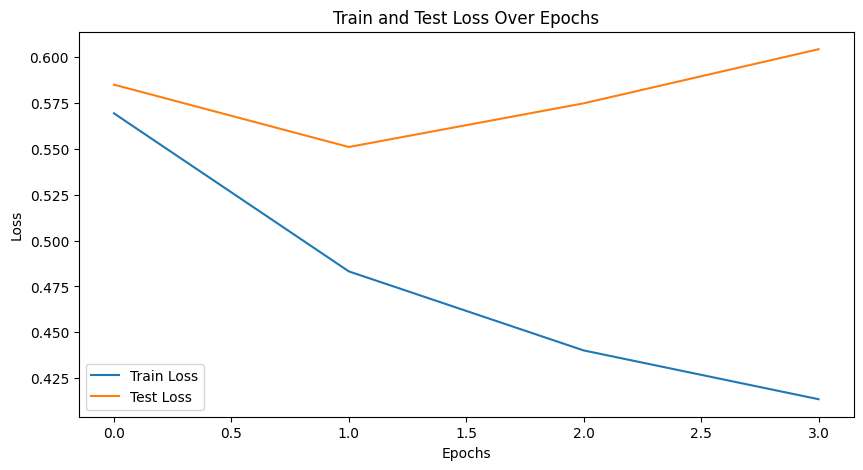

Accuracy: 0.66875
Sensitivity: 0.5125
Specificity: 0.825
PPV: 0.7454545454545455
NPV: 0.6285714285714286
AUC: 0.7693749999999999
Precision: 0.7454545454545455
Recall: 0.5125
F1-score: 0.6074074074074074
Loss: 0.604265320301056


In [17]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet101_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet101_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


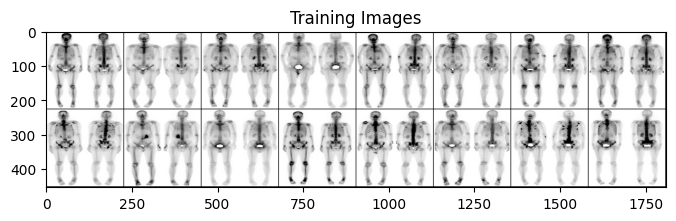

Labels: tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1])
Epoch [1/4], Train Loss: 0.5901896107978034, Test Loss: 0.8734458863735199
Epoch [2/4], Train Loss: 0.4967800163238951, Test Loss: 0.9120728656649589
Epoch [3/4], Train Loss: 0.4517146123627436, Test Loss: 1.2212901622056962
Epoch [4/4], Train Loss: 0.4223370603421359, Test Loss: 0.7932535827159881


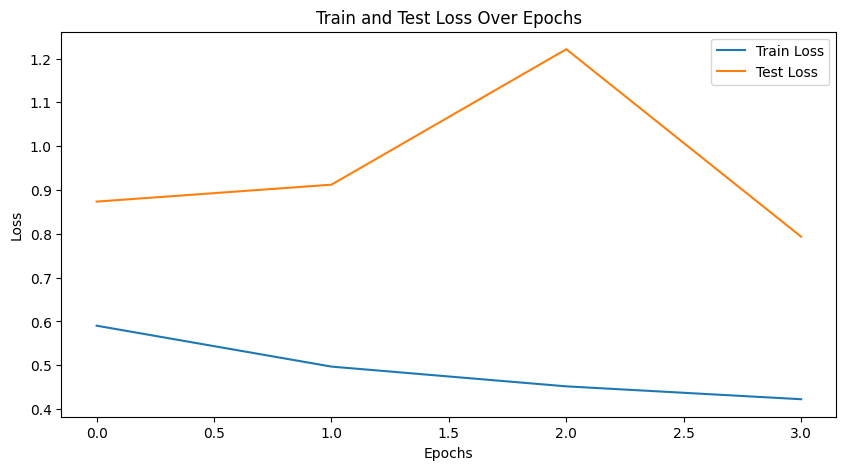

Accuracy: 0.6948051948051948
Sensitivity: 0.5714285714285714
Specificity: 0.8181818181818182
PPV: 0.7586206896551724
NPV: 0.65625
AUC: 0.734187890032046
Precision: 0.7586206896551724
Recall: 0.5714285714285714
F1-score: 0.6518518518518518
Loss: 0.7932535827159881


In [18]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet101_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet101_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


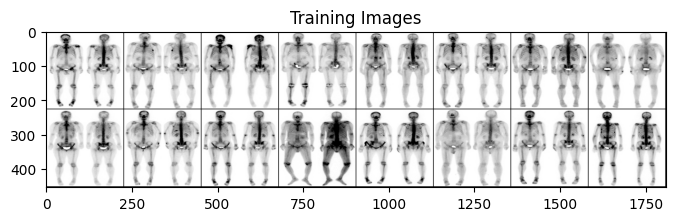

Labels: tensor([0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5818284003118288, Test Loss: 0.6869274199008941
Epoch [2/4], Train Loss: 0.4821232347161446, Test Loss: 0.5989445522427559
Epoch [3/4], Train Loss: 0.43432770571807056, Test Loss: 0.6174521625041962
Epoch [4/4], Train Loss: 0.42559961945686525, Test Loss: 0.5684660255908967


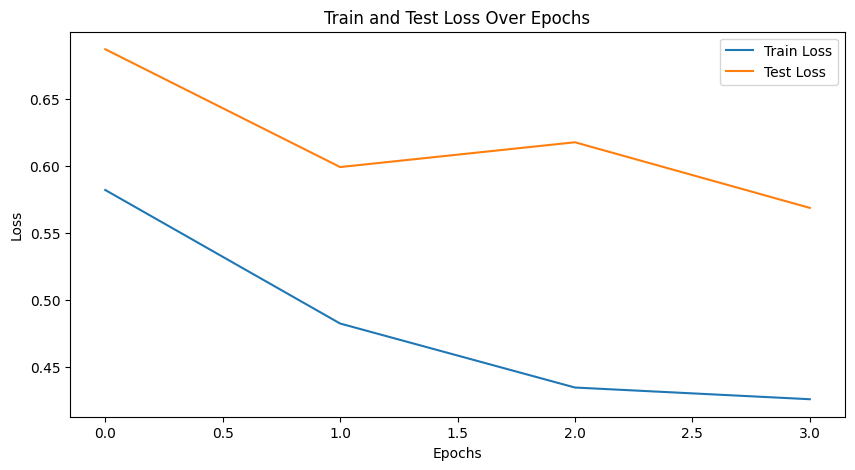

Accuracy: 0.7243589743589743
Sensitivity: 0.6538461538461539
Specificity: 0.7948717948717948
PPV: 0.7611940298507462
NPV: 0.6966292134831461
AUC: 0.8349769888231426
Precision: 0.7611940298507462
Recall: 0.6538461538461539
F1-score: 0.7034482758620689
Loss: 0.5684660255908967


In [19]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet101_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet101_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


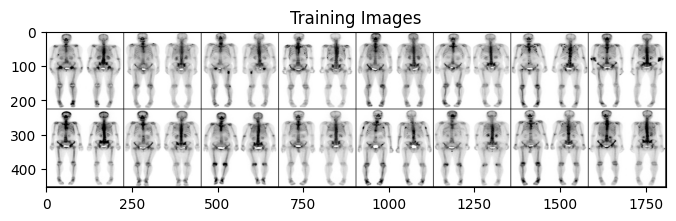

Labels: tensor([0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1])
Epoch [1/4], Train Loss: 0.5762856790741671, Test Loss: 0.5697940319776535
Epoch [2/4], Train Loss: 0.4798377919037944, Test Loss: 0.5953868895769119
Epoch [3/4], Train Loss: 0.44623654668481605, Test Loss: 0.5957054793834686
Epoch [4/4], Train Loss: 0.42502444074715223, Test Loss: 0.5659452438354492


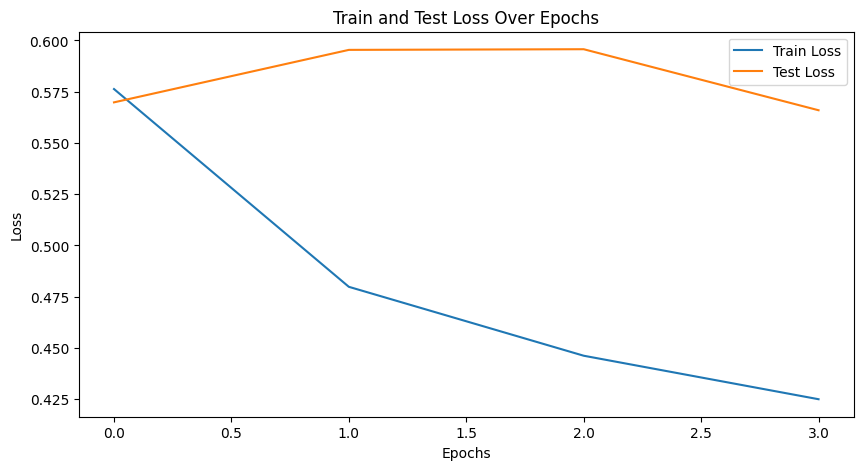

Accuracy: 0.7
Sensitivity: 0.5875
Specificity: 0.8125
PPV: 0.7580645161290323
NPV: 0.6632653061224489
AUC: 0.7934374999999999
Precision: 0.7580645161290323
Recall: 0.5875
F1-score: 0.6619718309859155
Loss: 0.5659452438354492


In [20]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet101_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet101(weights=ResNet101_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet101_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ResNet 152

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


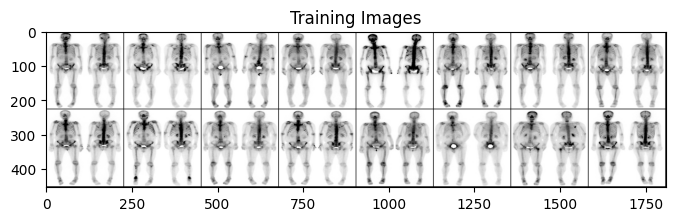

Labels: tensor([1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.562911356392416, Test Loss: 0.6006245017051697
Epoch [2/4], Train Loss: 0.45346955880884404, Test Loss: 0.6192030489444733
Epoch [3/4], Train Loss: 0.39721087116784265, Test Loss: 0.6346376806497573
Epoch [4/4], Train Loss: 0.36407820677873, Test Loss: 0.6291906654834747


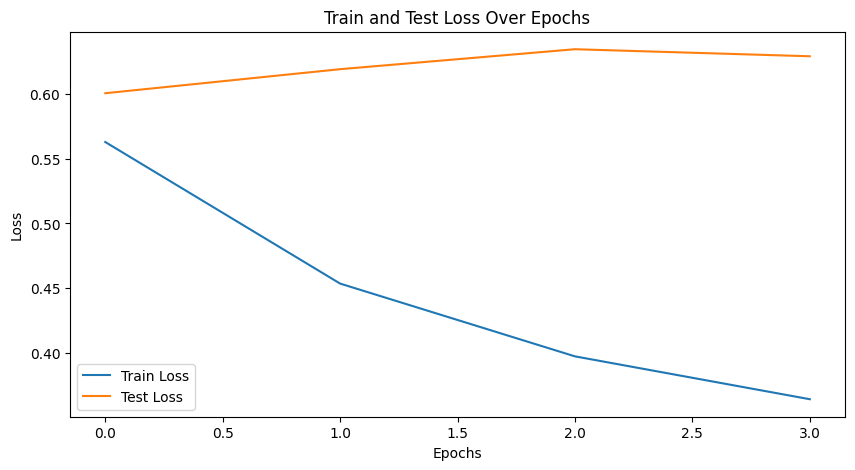

Accuracy: 0.675
Sensitivity: 0.6125
Specificity: 0.7375
PPV: 0.7
NPV: 0.6555555555555556
AUC: 0.7548437499999999
Precision: 0.7
Recall: 0.6125
F1-score: 0.6533333333333333
Loss: 0.6291906654834747


In [21]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet152_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet152(weights=ResNet152_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet152_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


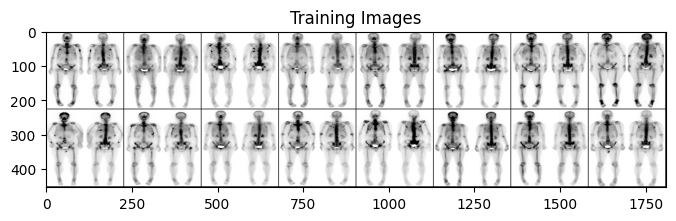

Labels: tensor([1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0])
Epoch [1/4], Train Loss: 0.5691694140578937, Test Loss: 0.6047733306884766
Epoch [2/4], Train Loss: 0.46596062845252095, Test Loss: 0.5993553966283798
Epoch [3/4], Train Loss: 0.4235613167792269, Test Loss: 0.632670384645462
Epoch [4/4], Train Loss: 0.39509243199836863, Test Loss: 0.6307148665189743


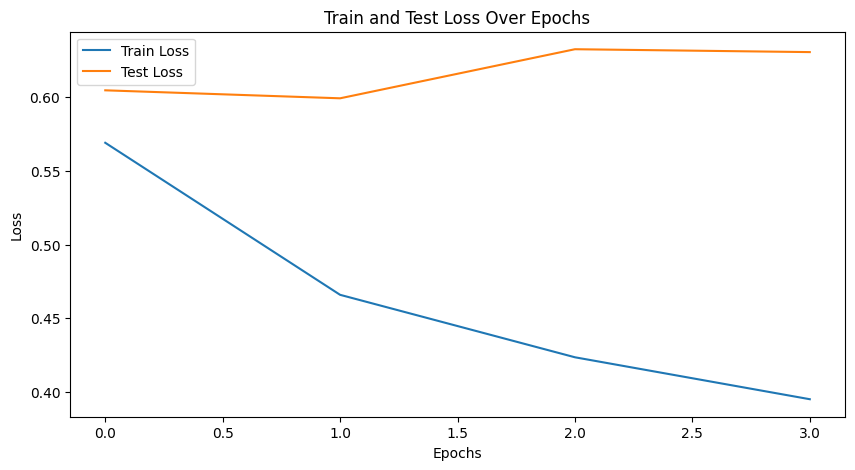

Accuracy: 0.6875
Sensitivity: 0.625
Specificity: 0.75
PPV: 0.7142857142857143
NPV: 0.6666666666666666
AUC: 0.76890625
Precision: 0.7142857142857143
Recall: 0.625
F1-score: 0.6666666666666666
Loss: 0.6307148665189743


In [22]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet152_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet152(weights=ResNet152_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet152_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


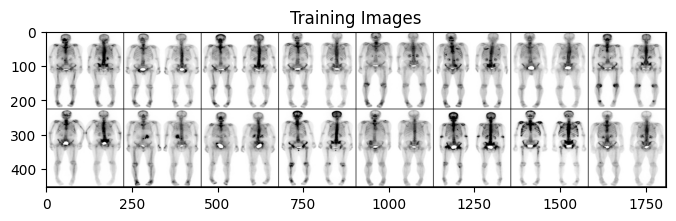

Labels: tensor([0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0])
Epoch [1/4], Train Loss: 0.5867948925610885, Test Loss: 0.621281698346138
Epoch [2/4], Train Loss: 0.4994735045051112, Test Loss: 0.5795620799064636
Epoch [3/4], Train Loss: 0.4494859650369408, Test Loss: 0.6740514010190963
Epoch [4/4], Train Loss: 0.4295712524247401, Test Loss: 0.6142679244279862


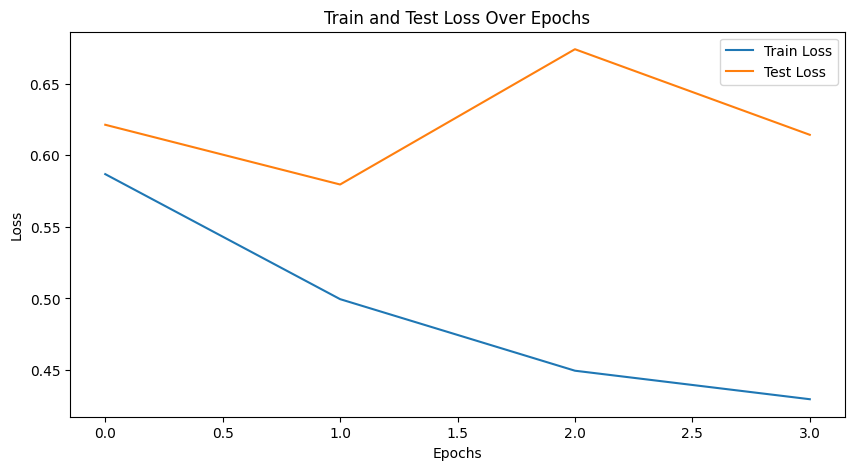

Accuracy: 0.6818181818181818
Sensitivity: 0.6493506493506493
Specificity: 0.7142857142857143
PPV: 0.6944444444444444
NPV: 0.6707317073170732
AUC: 0.7551020408163266
Precision: 0.6944444444444444
Recall: 0.6493506493506493
F1-score: 0.6711409395973155
Loss: 0.6142679244279862


In [23]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet152_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet152(weights=ResNet152_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet152_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


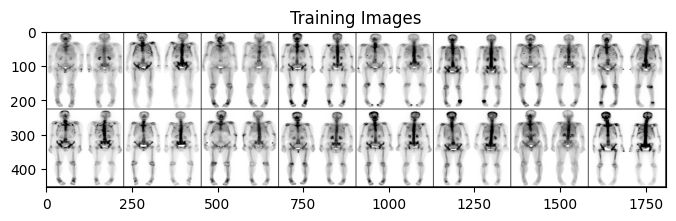

Labels: tensor([1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.5979489447567069, Test Loss: 0.5393494665622711
Epoch [2/4], Train Loss: 0.4933355422057573, Test Loss: 0.5429900884628296
Epoch [3/4], Train Loss: 0.4529991211749396, Test Loss: 0.6124254673719406
Epoch [4/4], Train Loss: 0.4272841302659905, Test Loss: 0.5625463008880616


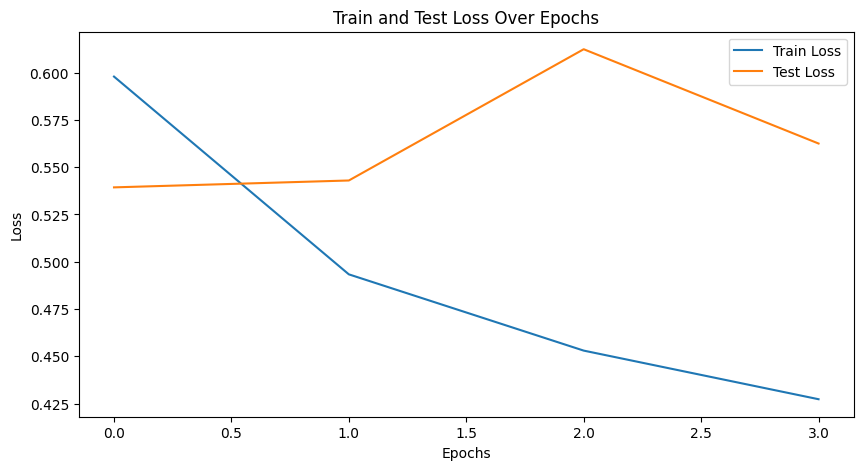

Accuracy: 0.7628205128205128
Sensitivity: 0.6666666666666666
Specificity: 0.8589743589743589
PPV: 0.8253968253968254
NPV: 0.7204301075268817
AUC: 0.8372781065088757
Precision: 0.8253968253968254
Recall: 0.6666666666666666
F1-score: 0.7375886524822695
Loss: 0.5625463008880616


In [24]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet152_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet152(weights=ResNet152_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet152_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


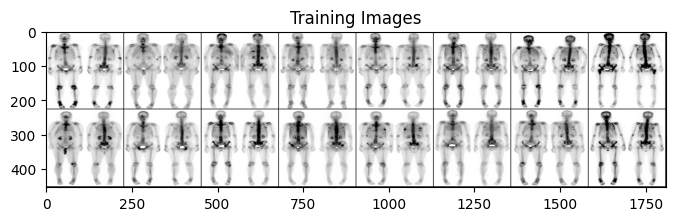

Labels: tensor([1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5677842095638942, Test Loss: 1.2935411304235458
Epoch [2/4], Train Loss: 0.46713956561192727, Test Loss: 0.7026656776666641
Epoch [3/4], Train Loss: 0.42623117218897183, Test Loss: 0.9028739124536515
Epoch [4/4], Train Loss: 0.40516313165426254, Test Loss: 0.8319671839475632


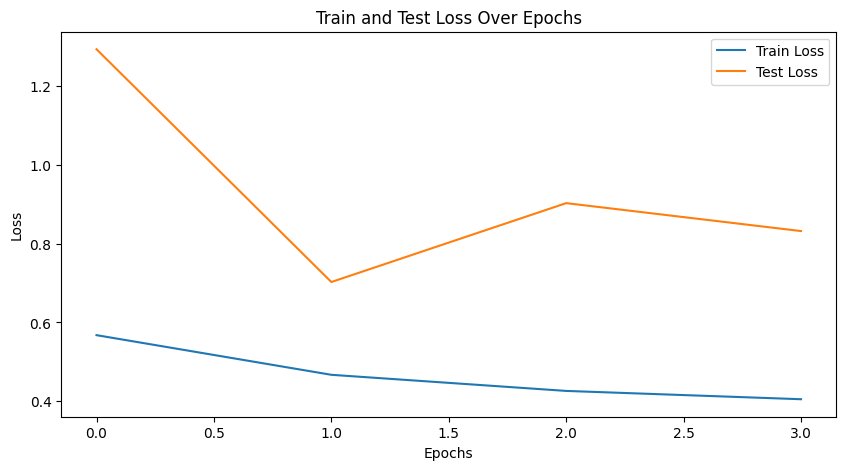

Accuracy: 0.625
Sensitivity: 0.5125
Specificity: 0.7375
PPV: 0.6612903225806451
NPV: 0.6020408163265306
AUC: 0.6817187499999999
Precision: 0.6612903225806451
Recall: 0.5125
F1-score: 0.5774647887323943
Loss: 0.8319671839475632


In [25]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models.resnet import ResNet152_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Model setup for Vision Transformer with Dropout
model = torchvision.models.resnet152(weights=ResNet152_Weights.DEFAULT)
model.conv1 = nn.Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
for param in model.parameters():
    param.requires_grad = False

fc_inputs = model.fc.in_features

# Modified final layers with BatchNorm and Dropout
model.fc = nn.Sequential(
    nn.Linear(fc_inputs, 512),   # Added an additional fully connected layer for demonstration
    nn.BatchNorm1d(512),         # Batch Normalization
    nn.ReLU(),                   # Activation function
    nn.Dropout(0.5),             # Dropout
    nn.Linear(512, num_classes)  # Final layer
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_resnet152_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Data-efficient Image Transformer

Using cache found in C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main
C:\Users\shlee\.conda\envs\bone\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main\models.py:62: UserWarning: Overwriting deit_tiny_patch16_224 in registry with models.deit_tiny_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main\models.py:77: UserWarning: Overwriting deit_small_patch16_224 in registry with models.deit_small_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main\models.p

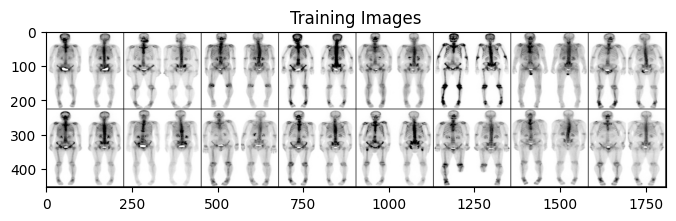

Labels: tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.6565350138591332, Test Loss: 0.6804902672767639
Epoch [2/4], Train Loss: 0.5083142375410761, Test Loss: 0.6766503781080246
Epoch [3/4], Train Loss: 0.40733398916651903, Test Loss: 0.6981133639812469
Epoch [4/4], Train Loss: 0.30045249502997373, Test Loss: 0.7653256386518479


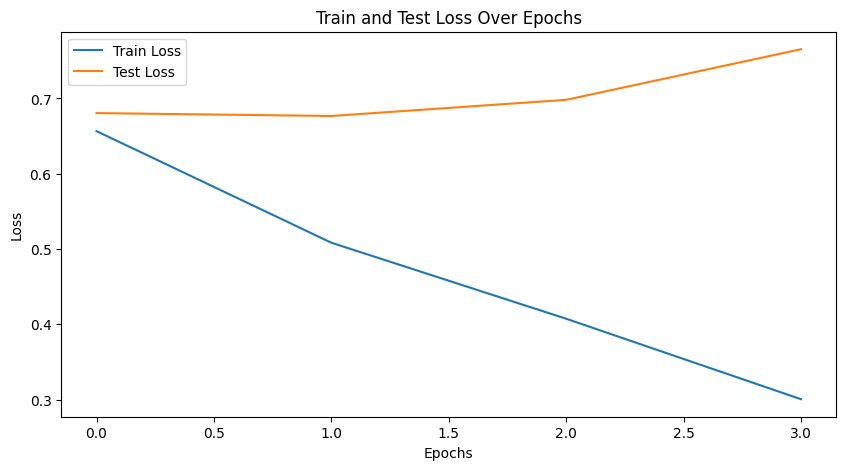

Accuracy: 0.68125
Sensitivity: 0.5875
Specificity: 0.775
PPV: 0.7230769230769231
NPV: 0.6526315789473685
AUC: 0.7675
Precision: 0.7230769230769231
Recall: 0.5875
F1-score: 0.6482758620689656
Loss: 0.7653256386518479


In [26]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Load the DeiT model using torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)

# Modify the classifier head with Dropout
num_features = model.head.in_features
model.head = nn.Sequential(
    nn.Dropout(0.5),  # Adding Dropout with a probability of 0.5
    nn.Linear(num_features, 2)  # Final classifier layer
)

# Adjust the patch embedding layer for 1-channel grayscale input
patch_embed = model.patch_embed
new_conv_layer = nn.Conv2d(3, patch_embed.proj.out_channels, kernel_size=patch_embed.proj.kernel_size, 
                           stride=patch_embed.proj.stride, padding=patch_embed.proj.padding, bias=False)
model.patch_embed.proj = new_conv_layer

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Move the model to the device (GPU/CPU)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_DeiT1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Using cache found in C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


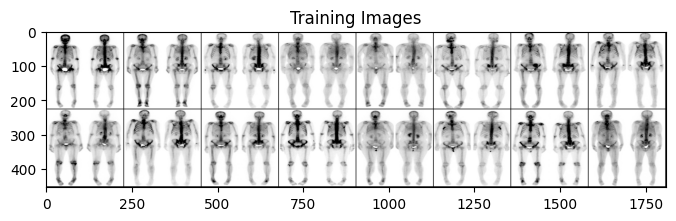

Labels: tensor([1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0])
Epoch [1/4], Train Loss: 0.6548886599326597, Test Loss: 0.669932633638382
Epoch [2/4], Train Loss: 0.5514002788486412, Test Loss: 0.6866479098796845
Epoch [3/4], Train Loss: 0.47269917133002026, Test Loss: 0.6501510232686997
Epoch [4/4], Train Loss: 0.37693116126708615, Test Loss: 0.7504317313432693


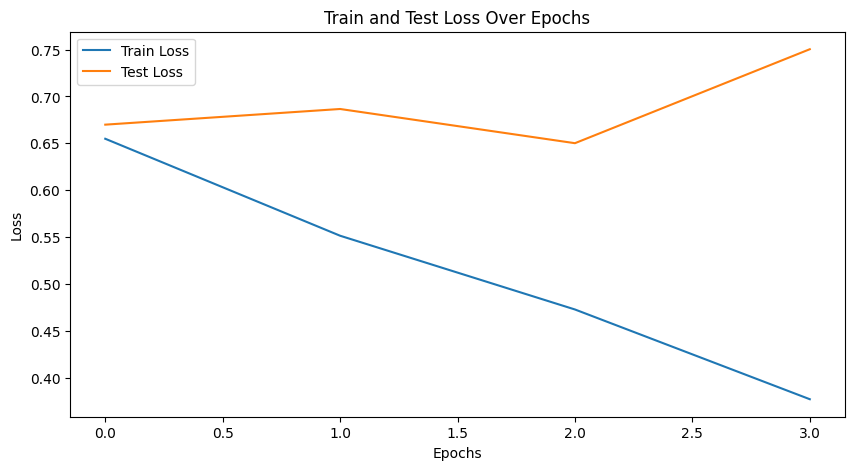

Accuracy: 0.6375
Sensitivity: 0.5
Specificity: 0.775
PPV: 0.6896551724137931
NPV: 0.6078431372549019
AUC: 0.7335937499999999
Precision: 0.6896551724137931
Recall: 0.5
F1-score: 0.5797101449275363
Loss: 0.7504317313432693


In [27]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Load the DeiT model using torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)

# Modify the classifier head with Dropout
num_features = model.head.in_features
model.head = nn.Sequential(
    nn.Dropout(0.5),  # Adding Dropout with a probability of 0.5
    nn.Linear(num_features, 2)  # Final classifier layer
)

# Adjust the patch embedding layer for 1-channel grayscale input
patch_embed = model.patch_embed
new_conv_layer = nn.Conv2d(3, patch_embed.proj.out_channels, kernel_size=patch_embed.proj.kernel_size, 
                           stride=patch_embed.proj.stride, padding=patch_embed.proj.padding, bias=False)
model.patch_embed.proj = new_conv_layer

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Move the model to the device (GPU/CPU)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_DeiT2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Using cache found in C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


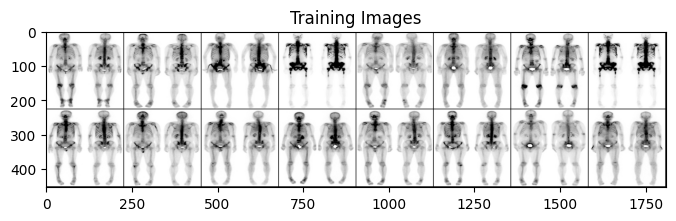

Labels: tensor([0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.6730020689298806, Test Loss: 0.6132882535457611
Epoch [2/4], Train Loss: 0.5330088773326388, Test Loss: 0.6865497142076492
Epoch [3/4], Train Loss: 0.4260540360819946, Test Loss: 0.6502243936061859
Epoch [4/4], Train Loss: 0.29483413431359434, Test Loss: 0.7636289402842522


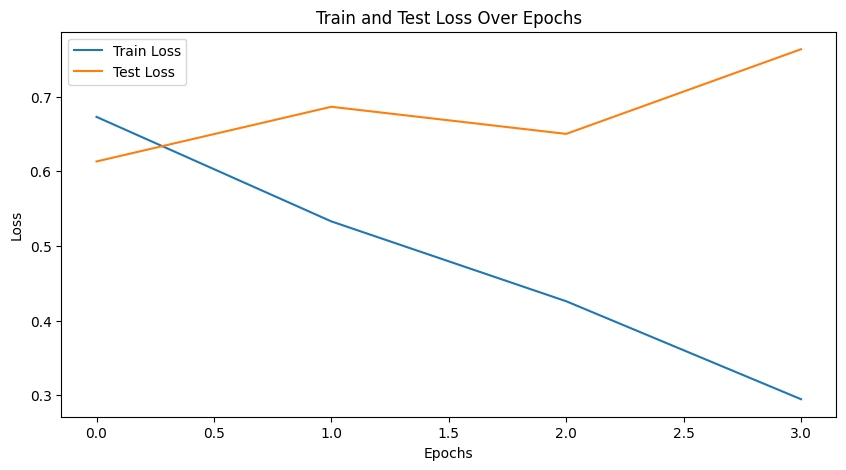

Accuracy: 0.7077922077922078
Sensitivity: 0.5974025974025974
Specificity: 0.8181818181818182
PPV: 0.7666666666666667
NPV: 0.6702127659574468
AUC: 0.7684263788159891
Precision: 0.7666666666666667
Recall: 0.5974025974025974
F1-score: 0.6715328467153285
Loss: 0.7636289402842522


In [28]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Load the DeiT model using torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)

# Modify the classifier head with Dropout
num_features = model.head.in_features
model.head = nn.Sequential(
    nn.Dropout(0.5),  # Adding Dropout with a probability of 0.5
    nn.Linear(num_features, 2)  # Final classifier layer
)

# Adjust the patch embedding layer for 1-channel grayscale input
patch_embed = model.patch_embed
new_conv_layer = nn.Conv2d(3, patch_embed.proj.out_channels, kernel_size=patch_embed.proj.kernel_size, 
                           stride=patch_embed.proj.stride, padding=patch_embed.proj.padding, bias=False)
model.patch_embed.proj = new_conv_layer

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Move the model to the device (GPU/CPU)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_DeiT3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Using cache found in C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


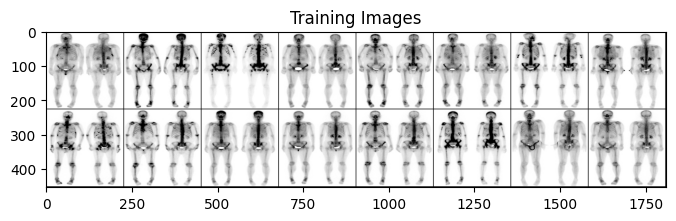

Labels: tensor([1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.6665472037439207, Test Loss: 0.5831924170255661
Epoch [2/4], Train Loss: 0.5732805992937783, Test Loss: 0.6284191817045212
Epoch [3/4], Train Loss: 0.47552686817582374, Test Loss: 0.4859945446252823
Epoch [4/4], Train Loss: 0.3747013600416554, Test Loss: 0.4567814737558365


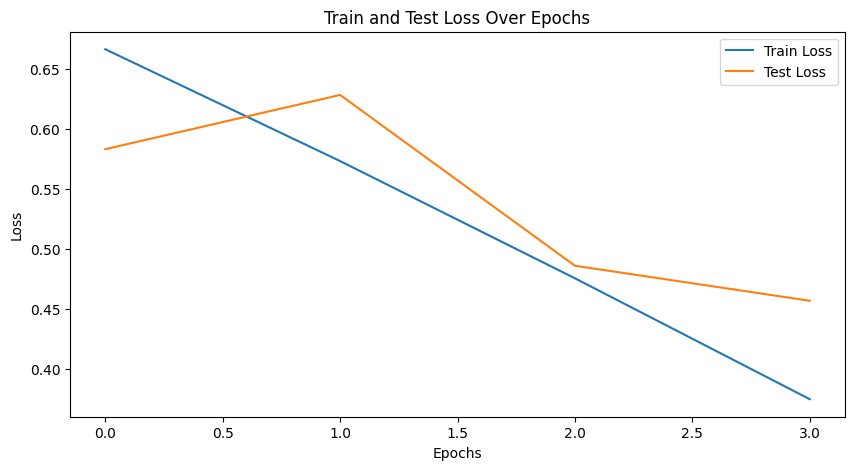

Accuracy: 0.8205128205128205
Sensitivity: 0.7307692307692307
Specificity: 0.9102564102564102
PPV: 0.890625
NPV: 0.7717391304347826
AUC: 0.8783694937541091
Precision: 0.890625
Recall: 0.7307692307692307
F1-score: 0.8028169014084506
Loss: 0.4567814737558365


In [29]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Load the DeiT model using torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)

# Modify the classifier head with Dropout
num_features = model.head.in_features
model.head = nn.Sequential(
    nn.Dropout(0.5),  # Adding Dropout with a probability of 0.5
    nn.Linear(num_features, 2)  # Final classifier layer
)

# Adjust the patch embedding layer for 1-channel grayscale input
patch_embed = model.patch_embed
new_conv_layer = nn.Conv2d(3, patch_embed.proj.out_channels, kernel_size=patch_embed.proj.kernel_size, 
                           stride=patch_embed.proj.stride, padding=patch_embed.proj.padding, bias=False)
model.patch_embed.proj = new_conv_layer

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Move the model to the device (GPU/CPU)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_DeiT4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Using cache found in C:\Users\shlee/.cache\torch\hub\facebookresearch_deit_main
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


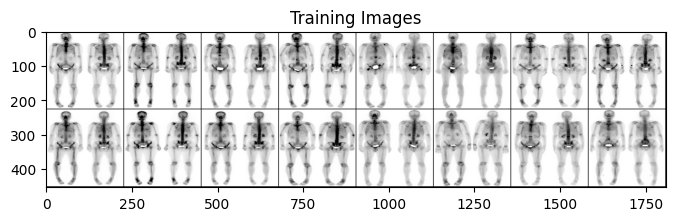

Labels: tensor([1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.6627578508940716, Test Loss: 0.8105328187346459
Epoch [2/4], Train Loss: 0.5625403800852669, Test Loss: 0.6768275201320648
Epoch [3/4], Train Loss: 0.47034498119672524, Test Loss: 0.7296492330729961
Epoch [4/4], Train Loss: 0.35132546394665554, Test Loss: 0.9212218023836612


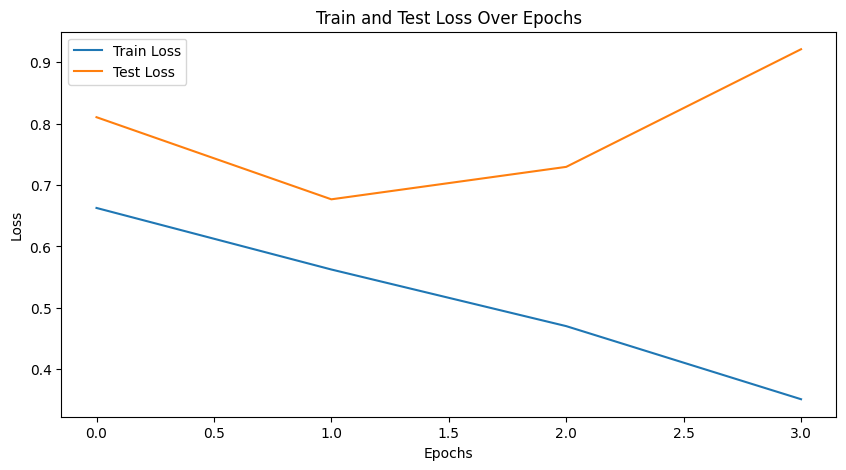

Accuracy: 0.69375
Sensitivity: 0.5125
Specificity: 0.875
PPV: 0.803921568627451
NPV: 0.6422018348623854
AUC: 0.7468750000000001
Precision: 0.803921568627451
Recall: 0.5125
F1-score: 0.6259541984732824
Loss: 0.9212218023836612


In [30]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Load the DeiT model using torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)

# Modify the classifier head with Dropout
num_features = model.head.in_features
model.head = nn.Sequential(
    nn.Dropout(0.5),  # Adding Dropout with a probability of 0.5
    nn.Linear(num_features, 2)  # Final classifier layer
)

# Adjust the patch embedding layer for 1-channel grayscale input
patch_embed = model.patch_embed
new_conv_layer = nn.Conv2d(3, patch_embed.proj.out_channels, kernel_size=patch_embed.proj.kernel_size, 
                           stride=patch_embed.proj.stride, padding=patch_embed.proj.padding, bias=False)
model.patch_embed.proj = new_conv_layer

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Move the model to the device (GPU/CPU)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_DeiT5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ViT Base 16

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


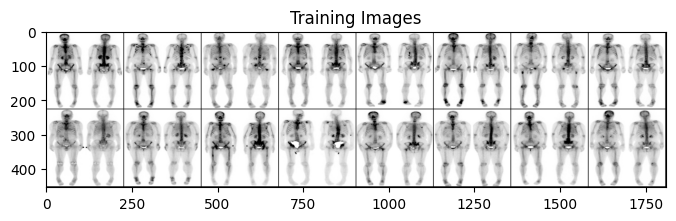

Labels: tensor([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5576355868353716, Test Loss: 0.5301057398319244
Epoch [2/4], Train Loss: 0.29309066649960375, Test Loss: 0.6539370954036713
Epoch [3/4], Train Loss: 0.12613966204259924, Test Loss: 0.9833496958017349
Epoch [4/4], Train Loss: 0.02639734850315099, Test Loss: 1.4681355386972428


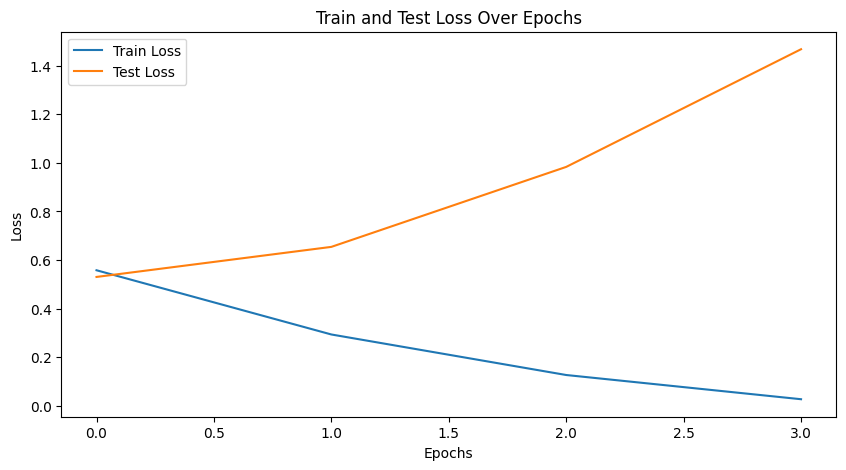

Accuracy: 0.73125
Sensitivity: 0.5625
Specificity: 0.9
PPV: 0.8490566037735849
NPV: 0.6728971962616822
AUC: 0.8501562500000001
Precision: 0.8490566037735849
Recall: 0.5625
F1-score: 0.6766917293233082
Loss: 1.4681355386972428


In [31]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_16_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


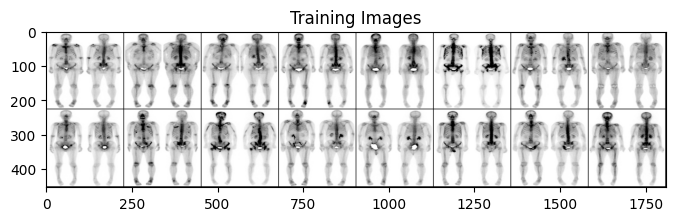

Labels: tensor([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.4174450027747351, Test Loss: 0.6168968945741653
Epoch [2/4], Train Loss: 0.18702292686906977, Test Loss: 0.6049345046281814
Epoch [3/4], Train Loss: 0.06479375600618156, Test Loss: 0.5988726444542408
Epoch [4/4], Train Loss: 0.013235711160764942, Test Loss: 0.7485315669327974


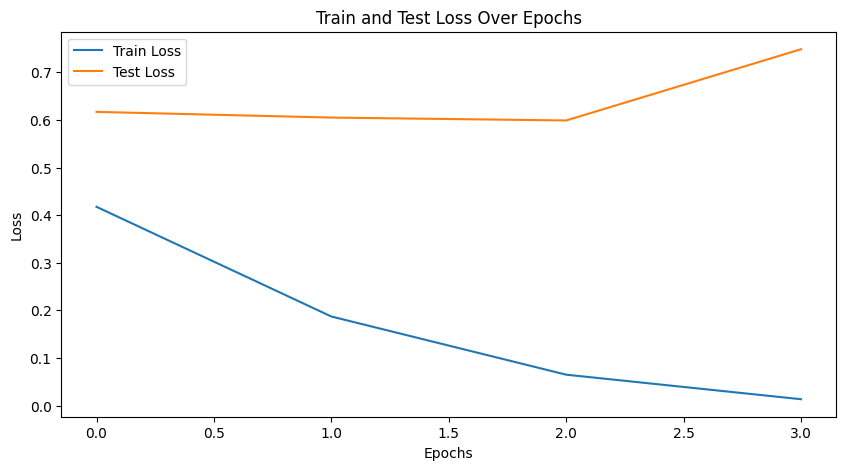

Accuracy: 0.825
Sensitivity: 0.7125
Specificity: 0.9375
PPV: 0.9193548387096774
NPV: 0.7653061224489796
AUC: 0.92046875
Precision: 0.9193548387096774
Recall: 0.7125
F1-score: 0.8028169014084507
Loss: 0.7485315669327974


In [32]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_16_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


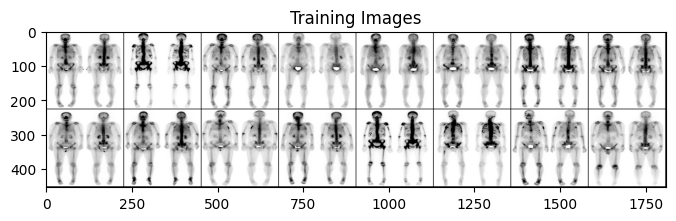

Labels: tensor([0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.45545640757795675, Test Loss: 0.7222655430436135
Epoch [2/4], Train Loss: 0.23180002937075292, Test Loss: 0.4806650459766388
Epoch [3/4], Train Loss: 0.08898448863632422, Test Loss: 0.9829813171643764
Epoch [4/4], Train Loss: 0.016456362609177922, Test Loss: 1.2766340636648237


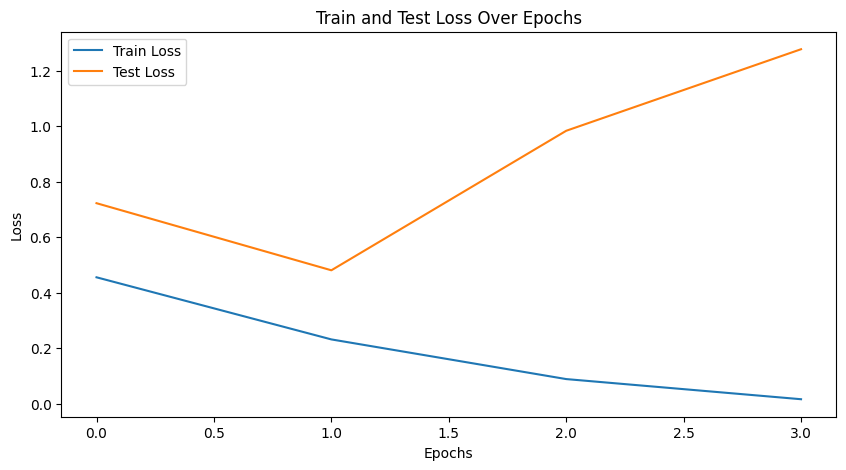

Accuracy: 0.7922077922077922
Sensitivity: 0.5974025974025974
Specificity: 0.987012987012987
PPV: 0.9787234042553191
NPV: 0.7102803738317757
AUC: 0.9293304098498903
Precision: 0.9787234042553191
Recall: 0.5974025974025974
F1-score: 0.7419354838709679
Loss: 1.2766340636648237


In [33]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_16_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


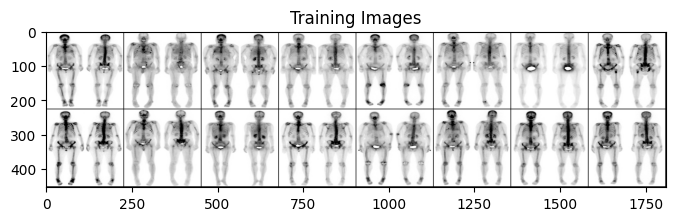

Labels: tensor([0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5539121427618473, Test Loss: 0.46854753941297533
Epoch [2/4], Train Loss: 0.3159186167154208, Test Loss: 0.4164603278040886
Epoch [3/4], Train Loss: 0.1528981189668468, Test Loss: 0.6095416327938438
Epoch [4/4], Train Loss: 0.04282752920515175, Test Loss: 0.687935832189396


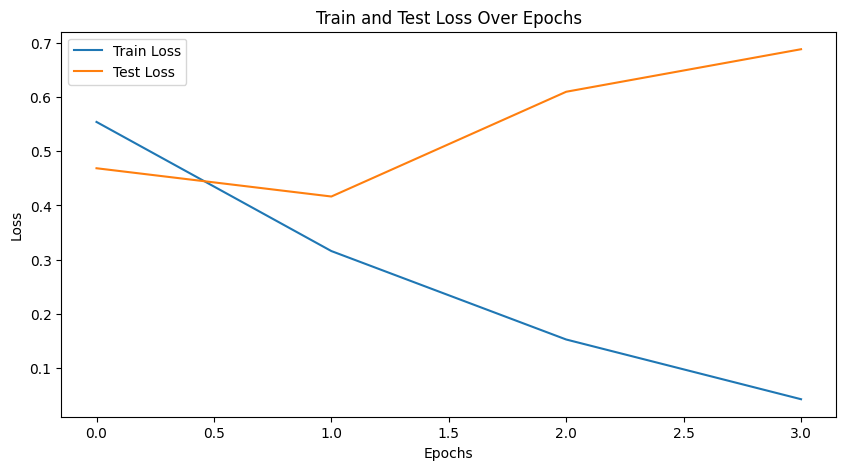

Accuracy: 0.8397435897435898
Sensitivity: 0.7307692307692307
Specificity: 0.9487179487179487
PPV: 0.9344262295081968
NPV: 0.7789473684210526
AUC: 0.9150230111768574
Precision: 0.9344262295081968
Recall: 0.7307692307692307
F1-score: 0.8201438848920862
Loss: 0.687935832189396


In [34]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_16_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


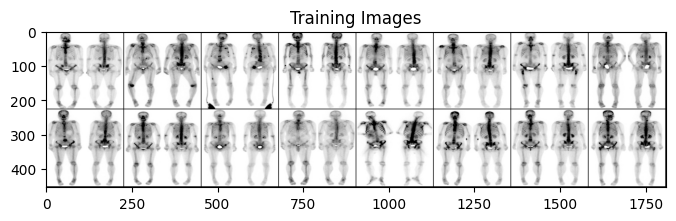

Labels: tensor([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1])
Epoch [1/4], Train Loss: 0.41133309206337604, Test Loss: 0.8395525585860014
Epoch [2/4], Train Loss: 0.16839106333638695, Test Loss: 1.3883378332247958
Epoch [3/4], Train Loss: 0.05608173001153385, Test Loss: 0.893620332190767
Epoch [4/4], Train Loss: 0.010004166262413633, Test Loss: 1.2280775840335991


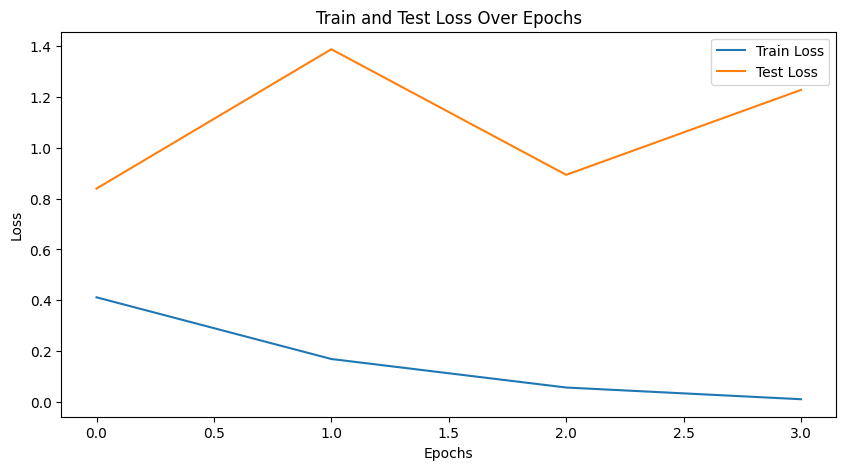

Accuracy: 0.7875
Sensitivity: 0.575
Specificity: 1.0
PPV: 1.0
NPV: 0.7017543859649122
AUC: 0.8981250000000001
Precision: 1.0
Recall: 0.575
F1-score: 0.7301587301587301
Loss: 1.2280775840335991


In [35]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_16, ViT_B_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_16_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ViT Base 32

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


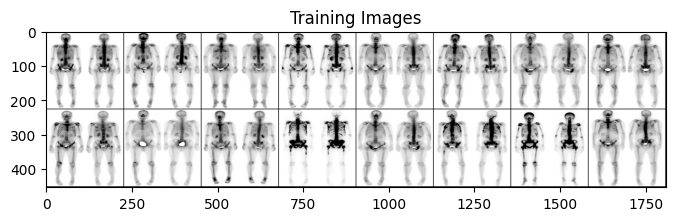

Labels: tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.7233435414659167, Test Loss: 0.6932301104068757
Epoch [2/4], Train Loss: 0.6915932266602238, Test Loss: 0.6928871929645538
Epoch [3/4], Train Loss: 0.6858068770430621, Test Loss: 0.6698964536190033
Epoch [4/4], Train Loss: 0.6497165481876401, Test Loss: 0.6504579067230225


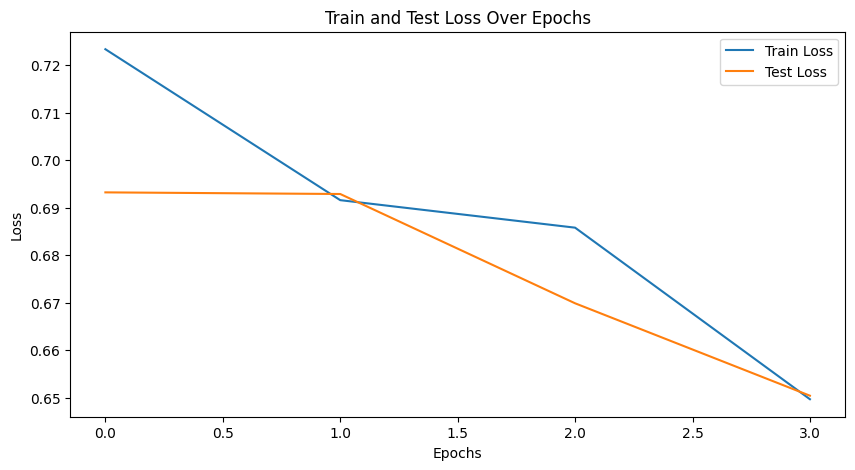

Accuracy: 0.60625
Sensitivity: 0.425
Specificity: 0.7875
PPV: 0.6666666666666666
NPV: 0.5779816513761468
AUC: 0.67796875
Precision: 0.6666666666666666
Recall: 0.425
F1-score: 0.5190839694656489
Loss: 0.6504579067230225


In [6]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_32, ViT_B_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_32_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


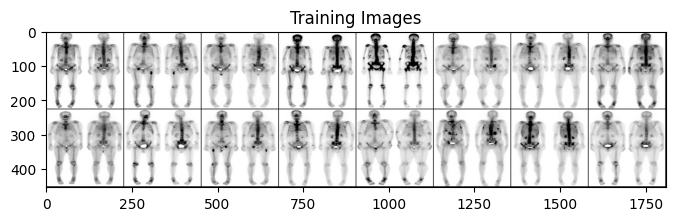

Labels: tensor([1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1])
Epoch [1/4], Train Loss: 0.7117138678587757, Test Loss: 0.7090816736221314
Epoch [2/4], Train Loss: 0.6709892500228095, Test Loss: 0.6490713804960251
Epoch [3/4], Train Loss: 0.5760761468300541, Test Loss: 0.6004975974559784
Epoch [4/4], Train Loss: 0.44722537544456503, Test Loss: 0.6784203708171844


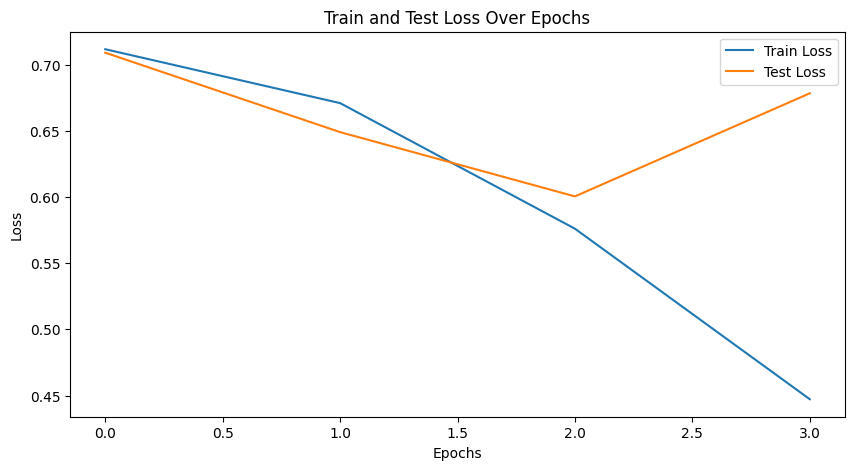

Accuracy: 0.68125
Sensitivity: 0.4875
Specificity: 0.875
PPV: 0.7959183673469388
NPV: 0.6306306306306306
AUC: 0.78078125
Precision: 0.7959183673469388
Recall: 0.4875
F1-score: 0.6046511627906976
Loss: 0.6784203708171844


In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_32, ViT_B_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_32_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


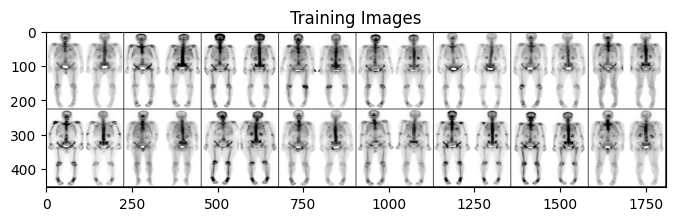

Labels: tensor([0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1])
Epoch [1/4], Train Loss: 0.7154804006652925, Test Loss: 0.6824125707149505
Epoch [2/4], Train Loss: 0.6547050881877686, Test Loss: 0.6959402740001679
Epoch [3/4], Train Loss: 0.5349264061711367, Test Loss: 0.713978698849678
Epoch [4/4], Train Loss: 0.4232535798428128, Test Loss: 0.8092405587434769


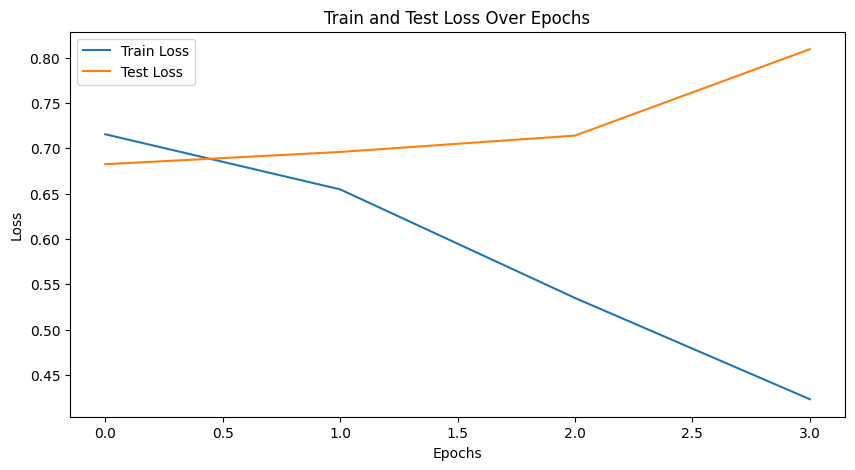

Accuracy: 0.6558441558441559
Sensitivity: 0.42857142857142855
Specificity: 0.8831168831168831
PPV: 0.7857142857142857
NPV: 0.6071428571428571
AUC: 0.7011300387923763
Precision: 0.7857142857142857
Recall: 0.42857142857142855
F1-score: 0.5546218487394958
Loss: 0.8092405587434769


In [3]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_32, ViT_B_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_32_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


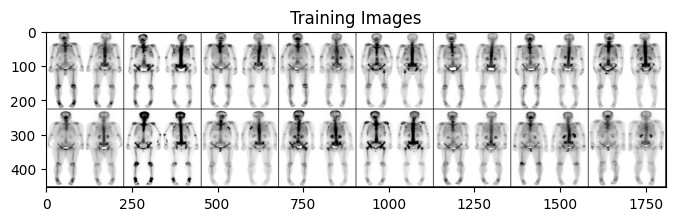

Labels: tensor([1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.7180294325774156, Test Loss: 0.6907595723867417
Epoch [2/4], Train Loss: 0.6569171293991284, Test Loss: 0.617273598909378
Epoch [3/4], Train Loss: 0.5560138302592976, Test Loss: 0.5762651860713959
Epoch [4/4], Train Loss: 0.438082323943093, Test Loss: 0.48555109202861785


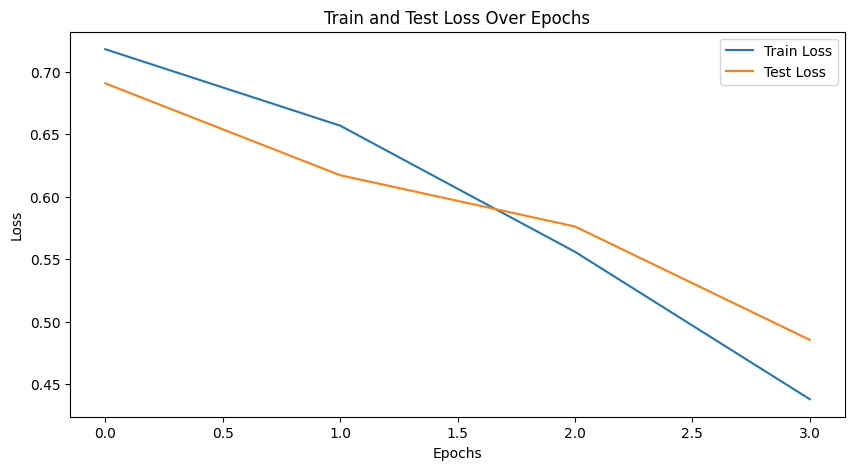

Accuracy: 0.7756410256410257
Sensitivity: 0.717948717948718
Specificity: 0.8333333333333334
PPV: 0.8115942028985508
NPV: 0.7471264367816092
AUC: 0.844181459566075
Precision: 0.8115942028985508
Recall: 0.717948717948718
F1-score: 0.7619047619047619
Loss: 0.48555109202861785


In [4]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_32, ViT_B_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_32_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


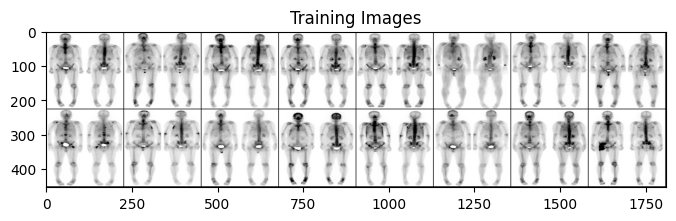

Labels: tensor([0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.7149474062387225, Test Loss: 0.6967495262622834
Epoch [2/4], Train Loss: 0.6565997299638767, Test Loss: 0.6506784051656723
Epoch [3/4], Train Loss: 0.5523796780306158, Test Loss: 0.7319007456302643
Epoch [4/4], Train Loss: 0.4271834078018816, Test Loss: 0.5983684167265892


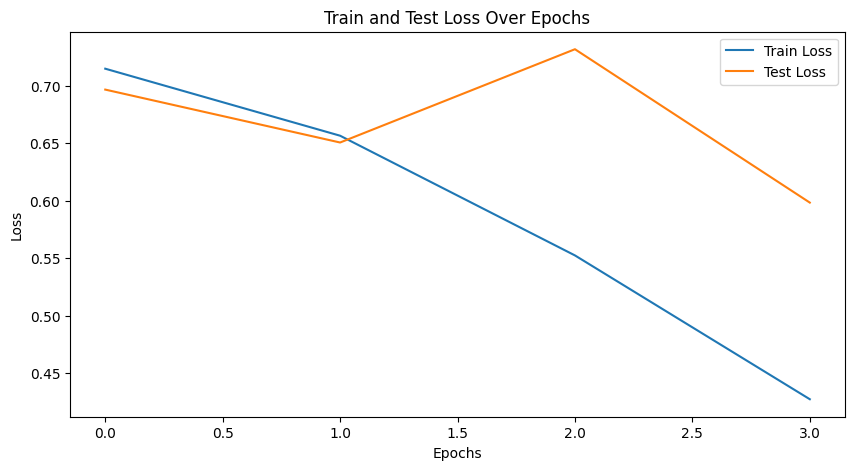

Accuracy: 0.75625
Sensitivity: 0.625
Specificity: 0.8875
PPV: 0.847457627118644
NPV: 0.7029702970297029
AUC: 0.7834375
Precision: 0.847457627118644
Recall: 0.625
F1-score: 0.7194244604316545
Loss: 0.5983684167265892


In [5]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_b_32, ViT_B_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_b_32(weights=ViT_B_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_b_32_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ViT Large 16

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


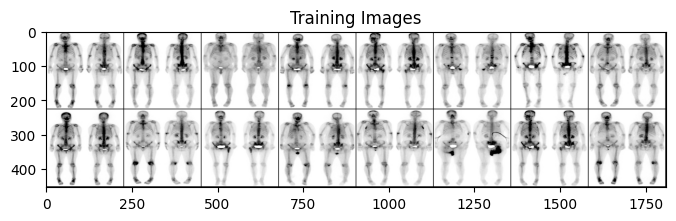

Labels: tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.37060504826011803, Test Loss: 0.617667656391859
Epoch [2/4], Train Loss: 0.1305150708587144, Test Loss: 0.7518939264118671
Epoch [3/4], Train Loss: 0.03570387207533378, Test Loss: 1.326066128257662
Epoch [4/4], Train Loss: 0.006084221166187914, Test Loss: 1.5056521811755375


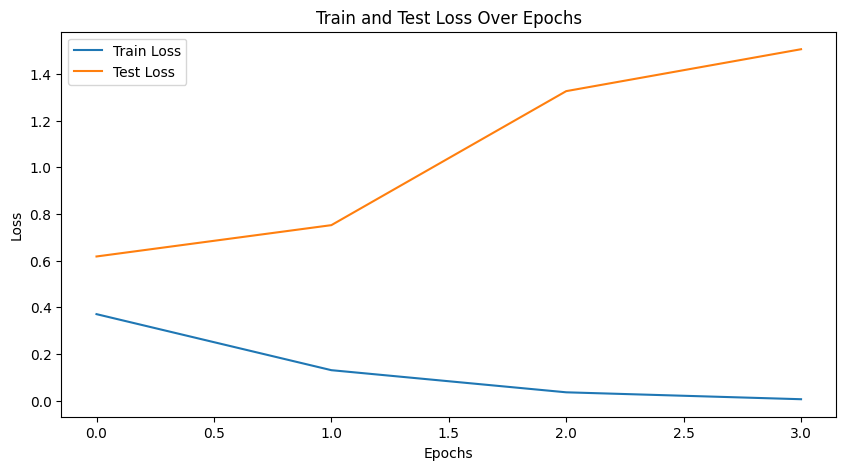

Accuracy: 0.78125
Sensitivity: 0.625
Specificity: 0.9375
PPV: 0.9090909090909091
NPV: 0.7142857142857143
AUC: 0.85765625
Precision: 0.9090909090909091
Recall: 0.625
F1-score: 0.7407407407407406
Loss: 1.5056521811755375


In [41]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, ViT_L_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_16(weights=ViT_L_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_16_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


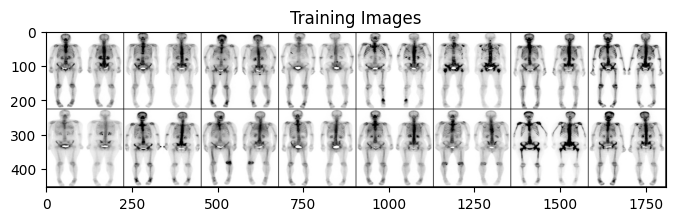

Labels: tensor([0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1])
Epoch [1/4], Train Loss: 0.3886680871257287, Test Loss: 0.7316989205777645
Epoch [2/4], Train Loss: 0.14063512219412216, Test Loss: 1.2396349018672481
Epoch [3/4], Train Loss: 0.03415964653283737, Test Loss: 1.0289610772044397
Epoch [4/4], Train Loss: 0.0076385232315234015, Test Loss: 1.1874961929162964


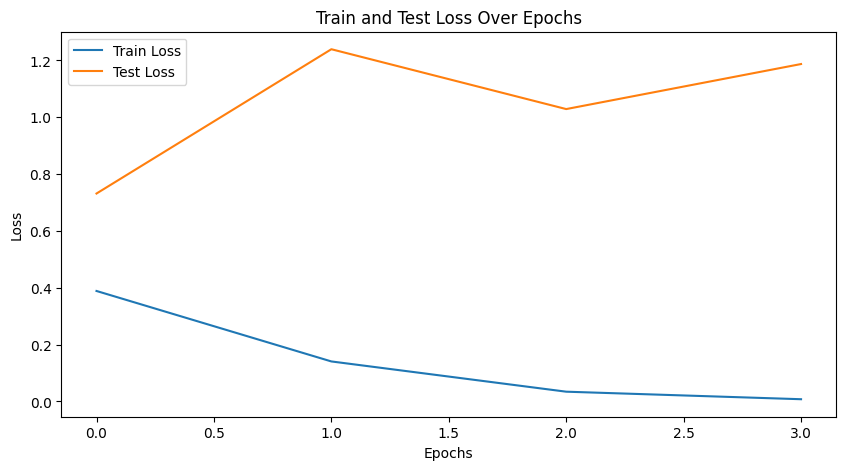

Accuracy: 0.775
Sensitivity: 0.6
Specificity: 0.95
PPV: 0.9230769230769231
NPV: 0.7037037037037037
AUC: 0.92359375
Precision: 0.9230769230769231
Recall: 0.6
F1-score: 0.7272727272727274
Loss: 1.1874961929162964


In [42]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, ViT_L_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_16(weights=ViT_L_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_16_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


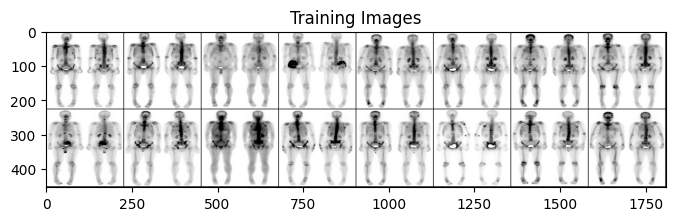

Labels: tensor([0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.3648616701626734, Test Loss: 0.42902760207653046
Epoch [2/4], Train Loss: 0.1312958147736759, Test Loss: 1.1045962893054821
Epoch [3/4], Train Loss: 0.03980910264917573, Test Loss: 0.4831669110804796
Epoch [4/4], Train Loss: 0.005489078304440094, Test Loss: 0.7982963831629604


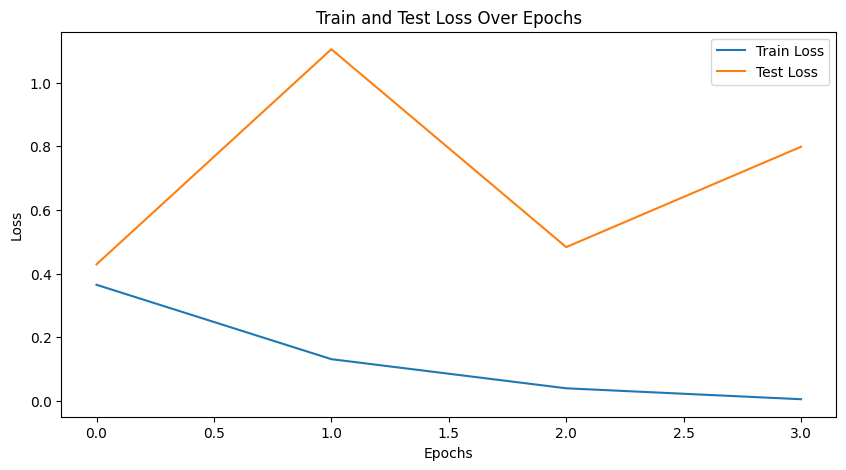

Accuracy: 0.8571428571428571
Sensitivity: 0.7402597402597403
Specificity: 0.974025974025974
PPV: 0.9661016949152542
NPV: 0.7894736842105263
AUC: 0.9372575476471581
Precision: 0.9661016949152542
Recall: 0.7402597402597403
F1-score: 0.8382352941176471
Loss: 0.7982963831629604


In [43]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, ViT_L_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_16(weights=ViT_L_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_16_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


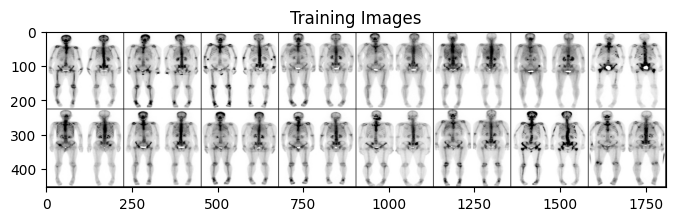

Labels: tensor([0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0])
Epoch [1/4], Train Loss: 0.35979482795572976, Test Loss: 0.4861312131397426
Epoch [2/4], Train Loss: 0.12984782677933288, Test Loss: 0.4423489134758711
Epoch [3/4], Train Loss: 0.03441606733631665, Test Loss: 0.5810840678634122
Epoch [4/4], Train Loss: 0.006353039877511532, Test Loss: 0.6505181063897908


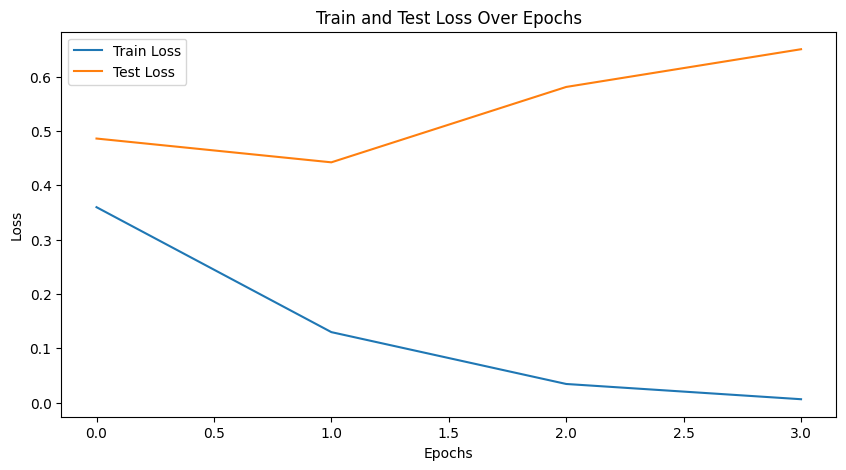

Accuracy: 0.8782051282051282
Sensitivity: 0.7692307692307693
Specificity: 0.9871794871794872
PPV: 0.9836065573770492
NPV: 0.8105263157894737
AUC: 0.967784352399737
Precision: 0.9836065573770492
Recall: 0.7692307692307693
F1-score: 0.8633093525179856
Loss: 0.6505181063897908


In [44]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, ViT_L_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_16(weights=ViT_L_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_16_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


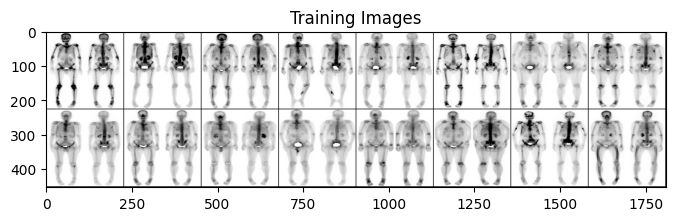

Labels: tensor([1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.38623202736805945, Test Loss: 0.580407141521573
Epoch [2/4], Train Loss: 0.13203596715302235, Test Loss: 0.6636846333742141
Epoch [3/4], Train Loss: 0.03702399682616196, Test Loss: 0.8427055470645428
Epoch [4/4], Train Loss: 0.003492519554658906, Test Loss: 1.6906363649482956


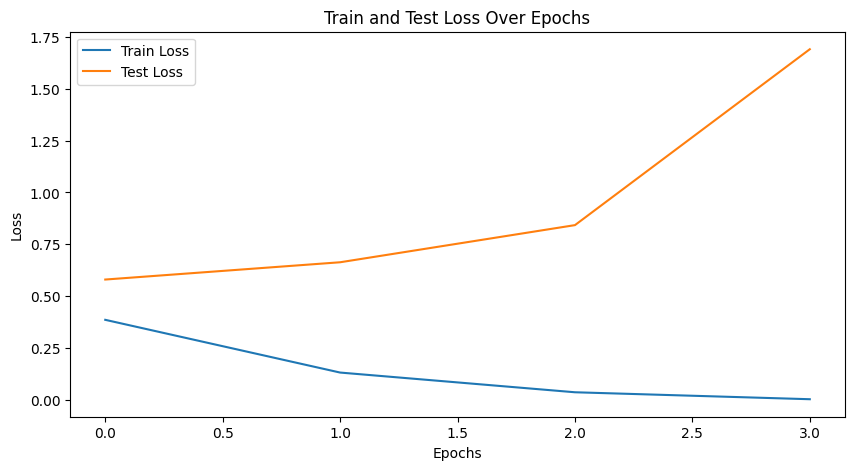

Accuracy: 0.76875
Sensitivity: 0.5375
Specificity: 1.0
PPV: 1.0
NPV: 0.6837606837606838
AUC: 0.885
Precision: 1.0
Recall: 0.5375
F1-score: 0.6991869918699186
Loss: 1.6906363649482956


In [45]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_16, ViT_L_16_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_16(weights=ViT_L_16_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_16_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ViT Large 32

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


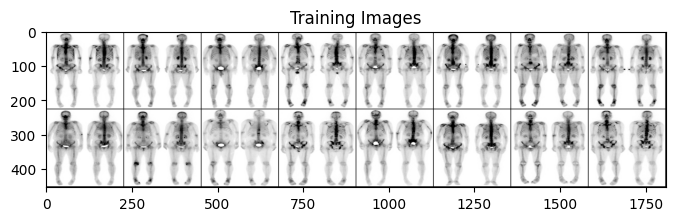

Labels: tensor([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.44116191009005296, Test Loss: 0.4526047021150589
Epoch [2/4], Train Loss: 0.23334629721577885, Test Loss: 0.8419874742627144
Epoch [3/4], Train Loss: 0.09544766770118567, Test Loss: 0.8011860974133015
Epoch [4/4], Train Loss: 0.01981101467235136, Test Loss: 1.2019509160367305


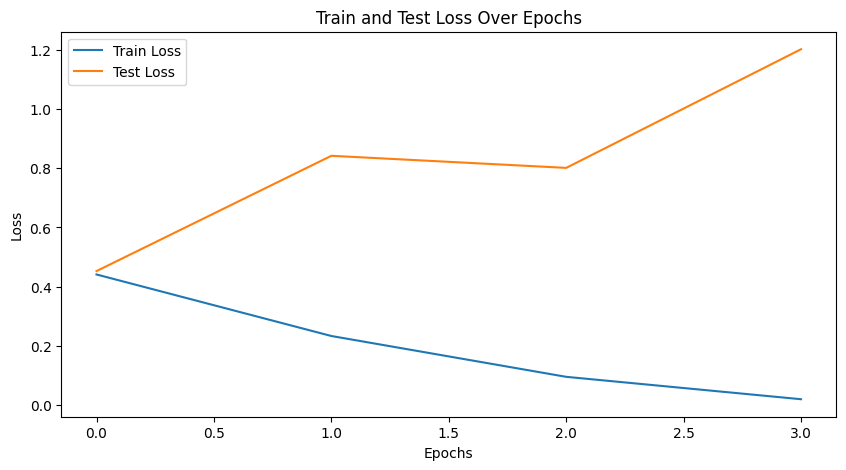

Accuracy: 0.7625
Sensitivity: 0.6125
Specificity: 0.9125
PPV: 0.875
NPV: 0.7019230769230769
AUC: 0.88328125
Precision: 0.875
Recall: 0.6125
F1-score: 0.7205882352941178
Loss: 1.2019509160367305


In [46]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_32, ViT_L_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_32_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


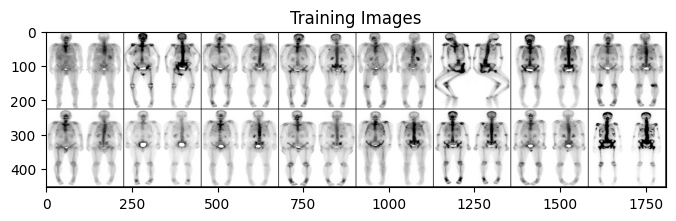

Labels: tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1])
Epoch [1/4], Train Loss: 0.5850109493414175, Test Loss: 0.5595919758081436
Epoch [2/4], Train Loss: 0.3267036278469904, Test Loss: 0.41774914860725404
Epoch [3/4], Train Loss: 0.15382825374011022, Test Loss: 0.7432785851880908
Epoch [4/4], Train Loss: 0.039550467959203355, Test Loss: 1.3061755227041432


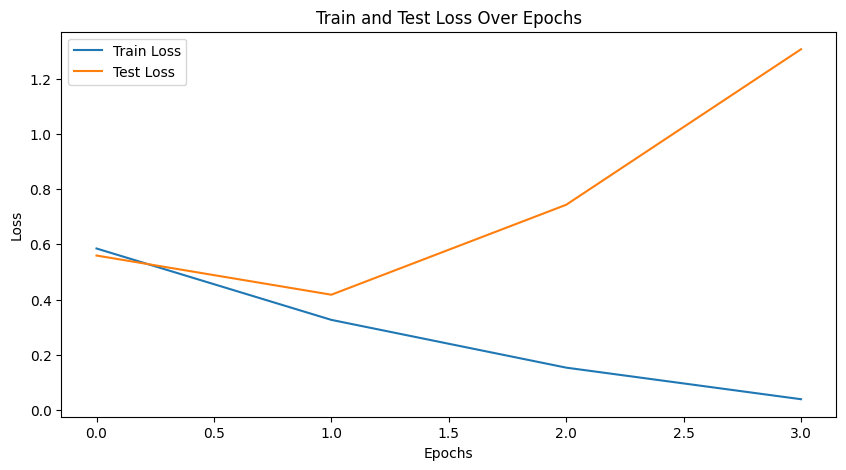

Accuracy: 0.8
Sensitivity: 0.6125
Specificity: 0.9875
PPV: 0.98
NPV: 0.7181818181818181
AUC: 0.8995312499999999
Precision: 0.98
Recall: 0.6125
F1-score: 0.7538461538461539
Loss: 1.3061755227041432


In [47]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_32, ViT_L_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_32_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


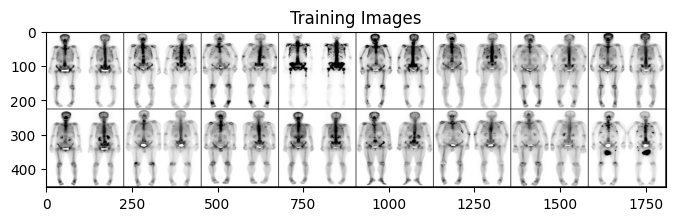

Labels: tensor([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1])
Epoch [1/4], Train Loss: 0.44184613726960803, Test Loss: 0.5831241965293884
Epoch [2/4], Train Loss: 0.24258094945542732, Test Loss: 0.5230317428708077
Epoch [3/4], Train Loss: 0.09985041053337271, Test Loss: 0.6561117082834244
Epoch [4/4], Train Loss: 0.030312218976919696, Test Loss: 0.6931324714794755


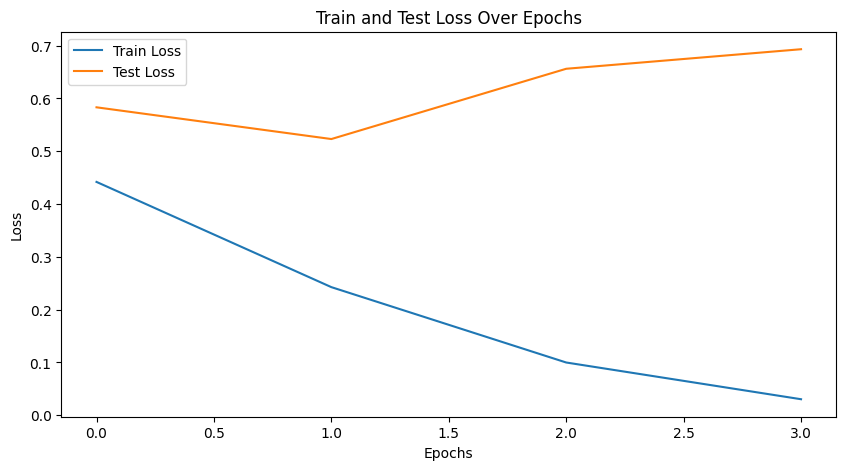

Accuracy: 0.8181818181818182
Sensitivity: 0.6753246753246753
Specificity: 0.961038961038961
PPV: 0.9454545454545454
NPV: 0.7474747474747475
AUC: 0.9268004722550176
Precision: 0.9454545454545454
Recall: 0.6753246753246753
F1-score: 0.7878787878787878
Loss: 0.6931324714794755


In [48]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_32, ViT_L_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_32_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


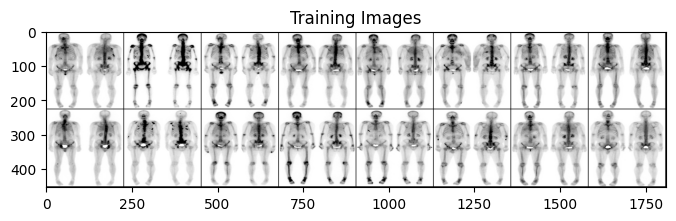

Labels: tensor([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.418982494324084, Test Loss: 0.6717797189950943
Epoch [2/4], Train Loss: 0.2148040214924196, Test Loss: 0.3553856868296862
Epoch [3/4], Train Loss: 0.098696061592262, Test Loss: 0.4827654224587604
Epoch [4/4], Train Loss: 0.016054422365520172, Test Loss: 0.9287625698027113


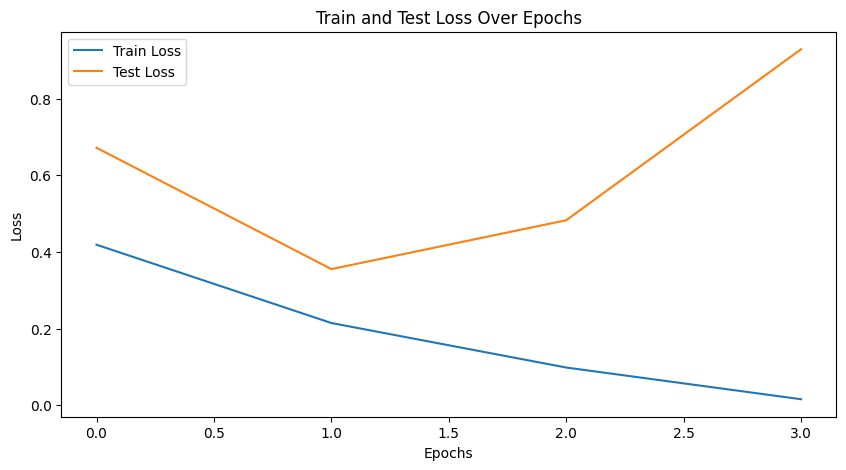

Accuracy: 0.8333333333333334
Sensitivity: 0.6794871794871795
Specificity: 0.9871794871794872
PPV: 0.9814814814814815
NPV: 0.7549019607843137
AUC: 0.9516765285996055
Precision: 0.9814814814814815
Recall: 0.6794871794871795
F1-score: 0.803030303030303
Loss: 0.9287625698027113


In [49]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_32, ViT_L_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_32_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


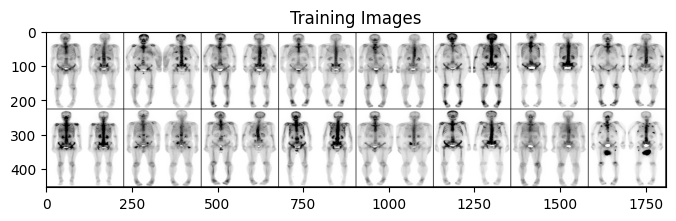

Labels: tensor([1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1])
Epoch [1/4], Train Loss: 0.5322831456450005, Test Loss: 0.5411636352539062
Epoch [2/4], Train Loss: 0.26556425211155443, Test Loss: 0.570822412148118
Epoch [3/4], Train Loss: 0.12594799938141504, Test Loss: 0.7442141711711884
Epoch [4/4], Train Loss: 0.02976459549866827, Test Loss: 1.2876448110328056


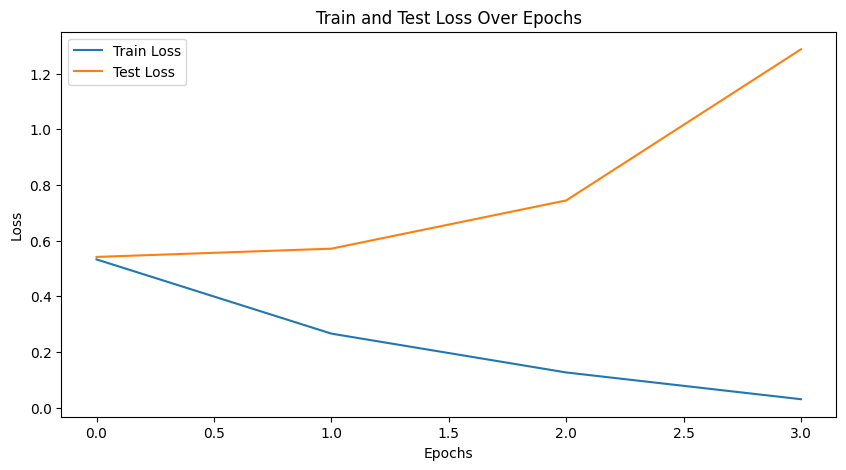

Accuracy: 0.78125
Sensitivity: 0.5875
Specificity: 0.975
PPV: 0.9591836734693877
NPV: 0.7027027027027027
AUC: 0.8879687500000001
Precision: 0.9591836734693877
Recall: 0.5875
F1-score: 0.7286821705426357
Loss: 1.2876448110328056


In [50]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vit_l_32, ViT_L_32_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = vit_l_32(weights=ViT_L_32_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.heads = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.heads[0].in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_vit_l_32_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin Base

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


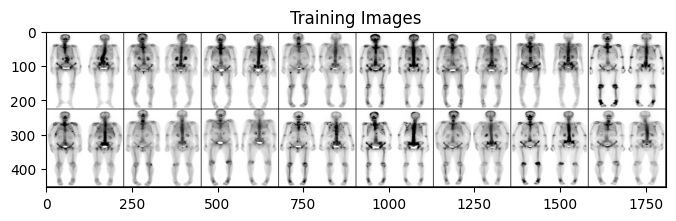

Labels: tensor([0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.3842361453893477, Test Loss: 0.5492601700127124
Epoch [2/4], Train Loss: 0.12653789920585448, Test Loss: 0.4929348260164261
Epoch [3/4], Train Loss: 0.046716785458565675, Test Loss: 1.0804957039654255
Epoch [4/4], Train Loss: 0.014381143614778056, Test Loss: 1.280780922435224


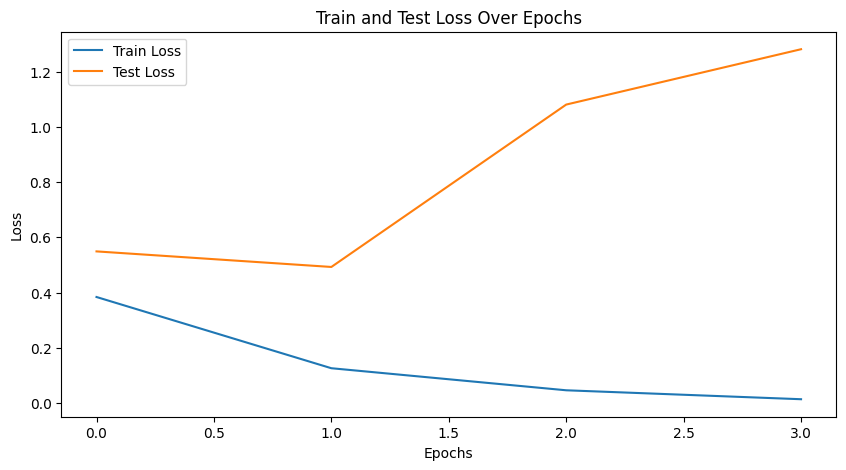

Accuracy: 0.825
Sensitivity: 0.6625
Specificity: 0.9875
PPV: 0.9814814814814815
NPV: 0.7452830188679245
AUC: 0.93546875
Precision: 0.9814814814814815
Recall: 0.6625
F1-score: 0.7910447761194029
Loss: 1.280780922435224


In [51]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_b, Swin_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_b(weights=Swin_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_b_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


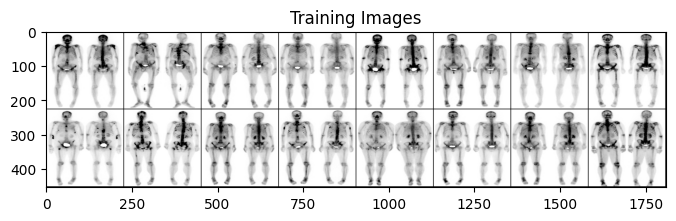

Labels: tensor([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.4976647054342535, Test Loss: 0.46484106183052065
Epoch [2/4], Train Loss: 0.1997300390768977, Test Loss: 0.5309570336714386
Epoch [3/4], Train Loss: 0.07665166453722846, Test Loss: 0.5562242804560811
Epoch [4/4], Train Loss: 0.02359494845713749, Test Loss: 0.9331373702651036


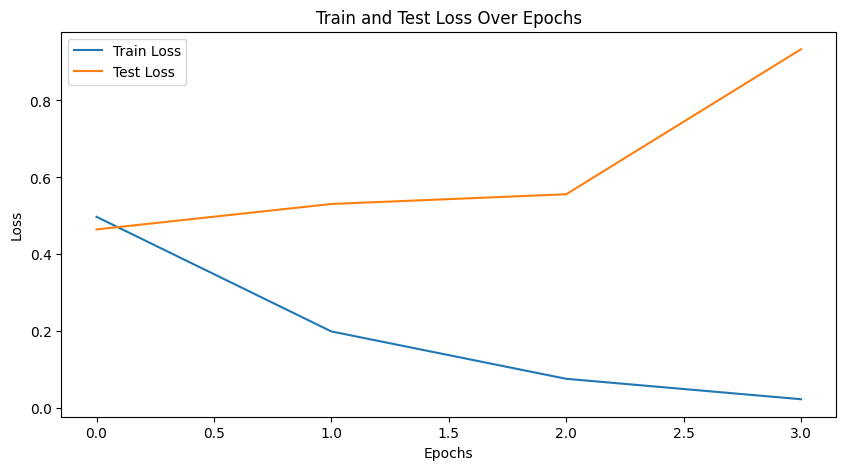

Accuracy: 0.85625
Sensitivity: 0.7375
Specificity: 0.975
PPV: 0.9672131147540983
NPV: 0.7878787878787878
AUC: 0.945
Precision: 0.9672131147540983
Recall: 0.7375
F1-score: 0.8368794326241135
Loss: 0.9331373702651036


In [52]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_b, Swin_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_b(weights=Swin_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_b_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


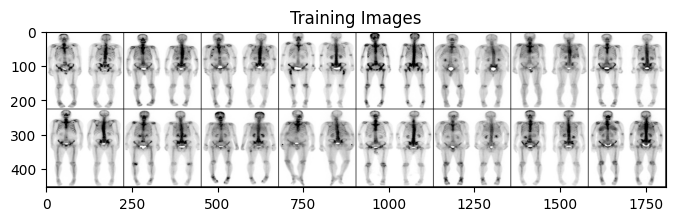

Labels: tensor([1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.6027413604835283, Test Loss: 0.4688392817974091
Epoch [2/4], Train Loss: 0.2508105195841743, Test Loss: 0.44180717021226884
Epoch [3/4], Train Loss: 0.08651371261820387, Test Loss: 0.4643661892041564
Epoch [4/4], Train Loss: 0.028425667029843626, Test Loss: 0.776400042977184


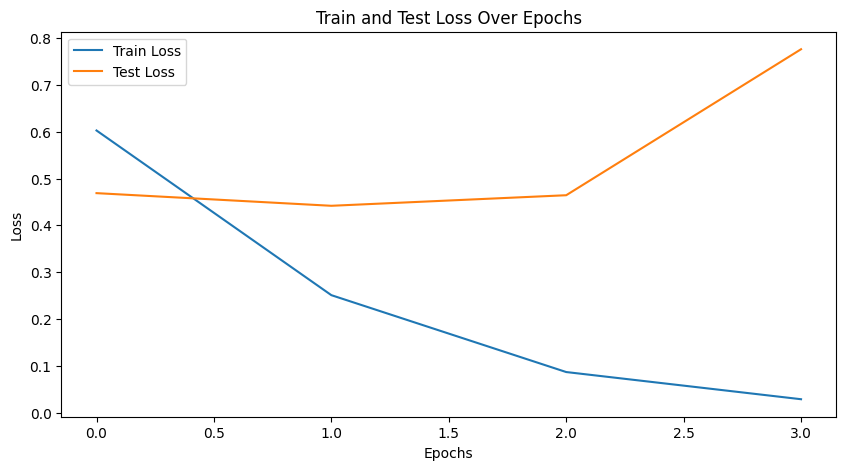

Accuracy: 0.8896103896103896
Sensitivity: 0.7922077922077922
Specificity: 0.987012987012987
PPV: 0.9838709677419355
NPV: 0.8260869565217391
AUC: 0.9251138471917693
Precision: 0.9838709677419355
Recall: 0.7922077922077922
F1-score: 0.8776978417266188
Loss: 0.776400042977184


In [53]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_b, Swin_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_b(weights=Swin_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_b_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


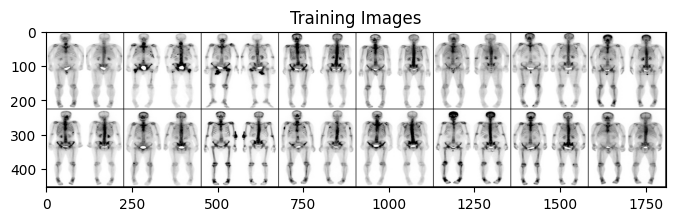

Labels: tensor([0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5191949822225617, Test Loss: 0.39100541472434996
Epoch [2/4], Train Loss: 0.1877340481286525, Test Loss: 0.34999959571287037
Epoch [3/4], Train Loss: 0.0626221493435984, Test Loss: 0.26092739386367614
Epoch [4/4], Train Loss: 0.015829644568653854, Test Loss: 0.6581746698780535


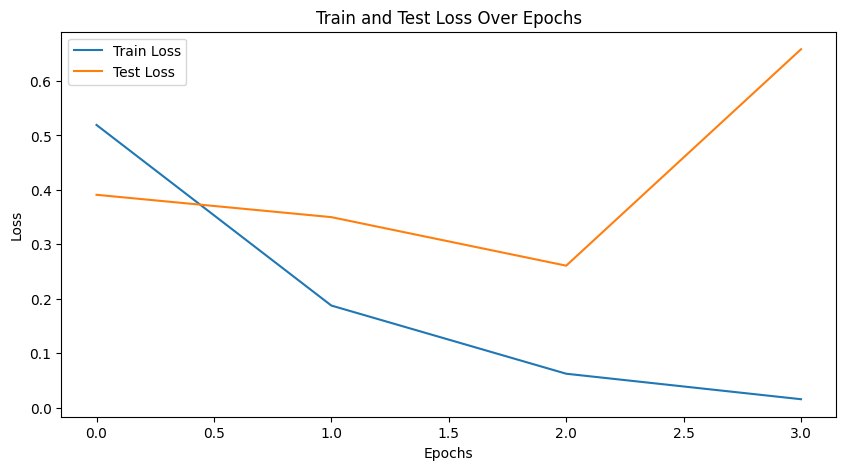

Accuracy: 0.8782051282051282
Sensitivity: 0.7692307692307693
Specificity: 0.9871794871794872
PPV: 0.9836065573770492
NPV: 0.8105263157894737
AUC: 0.982741617357002
Precision: 0.9836065573770492
Recall: 0.7692307692307693
F1-score: 0.8633093525179856
Loss: 0.6581746698780535


In [54]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_b, Swin_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_b(weights=Swin_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_b_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


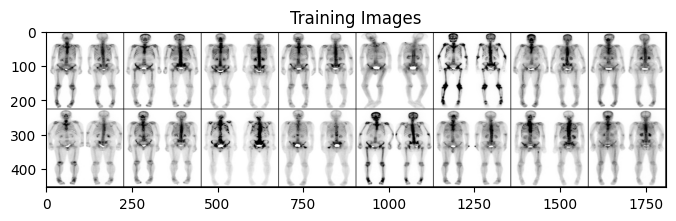

Labels: tensor([1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.48486847186334503, Test Loss: 0.5665075078606605
Epoch [2/4], Train Loss: 0.14075571367395895, Test Loss: 0.4891885355464183
Epoch [3/4], Train Loss: 0.05427434899941996, Test Loss: 0.9624301488831406
Epoch [4/4], Train Loss: 0.0163002989115695, Test Loss: 1.1206008254917834


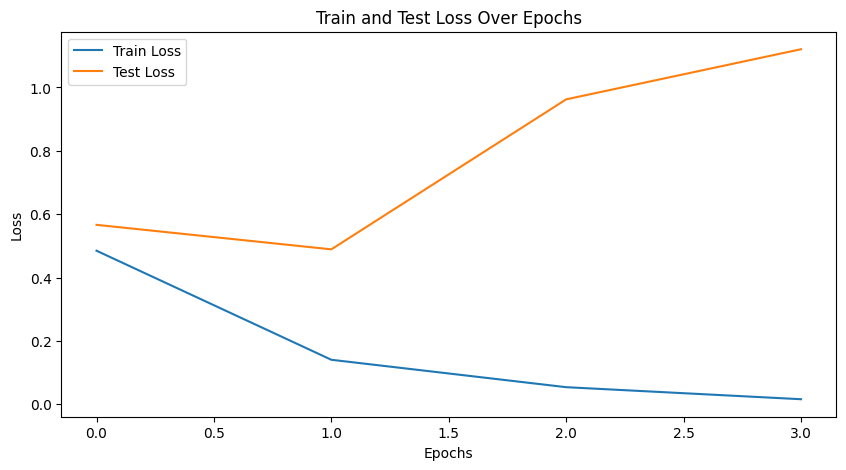

Accuracy: 0.8
Sensitivity: 0.6125
Specificity: 0.9875
PPV: 0.98
NPV: 0.7181818181818181
AUC: 0.9565625000000001
Precision: 0.98
Recall: 0.6125
F1-score: 0.7538461538461539
Loss: 1.1206008254917834


In [55]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_b, Swin_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_b(weights=Swin_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_b_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin Tiny

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


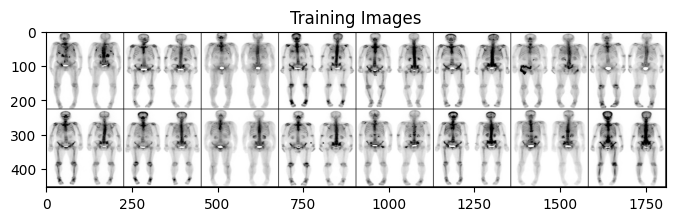

Labels: tensor([1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1])
Epoch [1/4], Train Loss: 0.38054468569535654, Test Loss: 0.45818217247724535
Epoch [2/4], Train Loss: 0.1335155114687491, Test Loss: 0.5593560259789229
Epoch [3/4], Train Loss: 0.052430661792191, Test Loss: 1.0047877738456008
Epoch [4/4], Train Loss: 0.016782287760329424, Test Loss: 1.2931779394594742


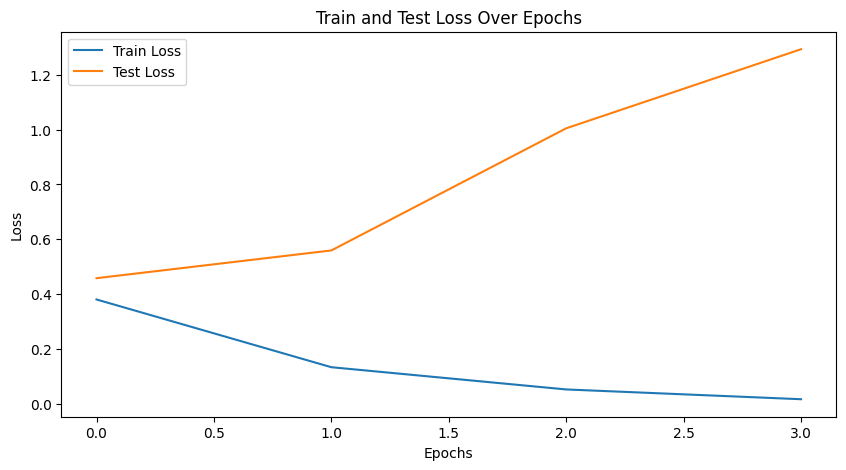

Accuracy: 0.81875
Sensitivity: 0.6625
Specificity: 0.975
PPV: 0.9636363636363636
NPV: 0.7428571428571429
AUC: 0.9340625
Precision: 0.9636363636363636
Recall: 0.6625
F1-score: 0.7851851851851853
Loss: 1.2931779394594742


In [56]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_t(weights=Swin_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_t_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


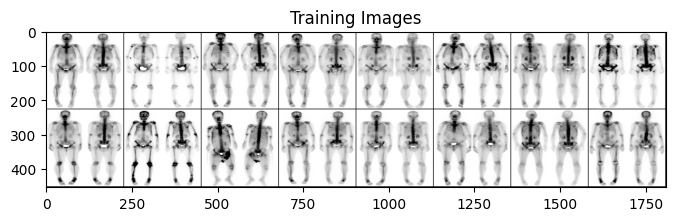

Labels: tensor([1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.4390250903292044, Test Loss: 0.4863299548625946
Epoch [2/4], Train Loss: 0.17956682587340836, Test Loss: 0.8310269908979535
Epoch [3/4], Train Loss: 0.06008862638032263, Test Loss: 1.329958615032956
Epoch [4/4], Train Loss: 0.02422673223402862, Test Loss: 1.0452308226609603


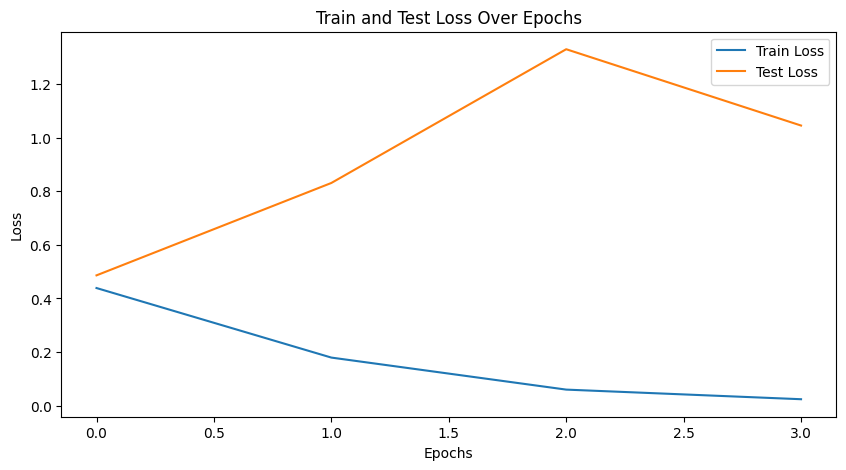

Accuracy: 0.85
Sensitivity: 0.7375
Specificity: 0.9625
PPV: 0.9516129032258065
NPV: 0.7857142857142857
AUC: 0.9303125000000001
Precision: 0.9516129032258065
Recall: 0.7375
F1-score: 0.8309859154929577
Loss: 1.0452308226609603


In [57]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_t(weights=Swin_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_t_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


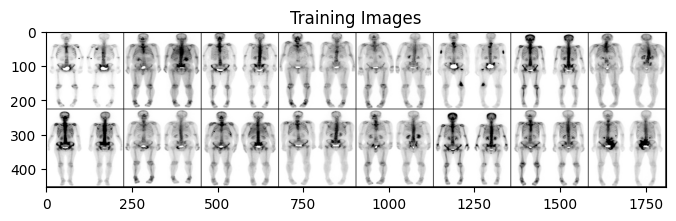

Labels: tensor([1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1])
Epoch [1/4], Train Loss: 0.4280057844787257, Test Loss: 0.3850464761257172
Epoch [2/4], Train Loss: 0.16452632787483698, Test Loss: 0.5426588224247098
Epoch [3/4], Train Loss: 0.06050461233148206, Test Loss: 0.6068791143596173
Epoch [4/4], Train Loss: 0.020770293840223972, Test Loss: 0.7074808467179536


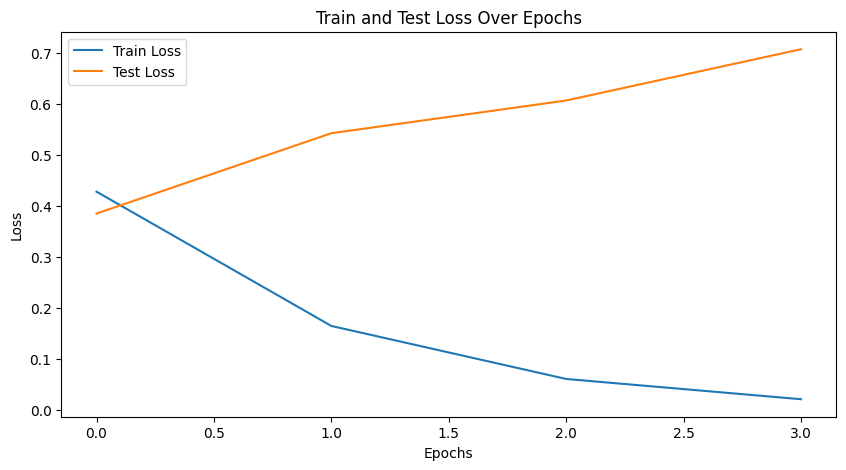

Accuracy: 0.8636363636363636
Sensitivity: 0.7662337662337663
Specificity: 0.961038961038961
PPV: 0.9516129032258065
NPV: 0.8043478260869565
AUC: 0.9392814977230561
Precision: 0.9516129032258065
Recall: 0.7662337662337663
F1-score: 0.8489208633093526
Loss: 0.7074808467179536


In [58]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_t(weights=Swin_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_t_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


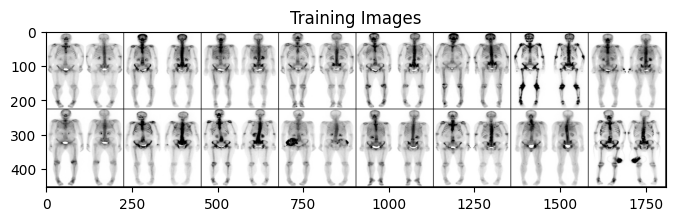

Labels: tensor([0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.41320264728251593, Test Loss: 0.6206873707473278
Epoch [2/4], Train Loss: 0.1576882025692612, Test Loss: 0.5643572581728222
Epoch [3/4], Train Loss: 0.0643025842290123, Test Loss: 0.8718394136541974
Epoch [4/4], Train Loss: 0.021252615559223538, Test Loss: 0.9128945333402043


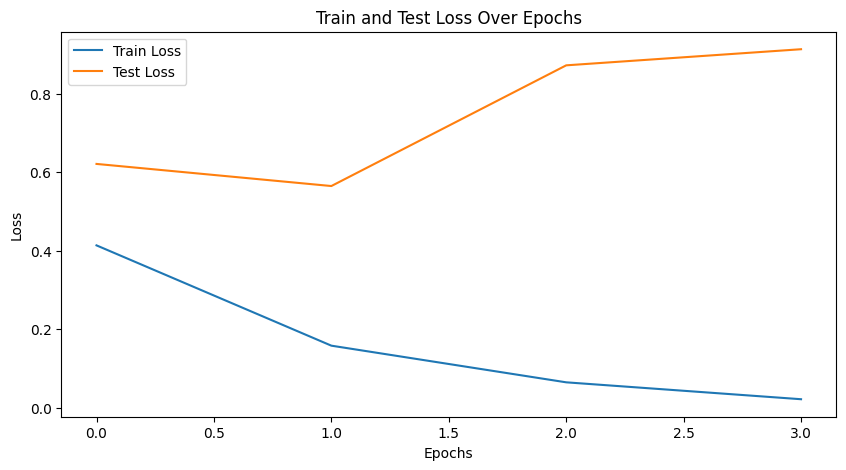

Accuracy: 0.8525641025641025
Sensitivity: 0.717948717948718
Specificity: 0.9871794871794872
PPV: 0.9824561403508771
NPV: 0.7777777777777778
AUC: 0.9773175542406312
Precision: 0.9824561403508771
Recall: 0.717948717948718
F1-score: 0.8296296296296296
Loss: 0.9128945333402043


In [59]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_t(weights=Swin_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_t_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


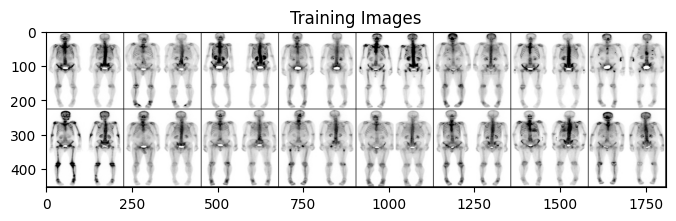

Labels: tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.3775805288166242, Test Loss: 0.3077927015721798
Epoch [2/4], Train Loss: 0.12654490032434199, Test Loss: 0.5388539758743718
Epoch [3/4], Train Loss: 0.04842525866239086, Test Loss: 0.7697592041455209
Epoch [4/4], Train Loss: 0.012034558779742459, Test Loss: 1.328384067718207


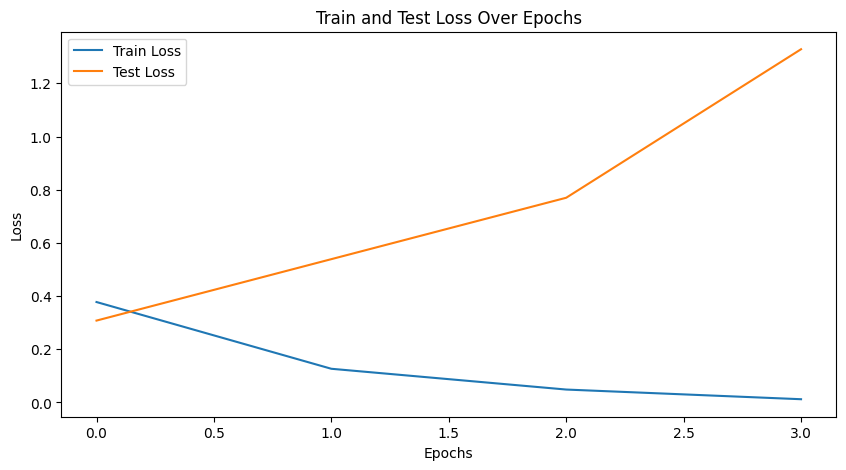

Accuracy: 0.8125
Sensitivity: 0.625
Specificity: 1.0
PPV: 1.0
NPV: 0.7272727272727273
AUC: 0.9521875000000001
Precision: 1.0
Recall: 0.625
F1-score: 0.7692307692307693
Loss: 1.328384067718207


In [60]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_t, Swin_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_t(weights=Swin_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_t_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin Small

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


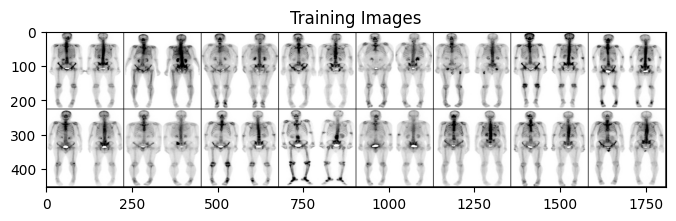

Labels: tensor([1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.40207644794317127, Test Loss: 0.5090552613139152
Epoch [2/4], Train Loss: 0.1580588045073402, Test Loss: 0.5617393163964153
Epoch [3/4], Train Loss: 0.05705024007025731, Test Loss: 1.1317231317050755
Epoch [4/4], Train Loss: 0.021275784356634866, Test Loss: 1.1234932558960282


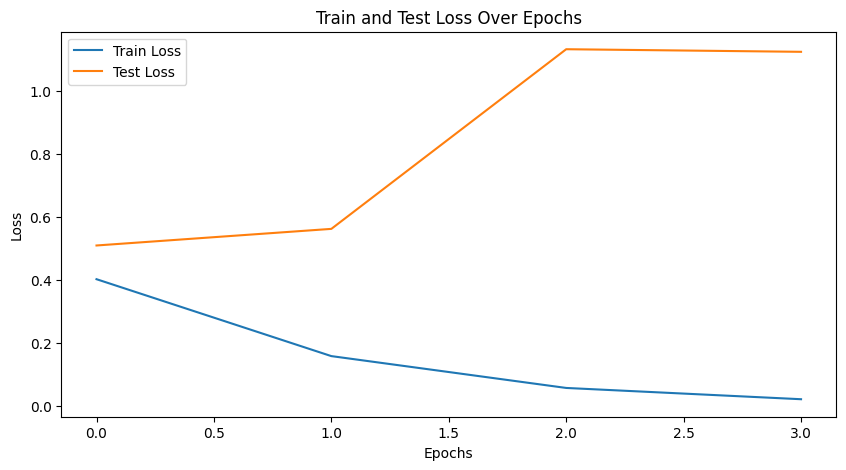

Accuracy: 0.85
Sensitivity: 0.725
Specificity: 0.975
PPV: 0.9666666666666667
NPV: 0.78
AUC: 0.93421875
Precision: 0.9666666666666667
Recall: 0.725
F1-score: 0.8285714285714285
Loss: 1.1234932558960282


In [61]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_s, Swin_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_s(weights=Swin_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_s_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


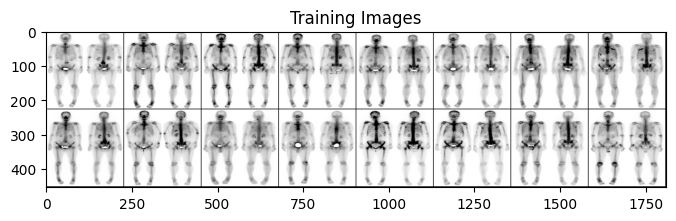

Labels: tensor([0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.4351315492655612, Test Loss: 0.4089665710926056
Epoch [2/4], Train Loss: 0.1630987705855271, Test Loss: 0.8455482392571867
Epoch [3/4], Train Loss: 0.055046112495952045, Test Loss: 0.5315515100955963
Epoch [4/4], Train Loss: 0.015680684111801173, Test Loss: 0.8451364934444427


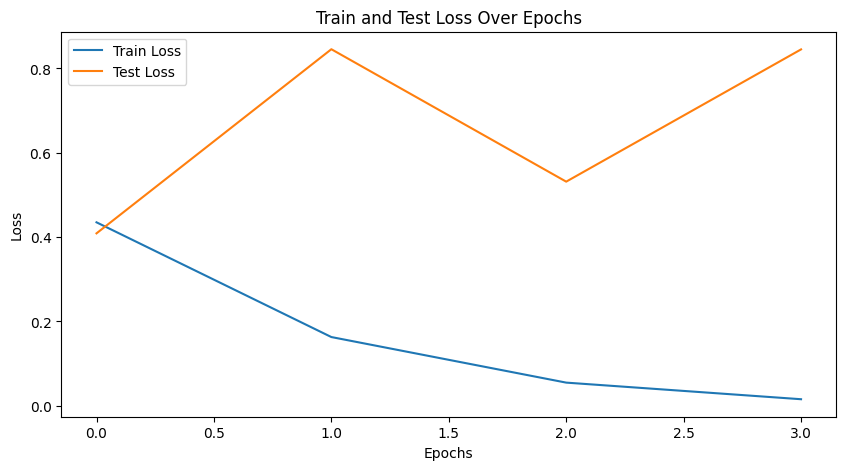

Accuracy: 0.83125
Sensitivity: 0.7125
Specificity: 0.95
PPV: 0.9344262295081968
NPV: 0.7676767676767676
AUC: 0.93703125
Precision: 0.9344262295081968
Recall: 0.7125
F1-score: 0.8085106382978724
Loss: 0.8451364934444427


In [62]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_s, Swin_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_s(weights=Swin_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_s_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


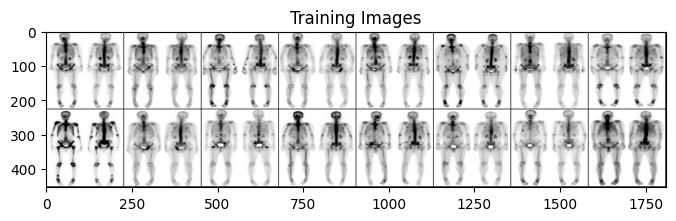

Labels: tensor([1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.4244471246159626, Test Loss: 0.41099527329206464
Epoch [2/4], Train Loss: 0.14234650628364337, Test Loss: 0.5226890676654875
Epoch [3/4], Train Loss: 0.04773429553891934, Test Loss: 0.4795381551608443
Epoch [4/4], Train Loss: 0.010076341593348932, Test Loss: 0.5635644678026438


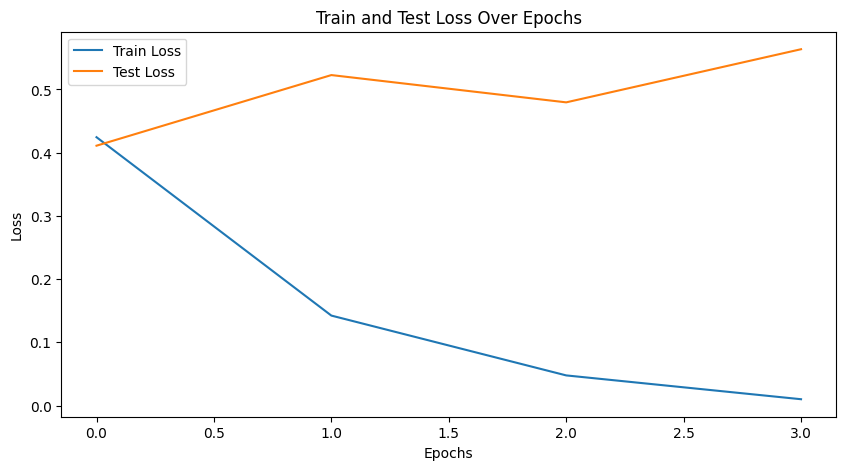

Accuracy: 0.8896103896103896
Sensitivity: 0.7922077922077922
Specificity: 0.987012987012987
PPV: 0.9838709677419355
NPV: 0.8260869565217391
AUC: 0.9571597233934895
Precision: 0.9838709677419355
Recall: 0.7922077922077922
F1-score: 0.8776978417266188
Loss: 0.5635644678026438


In [63]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_s, Swin_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_s(weights=Swin_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_s_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


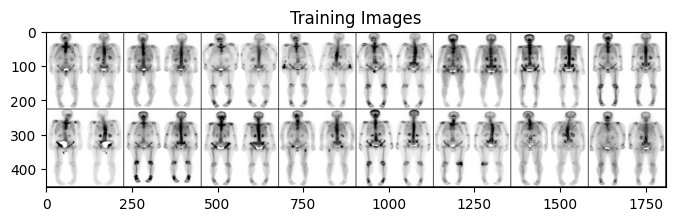

Labels: tensor([1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.47340811734783994, Test Loss: 0.36344653777778146
Epoch [2/4], Train Loss: 0.1704475872288684, Test Loss: 0.5258268949575722
Epoch [3/4], Train Loss: 0.05139055208247087, Test Loss: 0.5751469047914725
Epoch [4/4], Train Loss: 0.020697890567214362, Test Loss: 0.606860586640687


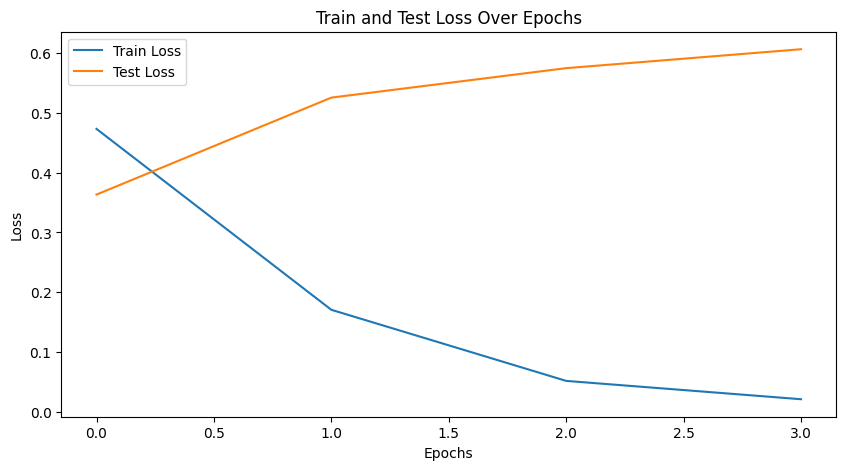

Accuracy: 0.9038461538461539
Sensitivity: 0.8205128205128205
Specificity: 0.9871794871794872
PPV: 0.9846153846153847
NPV: 0.8461538461538461
AUC: 0.9641683103221564
Precision: 0.9846153846153847
Recall: 0.8205128205128205
F1-score: 0.8951048951048951
Loss: 0.606860586640687


In [64]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_s, Swin_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_s(weights=Swin_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_s_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


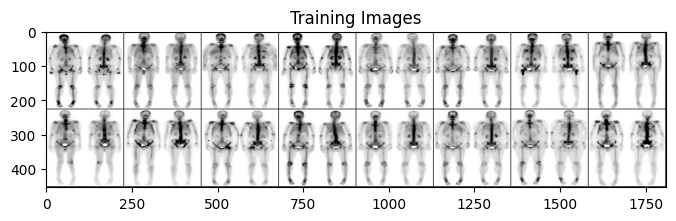

Labels: tensor([1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1])
Epoch [1/4], Train Loss: 0.4161564494682096, Test Loss: 0.3801138699054718
Epoch [2/4], Train Loss: 0.15120020408117782, Test Loss: 0.9614676954923198
Epoch [3/4], Train Loss: 0.047052763742666, Test Loss: 1.2188394222961505
Epoch [4/4], Train Loss: 0.013662918231894208, Test Loss: 1.3725794659621897


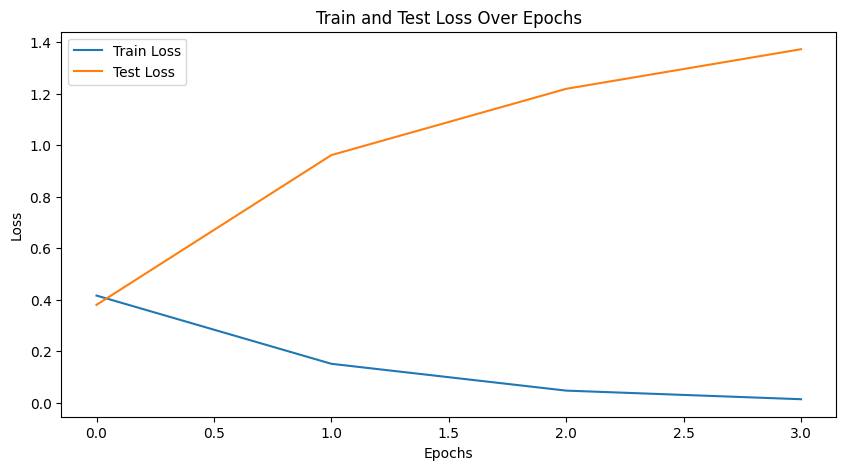

Accuracy: 0.8
Sensitivity: 0.6125
Specificity: 0.9875
PPV: 0.98
NPV: 0.7181818181818181
AUC: 0.905625
Precision: 0.98
Recall: 0.6125
F1-score: 0.7538461538461539
Loss: 1.3725794659621897


In [65]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_s, Swin_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_s(weights=Swin_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_s_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin V2 Tiny

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


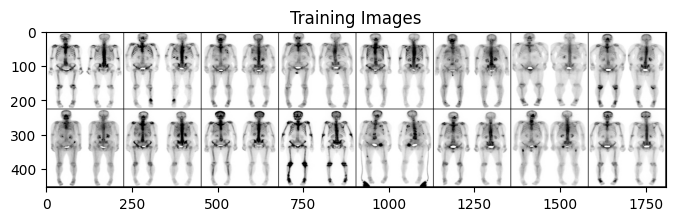

Labels: tensor([0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0])
Epoch [1/4], Train Loss: 0.408337853894144, Test Loss: 0.43140704482793807
Epoch [2/4], Train Loss: 0.14670862725967523, Test Loss: 0.49270946383476255
Epoch [3/4], Train Loss: 0.050841296412029814, Test Loss: 0.6405203770846128
Epoch [4/4], Train Loss: 0.019850566283212263, Test Loss: 1.2657883622392547


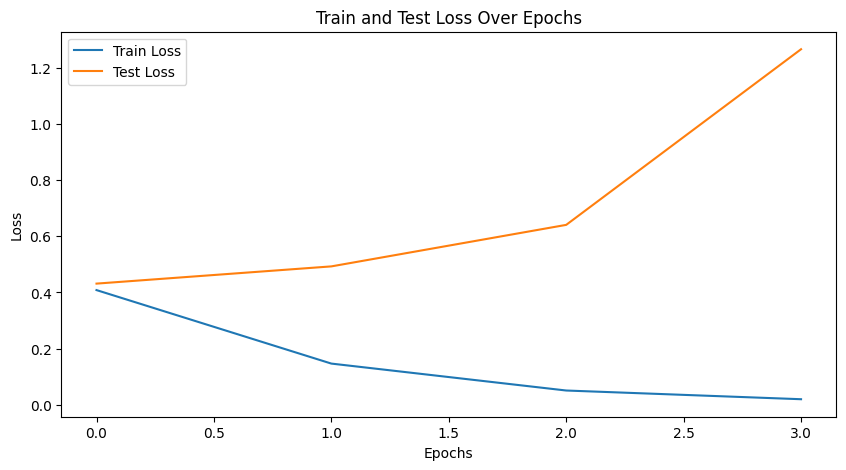

Accuracy: 0.825
Sensitivity: 0.6875
Specificity: 0.9625
PPV: 0.9482758620689655
NPV: 0.7549019607843137
AUC: 0.91875
Precision: 0.9482758620689655
Recall: 0.6875
F1-score: 0.7971014492753623
Loss: 1.2657883622392547


In [66]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_t, Swin_V2_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_t(weights=Swin_V2_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_t_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


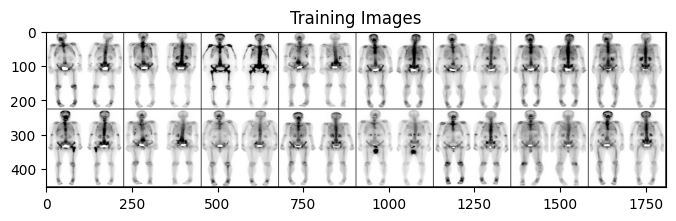

Labels: tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.40907011724086206, Test Loss: 0.6498291328549385
Epoch [2/4], Train Loss: 0.14838415866738042, Test Loss: 0.8099081080406905
Epoch [3/4], Train Loss: 0.059899902851541204, Test Loss: 0.7730744981206954
Epoch [4/4], Train Loss: 0.025870134849629696, Test Loss: 1.0120388687588275


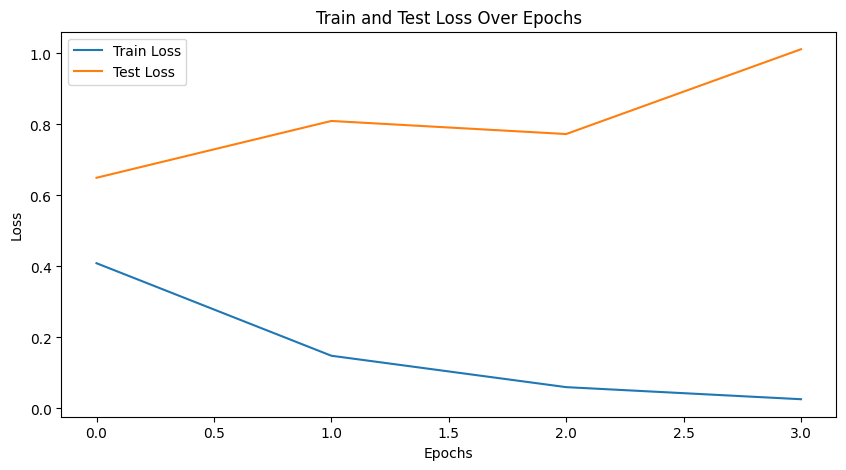

Accuracy: 0.85
Sensitivity: 0.7125
Specificity: 0.9875
PPV: 0.9827586206896551
NPV: 0.7745098039215687
AUC: 0.93125
Precision: 0.9827586206896551
Recall: 0.7125
F1-score: 0.8260869565217391
Loss: 1.0120388687588275


In [67]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_t, Swin_V2_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_t(weights=Swin_V2_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_t_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


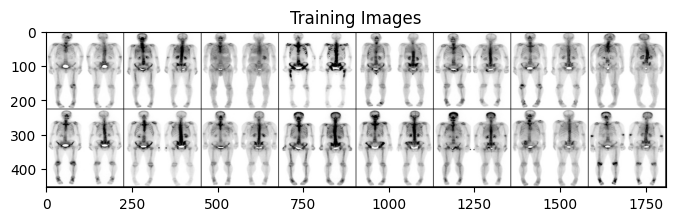

Labels: tensor([0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.4077447523245389, Test Loss: 0.7169704655185342
Epoch [2/4], Train Loss: 0.15704500141725378, Test Loss: 0.7221755295991897
Epoch [3/4], Train Loss: 0.06342198150618131, Test Loss: 0.6599739225464873
Epoch [4/4], Train Loss: 0.01563849187872514, Test Loss: 0.9220988616409158


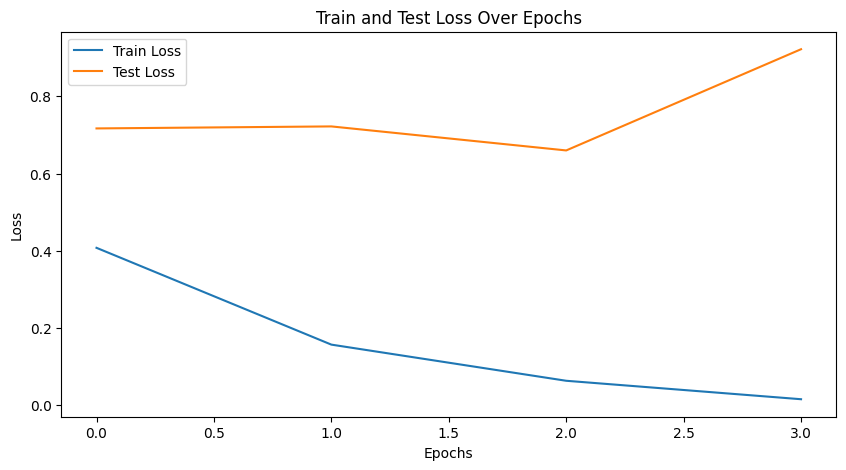

Accuracy: 0.8441558441558441
Sensitivity: 0.7402597402597403
Specificity: 0.948051948051948
PPV: 0.9344262295081968
NPV: 0.7849462365591398
AUC: 0.928655759824591
Precision: 0.9344262295081968
Recall: 0.7402597402597403
F1-score: 0.8260869565217391
Loss: 0.9220988616409158


In [68]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_t, Swin_V2_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_t(weights=Swin_V2_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_t_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


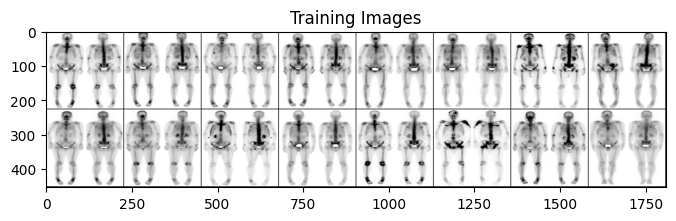

Labels: tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.49478809824846326, Test Loss: 0.3422387301921844
Epoch [2/4], Train Loss: 0.213248961404513, Test Loss: 0.38032631082460283
Epoch [3/4], Train Loss: 0.08551226910795662, Test Loss: 0.6033715365454555
Epoch [4/4], Train Loss: 0.02749868460657647, Test Loss: 0.9867237689104513


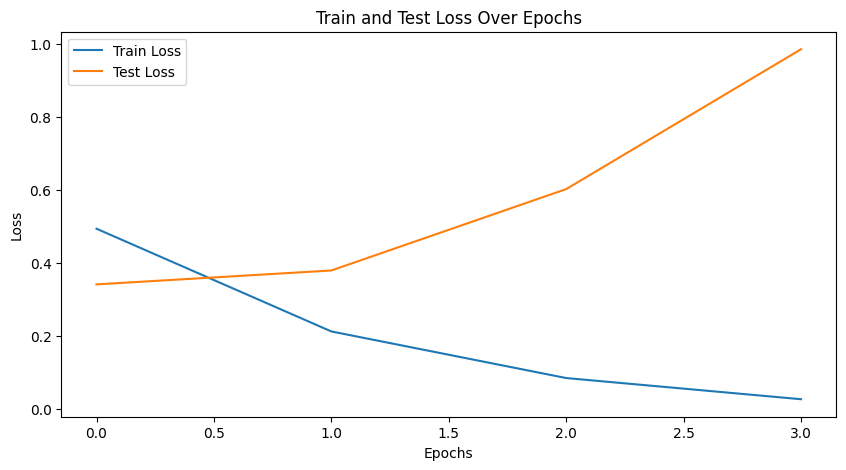

Accuracy: 0.8269230769230769
Sensitivity: 0.6666666666666666
Specificity: 0.9871794871794872
PPV: 0.9811320754716981
NPV: 0.7475728155339806
AUC: 0.9543063773833004
Precision: 0.9811320754716981
Recall: 0.6666666666666666
F1-score: 0.7938931297709922
Loss: 0.9867237689104513


In [69]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_t, Swin_V2_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_t(weights=Swin_V2_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_t_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


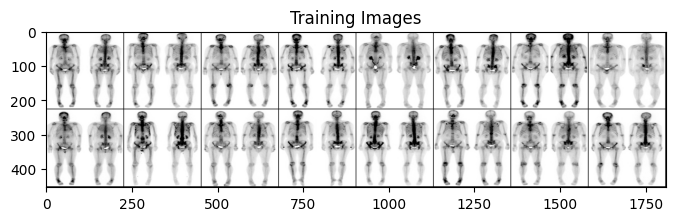

Labels: tensor([0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.44330060660151893, Test Loss: 0.5585334364324808
Epoch [2/4], Train Loss: 0.16701359451110973, Test Loss: 0.6315524501726031
Epoch [3/4], Train Loss: 0.06009158167185022, Test Loss: 0.6367940300842747
Epoch [4/4], Train Loss: 0.021058535401554532, Test Loss: 1.5051996971246582


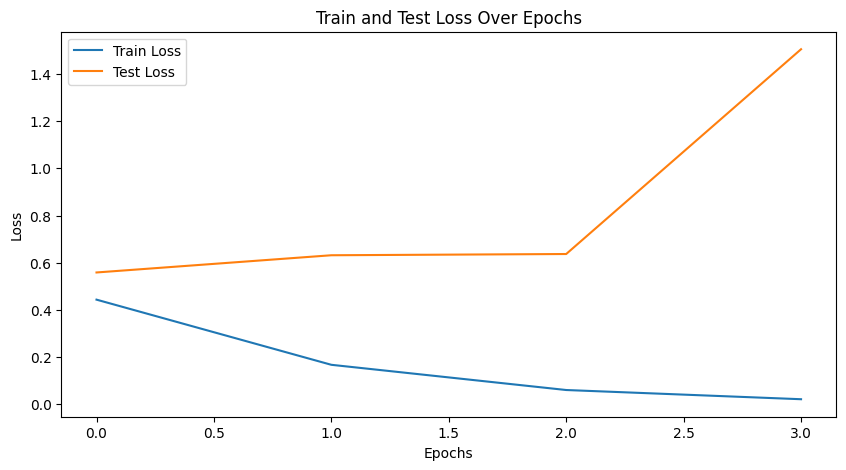

Accuracy: 0.7875
Sensitivity: 0.575
Specificity: 1.0
PPV: 1.0
NPV: 0.7017543859649122
AUC: 0.951875
Precision: 1.0
Recall: 0.575
F1-score: 0.7301587301587301
Loss: 1.5051996971246582


In [70]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_t, Swin_V2_T_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_t(weights=Swin_V2_T_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_t_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin V2 Small

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


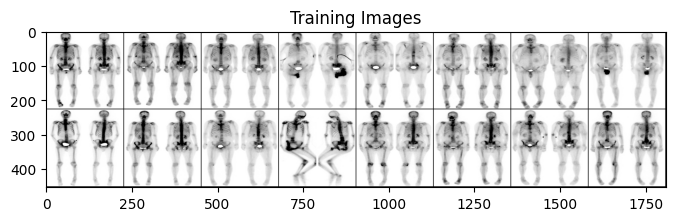

Labels: tensor([0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.48109899766887854, Test Loss: 0.5229576773941517
Epoch [2/4], Train Loss: 0.16121626332813638, Test Loss: 0.7411740416660905
Epoch [3/4], Train Loss: 0.05821948175604491, Test Loss: 0.7509622344747185
Epoch [4/4], Train Loss: 0.01934312827049405, Test Loss: 1.4518527840686146


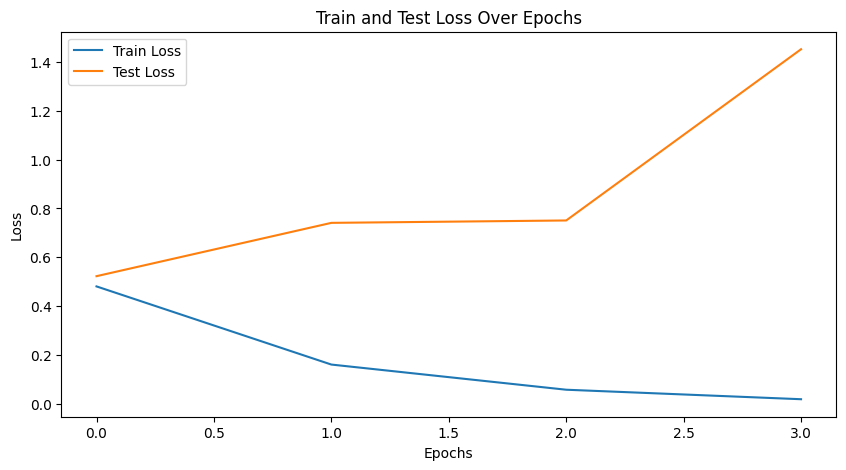

Accuracy: 0.80625
Sensitivity: 0.6625
Specificity: 0.95
PPV: 0.9298245614035088
NPV: 0.7378640776699029
AUC: 0.90234375
Precision: 0.9298245614035088
Recall: 0.6625
F1-score: 0.7737226277372262
Loss: 1.4518527840686146


In [71]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_s, Swin_V2_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_s(weights=Swin_V2_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_s_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


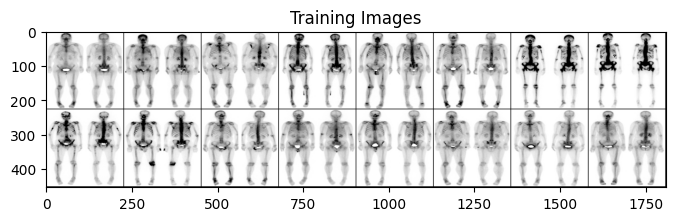

Labels: tensor([0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.5200031989443938, Test Loss: 0.5568179998546838
Epoch [2/4], Train Loss: 0.21216652089124094, Test Loss: 0.48289452865719795
Epoch [3/4], Train Loss: 0.0782451920123156, Test Loss: 0.6904002797789872
Epoch [4/4], Train Loss: 0.025851725351369998, Test Loss: 1.011062579913414


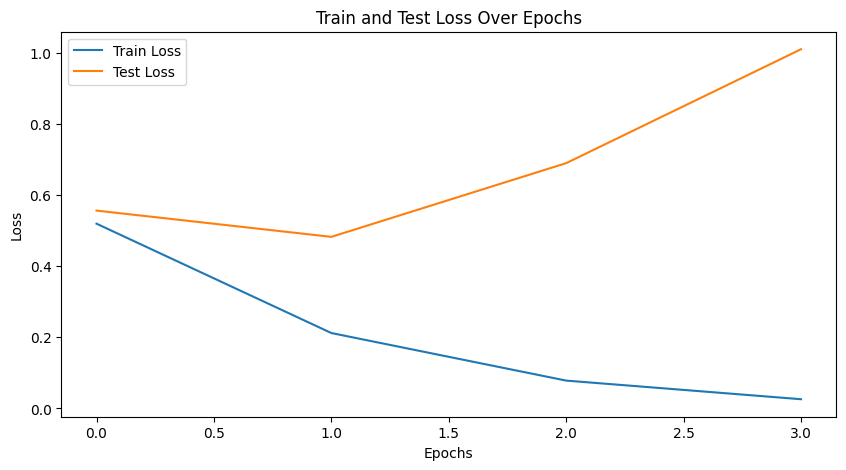

Accuracy: 0.85625
Sensitivity: 0.75
Specificity: 0.9625
PPV: 0.9523809523809523
NPV: 0.7938144329896907
AUC: 0.92296875
Precision: 0.9523809523809523
Recall: 0.75
F1-score: 0.8391608391608391
Loss: 1.011062579913414


In [72]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_s, Swin_V2_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_s(weights=Swin_V2_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_s_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


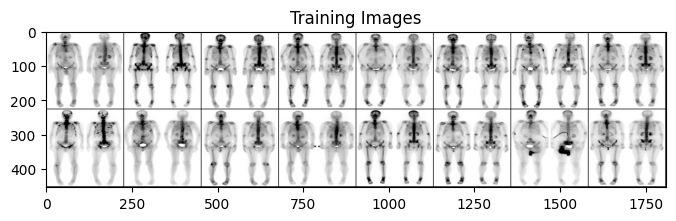

Labels: tensor([0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.5288409083376376, Test Loss: 0.4809457555413246
Epoch [2/4], Train Loss: 0.22651107962586853, Test Loss: 0.3404839314520359
Epoch [3/4], Train Loss: 0.07418995411335876, Test Loss: 0.9240186447568703
Epoch [4/4], Train Loss: 0.028154896055851177, Test Loss: 0.8838481618789956


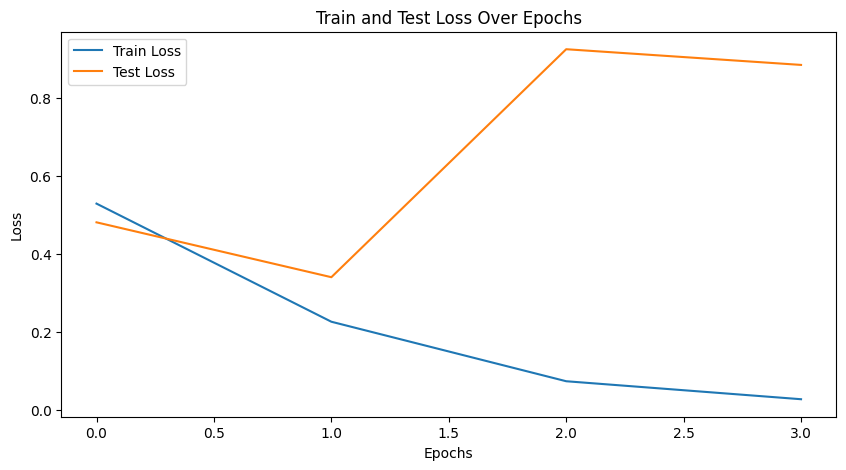

Accuracy: 0.8116883116883117
Sensitivity: 0.6753246753246753
Specificity: 0.948051948051948
PPV: 0.9285714285714286
NPV: 0.7448979591836735
AUC: 0.9342216225333109
Precision: 0.9285714285714286
Recall: 0.6753246753246753
F1-score: 0.7819548872180452
Loss: 0.8838481618789956


In [73]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_s, Swin_V2_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_s(weights=Swin_V2_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_s_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


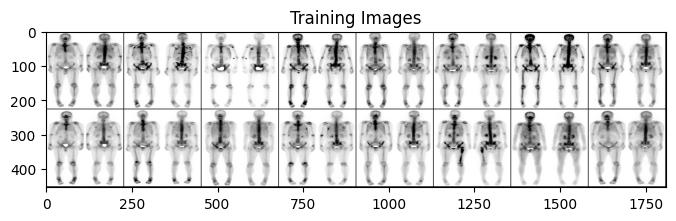

Labels: tensor([0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.43004964388346356, Test Loss: 0.606752535700798
Epoch [2/4], Train Loss: 0.15105869458339546, Test Loss: 0.6111229929607361
Epoch [3/4], Train Loss: 0.06149252087351608, Test Loss: 0.3355272120097652
Epoch [4/4], Train Loss: 0.017152536439822955, Test Loss: 0.8177357123960973


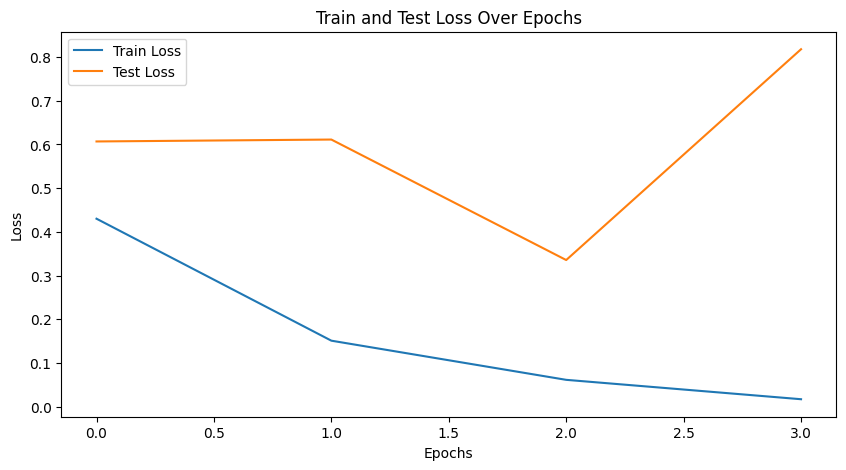

Accuracy: 0.8525641025641025
Sensitivity: 0.717948717948718
Specificity: 0.9871794871794872
PPV: 0.9824561403508771
NPV: 0.7777777777777778
AUC: 0.9700854700854701
Precision: 0.9824561403508771
Recall: 0.717948717948718
F1-score: 0.8296296296296296
Loss: 0.8177357123960973


In [74]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_s, Swin_V2_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_s(weights=Swin_V2_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_s_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


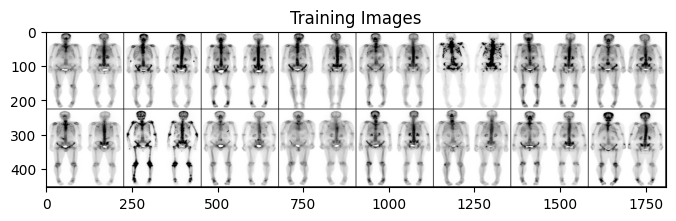

Labels: tensor([0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.41537995628325397, Test Loss: 0.6128739713691175
Epoch [2/4], Train Loss: 0.12570833316560523, Test Loss: 0.758324549626559
Epoch [3/4], Train Loss: 0.04683174869820257, Test Loss: 1.2497602611518233
Epoch [4/4], Train Loss: 0.015991606716556597, Test Loss: 1.5314623604335793


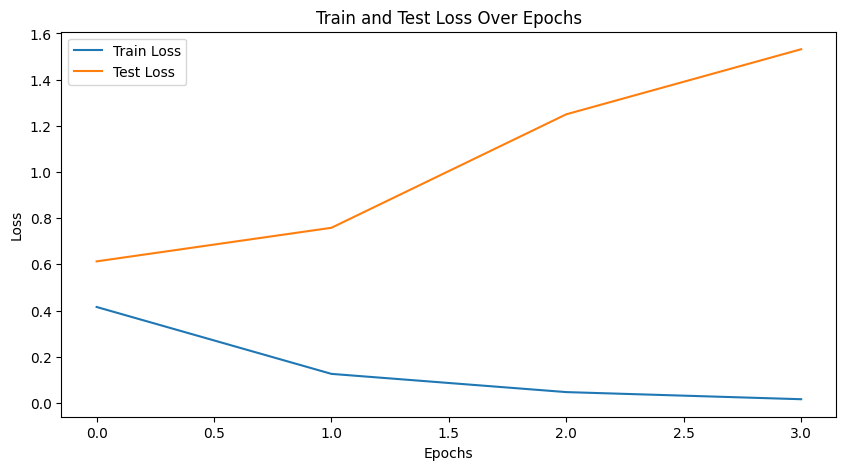

Accuracy: 0.81875
Sensitivity: 0.65
Specificity: 0.9875
PPV: 0.9811320754716981
NPV: 0.7383177570093458
AUC: 0.8926562499999999
Precision: 0.9811320754716981
Recall: 0.65
F1-score: 0.781954887218045
Loss: 1.5314623604335793


In [75]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_s, Swin_V2_S_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_s(weights=Swin_V2_S_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_s_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## Swin V2 Base

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


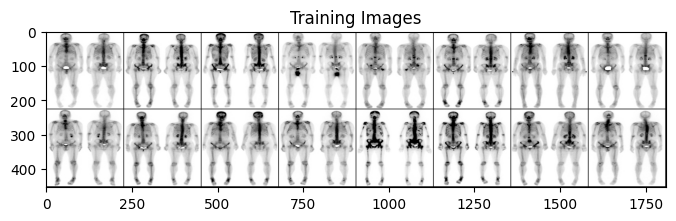

Labels: tensor([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.42800546446543875, Test Loss: 0.4596193999052048
Epoch [2/4], Train Loss: 0.15330990093694638, Test Loss: 1.23170744322706
Epoch [3/4], Train Loss: 0.055957066642009716, Test Loss: 0.8124397649429739
Epoch [4/4], Train Loss: 0.01425966632524754, Test Loss: 1.4332295356838585


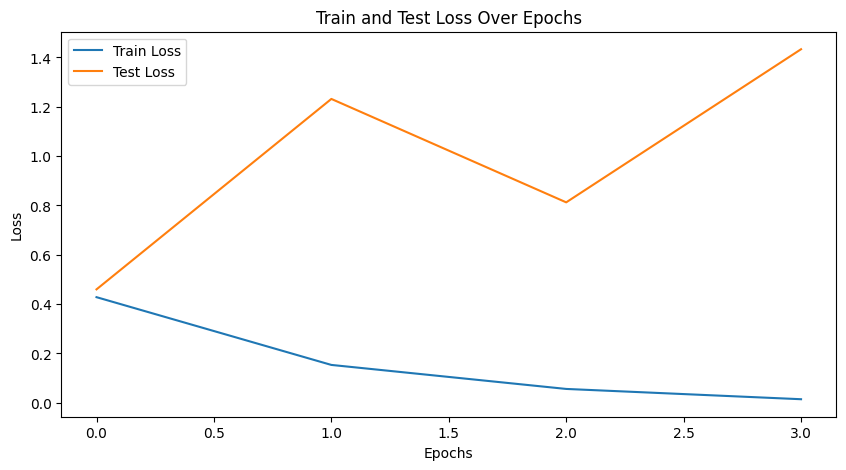

Accuracy: 0.8125
Sensitivity: 0.6375
Specificity: 0.9875
PPV: 0.9807692307692307
NPV: 0.7314814814814815
AUC: 0.904375
Precision: 0.9807692307692307
Recall: 0.6375
F1-score: 0.7727272727272727
Loss: 1.4332295356838585


In [76]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_b, Swin_V2_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_b(weights=Swin_V2_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_b_1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


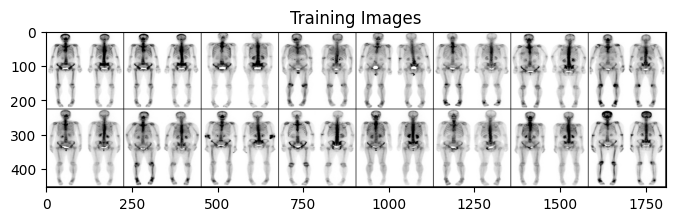

Labels: tensor([1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.46529932922312933, Test Loss: 0.6162708431482316
Epoch [2/4], Train Loss: 0.17179146775432175, Test Loss: 1.1503587362291001
Epoch [3/4], Train Loss: 0.06918944169055712, Test Loss: 0.9475143204093911
Epoch [4/4], Train Loss: 0.021731575052611342, Test Loss: 0.9742705266922712


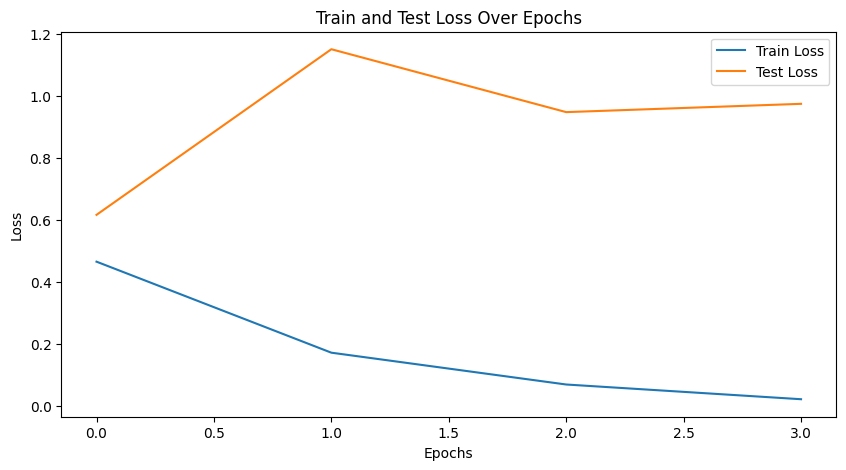

Accuracy: 0.85625
Sensitivity: 0.775
Specificity: 0.9375
PPV: 0.9253731343283582
NPV: 0.8064516129032258
AUC: 0.9328125
Precision: 0.9253731343283582
Recall: 0.775
F1-score: 0.8435374149659864
Loss: 0.9742705266922712


In [77]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_b, Swin_V2_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_b(weights=Swin_V2_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_b_2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


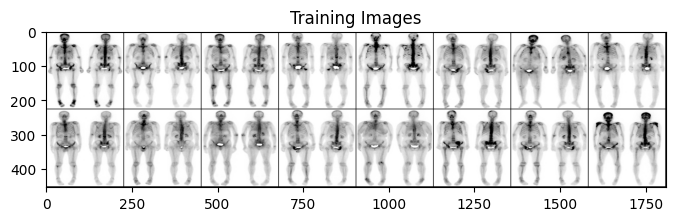

Labels: tensor([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.4959154821552553, Test Loss: 0.47118332982063293
Epoch [2/4], Train Loss: 0.20506524342763266, Test Loss: 0.547248602937907
Epoch [3/4], Train Loss: 0.07880630152519268, Test Loss: 0.6822605855995789
Epoch [4/4], Train Loss: 0.02566465478382261, Test Loss: 0.5214703805046156


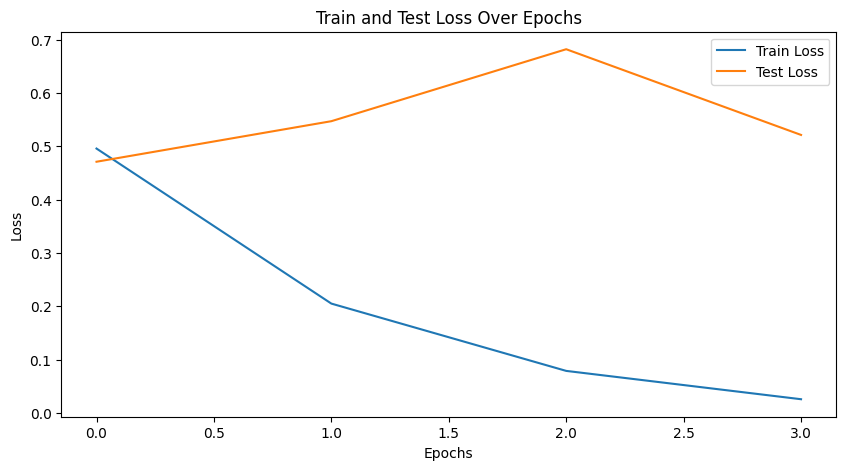

Accuracy: 0.8831168831168831
Sensitivity: 0.8181818181818182
Specificity: 0.948051948051948
PPV: 0.9402985074626866
NPV: 0.8390804597701149
AUC: 0.952437173216394
Precision: 0.9402985074626866
Recall: 0.8181818181818182
F1-score: 0.8750000000000001
Loss: 0.5214703805046156


In [78]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_b, Swin_V2_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_b(weights=Swin_V2_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_b_3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


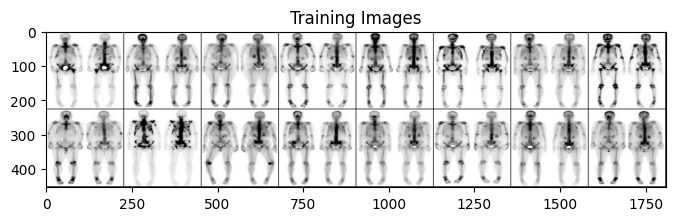

Labels: tensor([1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0])
Epoch [1/4], Train Loss: 0.4068513677401233, Test Loss: 0.5191749511286616
Epoch [2/4], Train Loss: 0.15031846955099856, Test Loss: 0.4708647280931473
Epoch [3/4], Train Loss: 0.05839468227265385, Test Loss: 0.7931961618131027
Epoch [4/4], Train Loss: 0.016319505292327466, Test Loss: 1.0440660338690577


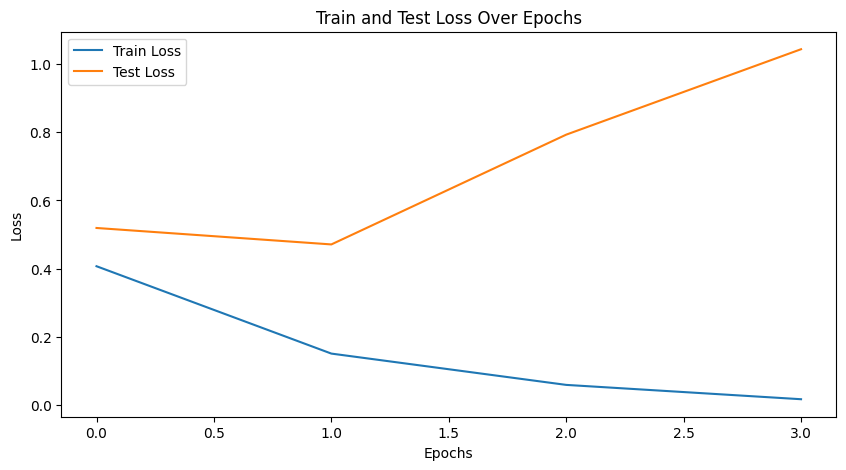

Accuracy: 0.8205128205128205
Sensitivity: 0.6410256410256411
Specificity: 1.0
PPV: 1.0
NPV: 0.7358490566037735
AUC: 0.9630177514792899
Precision: 1.0
Recall: 0.6410256410256411
F1-score: 0.7812500000000001
Loss: 1.0440660338690577


In [79]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_b, Swin_V2_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_b(weights=Swin_V2_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_b_4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


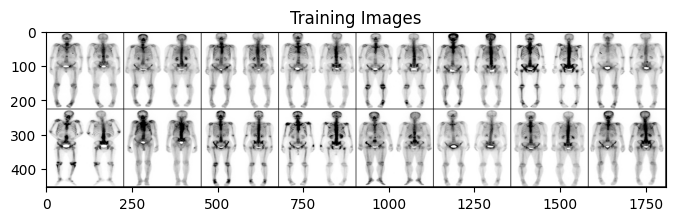

Labels: tensor([1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.429627078770687, Test Loss: 0.39301713909953834
Epoch [2/4], Train Loss: 0.15225858587485702, Test Loss: 0.8210318512050435
Epoch [3/4], Train Loss: 0.05171636833358772, Test Loss: 1.7228989683224427
Epoch [4/4], Train Loss: 0.018222897636803185, Test Loss: 1.2123682310339063


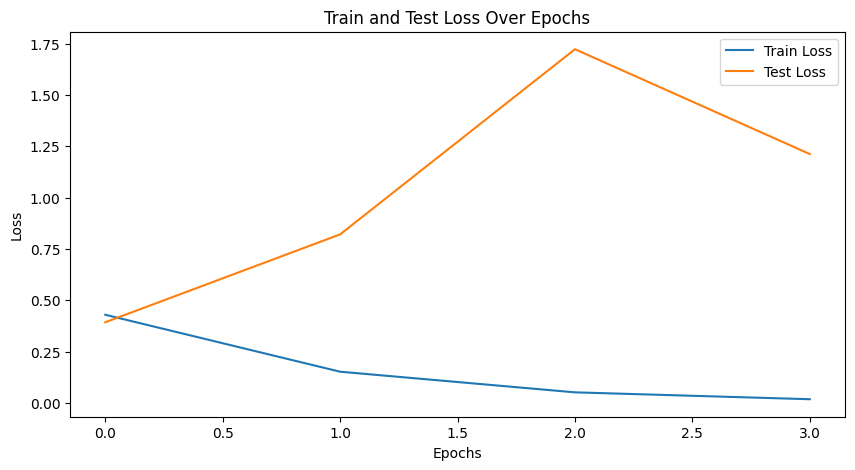

Accuracy: 0.83125
Sensitivity: 0.675
Specificity: 0.9875
PPV: 0.9818181818181818
NPV: 0.7523809523809524
AUC: 0.9428125
Precision: 0.9818181818181818
Recall: 0.675
F1-score: 0.8
Loss: 1.2123682310339063


In [80]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import swin_v2_b, Swin_V2_B_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []

# Model setup for Vision Transformer with Dropout
model = swin_v2_b(weights=Swin_V2_B_Weights.DEFAULT)

# Adding a Dropout layer before the classifier head
model.head = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(model.head.in_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title(f'Train and Test Loss Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_swin_v2_b_5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ConvNeXt Base

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


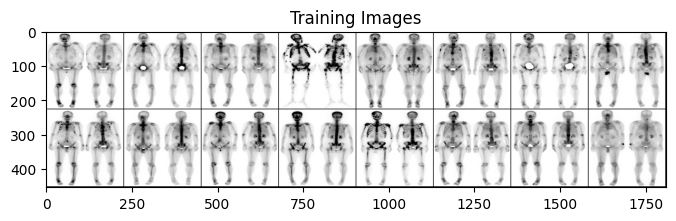

Labels: tensor([0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.6158377880465637, Test Loss: 0.6197348922491074
Epoch [2/4], Train Loss: 0.3943221181703424, Test Loss: 0.5799175202846527
Epoch [3/4], Train Loss: 0.1835742295285669, Test Loss: 0.8133982755243778
Epoch [4/4], Train Loss: 0.056885829401084956, Test Loss: 1.1184451181441546


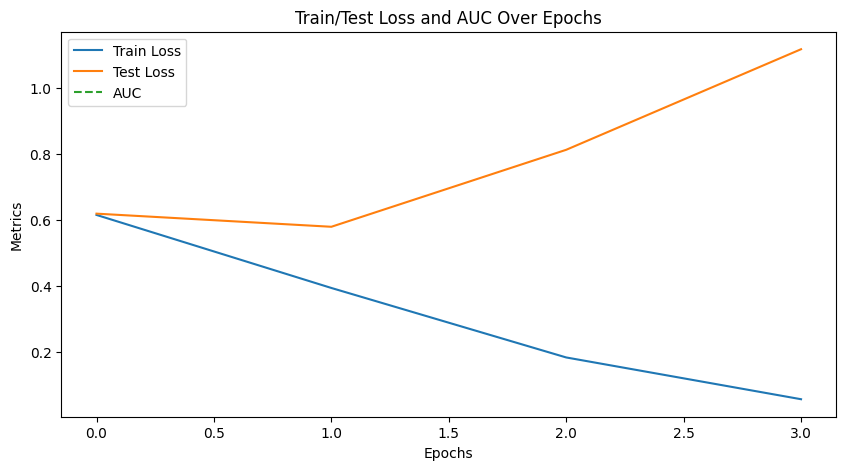

Accuracy: 0.74375
Sensitivity: 0.525
Specificity: 0.9625
PPV: 0.9333333333333333
NPV: 0.6695652173913044
AUC: 0.8646874999999999
Precision: 0.9333333333333333
Recall: 0.525
F1-score: 0.672
Loss: 1.1184451181441546


In [81]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_base(weights=ConvNeXt_Base_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_base1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


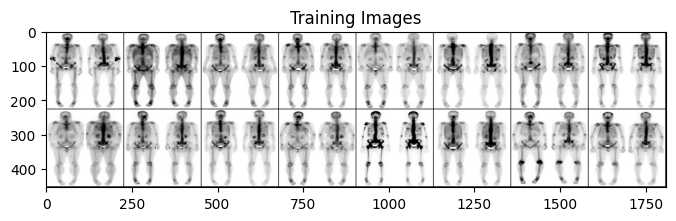

Labels: tensor([1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.5398096180005559, Test Loss: 0.7215525299310684
Epoch [2/4], Train Loss: 0.28915382726389227, Test Loss: 0.7894521519541741
Epoch [3/4], Train Loss: 0.103802711361549, Test Loss: 1.4164110030978918
Epoch [4/4], Train Loss: 0.025290925183248124, Test Loss: 1.5512268989579752


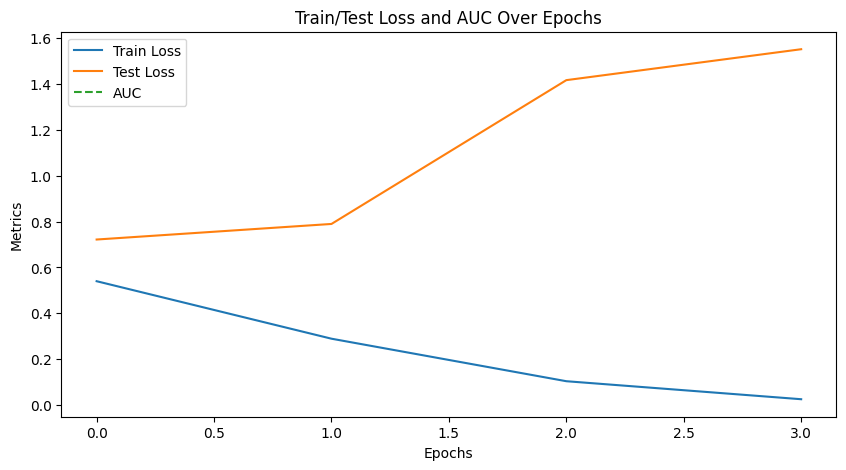

Accuracy: 0.75
Sensitivity: 0.5625
Specificity: 0.9375
PPV: 0.9
NPV: 0.6818181818181818
AUC: 0.84328125
Precision: 0.9
Recall: 0.5625
F1-score: 0.6923076923076923
Loss: 1.5512268989579752


In [82]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_base(weights=ConvNeXt_Base_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_base2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


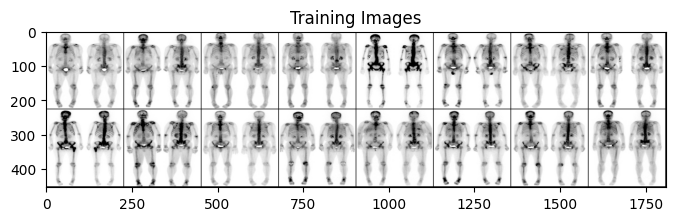

Labels: tensor([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1])
Epoch [1/4], Train Loss: 0.6508537462903458, Test Loss: 0.6004986315965652
Epoch [2/4], Train Loss: 0.43410081745496076, Test Loss: 0.5233075335621834
Epoch [3/4], Train Loss: 0.2347551657732359, Test Loss: 0.5682155817747117
Epoch [4/4], Train Loss: 0.09086593316734579, Test Loss: 0.6537125833332539


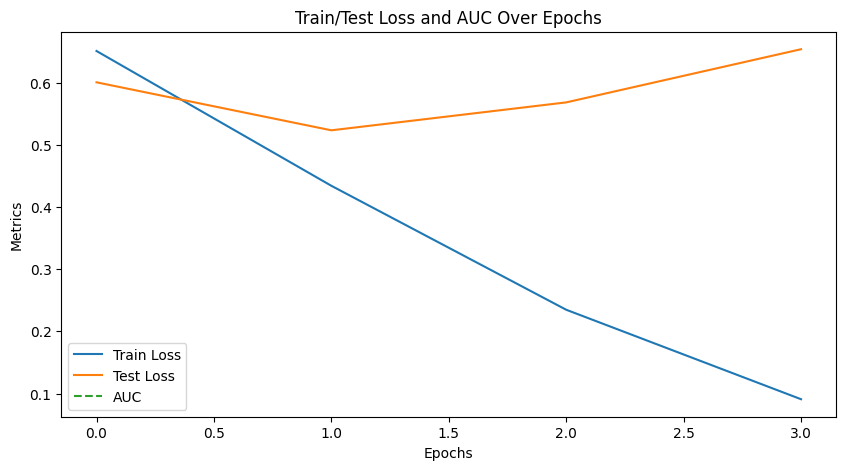

Accuracy: 0.8311688311688312
Sensitivity: 0.7402597402597403
Specificity: 0.922077922077922
PPV: 0.9047619047619048
NPV: 0.7802197802197802
AUC: 0.900489121268342
Precision: 0.9047619047619048
Recall: 0.7402597402597403
F1-score: 0.8142857142857143
Loss: 0.6537125833332539


In [83]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_base(weights=ConvNeXt_Base_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_base3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


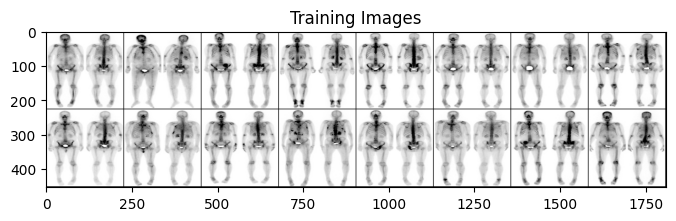

Labels: tensor([0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0])
Epoch [1/4], Train Loss: 0.5834832098515867, Test Loss: 0.5798859845846891
Epoch [2/4], Train Loss: 0.4006434931663923, Test Loss: 0.4602243401110172
Epoch [3/4], Train Loss: 0.18405517601878246, Test Loss: 0.7184837673790753
Epoch [4/4], Train Loss: 0.05549636641483374, Test Loss: 1.0135001146933065


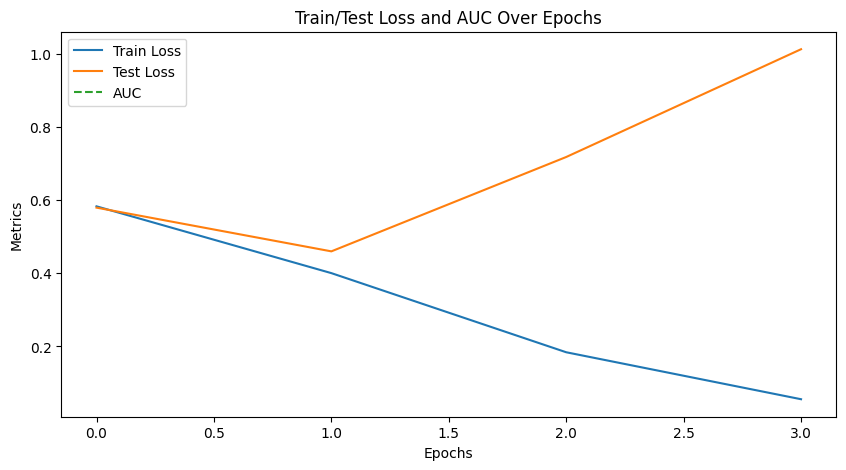

Accuracy: 0.8012820512820513
Sensitivity: 0.6410256410256411
Specificity: 0.9615384615384616
PPV: 0.9433962264150944
NPV: 0.7281553398058253
AUC: 0.8846153846153846
Precision: 0.9433962264150944
Recall: 0.6410256410256411
F1-score: 0.7633587786259541
Loss: 1.0135001146933065


In [84]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_base(weights=ConvNeXt_Base_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_base4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


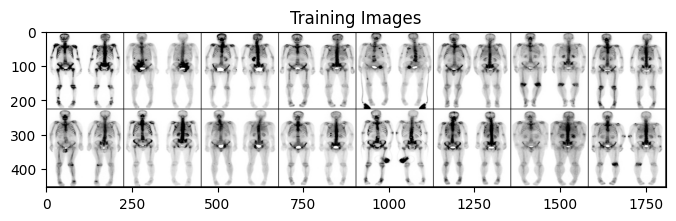

Labels: tensor([1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0])
Epoch [1/4], Train Loss: 0.7032283984341667, Test Loss: 0.6954572796821594
Epoch [2/4], Train Loss: 0.6271742272000869, Test Loss: 0.5826228350400925
Epoch [3/4], Train Loss: 0.4500441253185272, Test Loss: 0.39836777895689013
Epoch [4/4], Train Loss: 0.30122854896974793, Test Loss: 0.5569996796548367


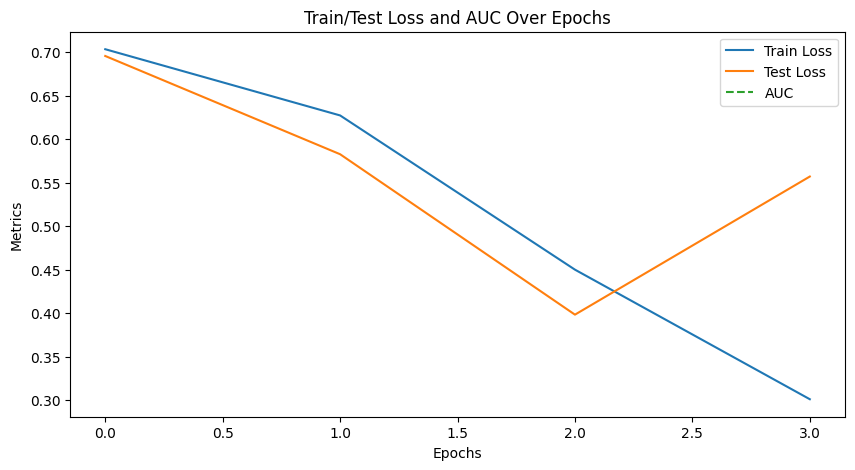

Accuracy: 0.78125
Sensitivity: 0.65
Specificity: 0.9125
PPV: 0.8813559322033898
NPV: 0.7227722772277227
AUC: 0.8865625
Precision: 0.8813559322033898
Recall: 0.65
F1-score: 0.7482014388489208
Loss: 0.5569996796548367


In [85]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_base, ConvNeXt_Base_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_base(weights=ConvNeXt_Base_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_base5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ConvNeXt Large

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


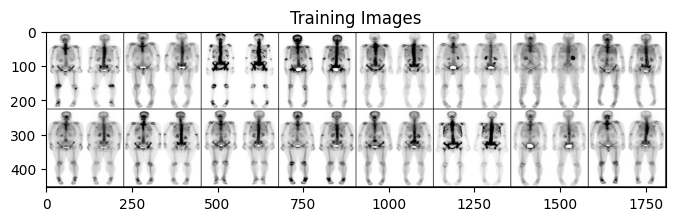

Labels: tensor([1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0])
Epoch [1/4], Train Loss: 0.5083527215259168, Test Loss: 0.5359314501285553
Epoch [2/4], Train Loss: 0.2025276501165721, Test Loss: 0.7085254229605198
Epoch [3/4], Train Loss: 0.06512273155837726, Test Loss: 1.0452879810240119
Epoch [4/4], Train Loss: 0.01808843990811599, Test Loss: 1.0797101999516598


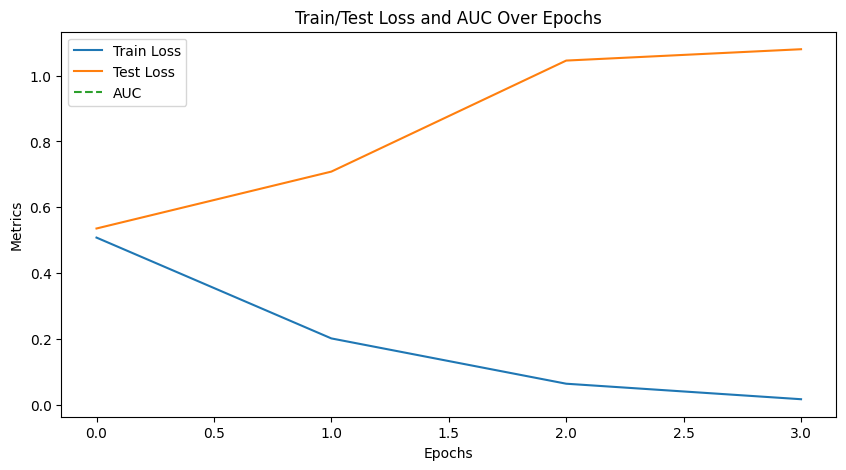

Accuracy: 0.79375
Sensitivity: 0.65
Specificity: 0.9375
PPV: 0.9122807017543859
NPV: 0.7281553398058253
AUC: 0.8896875
Precision: 0.9122807017543859
Recall: 0.65
F1-score: 0.7591240875912407
Loss: 1.0797101999516598


In [86]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_large, ConvNeXt_Large_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_large(weights=ConvNeXt_Large_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_large1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


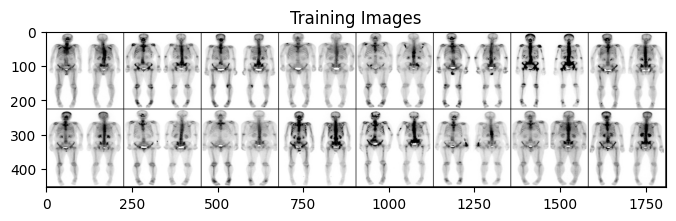

Labels: tensor([1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.5221457502542479, Test Loss: 0.6498451873660087
Epoch [2/4], Train Loss: 0.25215062906386926, Test Loss: 0.8188819371163845
Epoch [3/4], Train Loss: 0.08792658773413634, Test Loss: 0.800365537405014
Epoch [4/4], Train Loss: 0.025657745529597997, Test Loss: 1.0873599506914615


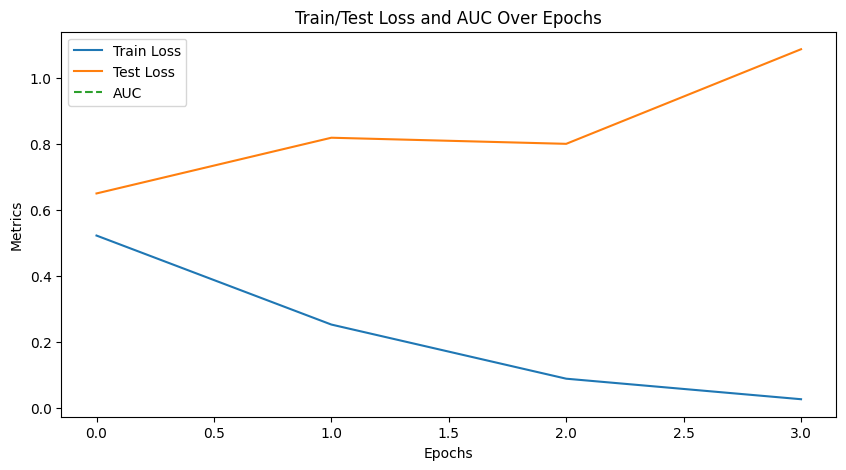

Accuracy: 0.78125
Sensitivity: 0.6125
Specificity: 0.95
PPV: 0.9245283018867925
NPV: 0.7102803738317757
AUC: 0.8984375
Precision: 0.9245283018867925
Recall: 0.6125
F1-score: 0.7368421052631579
Loss: 1.0873599506914615


In [87]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_large, ConvNeXt_Large_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_large(weights=ConvNeXt_Large_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_large2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


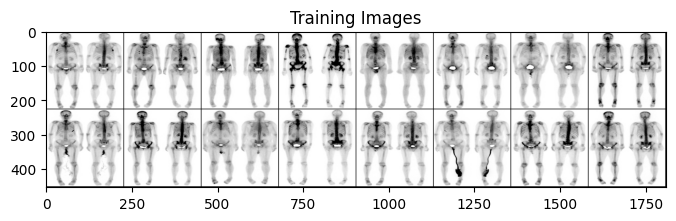

Labels: tensor([1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0])
Epoch [1/4], Train Loss: 0.48666172603018654, Test Loss: 0.5134437292814255
Epoch [2/4], Train Loss: 0.215796914046576, Test Loss: 0.8512232730165123
Epoch [3/4], Train Loss: 0.06631093036589095, Test Loss: 1.0142413854831829
Epoch [4/4], Train Loss: 0.019172209928796098, Test Loss: 0.8081593693234026


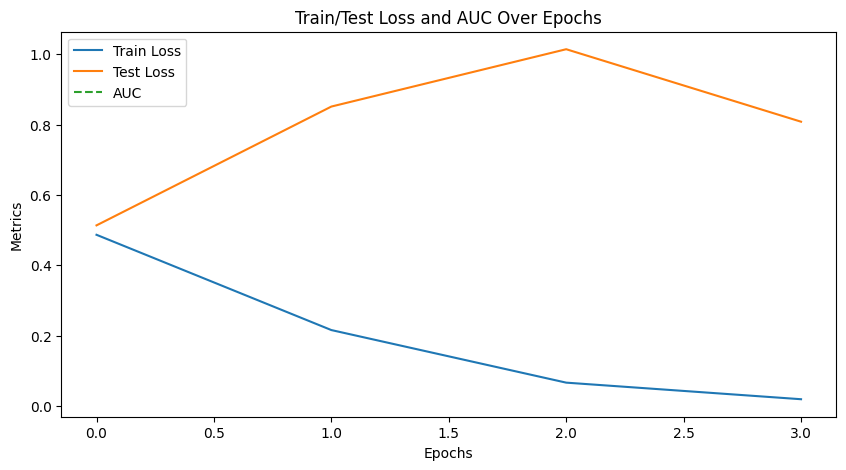

Accuracy: 0.8506493506493507
Sensitivity: 0.7532467532467533
Specificity: 0.948051948051948
PPV: 0.9354838709677419
NPV: 0.7934782608695652
AUC: 0.9235958846348457
Precision: 0.9354838709677419
Recall: 0.7532467532467533
F1-score: 0.8345323741007193
Loss: 0.8081593693234026


In [88]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_large, ConvNeXt_Large_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_large(weights=ConvNeXt_Large_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_large3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


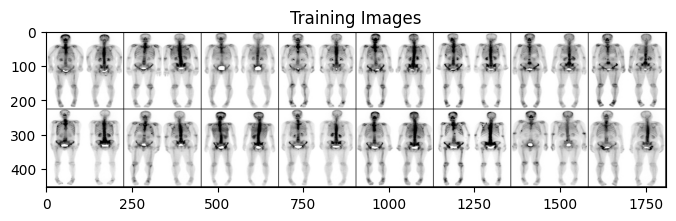

Labels: tensor([0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1])
Epoch [1/4], Train Loss: 0.6102561539454946, Test Loss: 0.4631764680147171
Epoch [2/4], Train Loss: 0.385328787605016, Test Loss: 0.3652070663869381
Epoch [3/4], Train Loss: 0.1717109721565384, Test Loss: 0.6268359584733844
Epoch [4/4], Train Loss: 0.057972253138906985, Test Loss: 0.8527332448051311


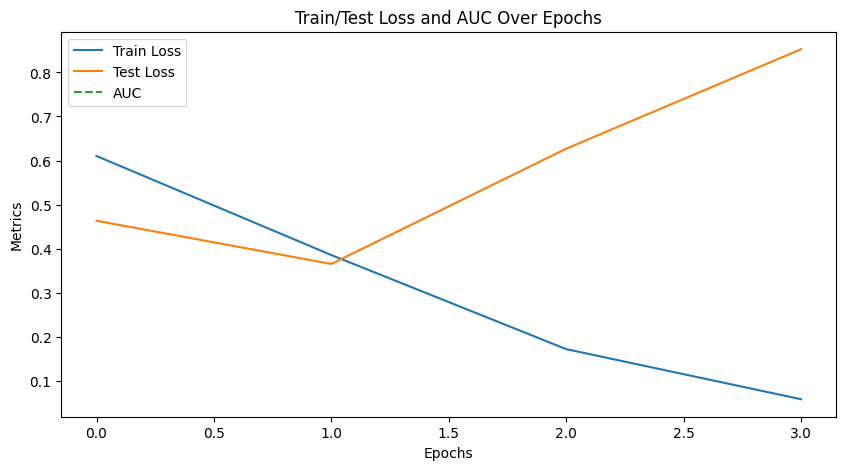

Accuracy: 0.8461538461538461
Sensitivity: 0.6923076923076923
Specificity: 1.0
PPV: 1.0
NPV: 0.7647058823529411
AUC: 0.9250493096646942
Precision: 1.0
Recall: 0.6923076923076923
F1-score: 0.8181818181818181
Loss: 0.8527332448051311


In [89]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_large, ConvNeXt_Large_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_large(weights=ConvNeXt_Large_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_large4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


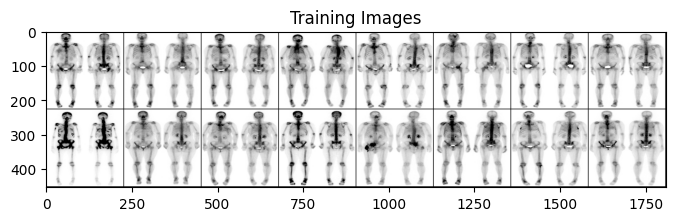

Labels: tensor([1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.6075262656995972, Test Loss: 0.5466660171747207
Epoch [2/4], Train Loss: 0.42290020390024896, Test Loss: 0.5085878863930702
Epoch [3/4], Train Loss: 0.21364037569463074, Test Loss: 0.6442927213385701
Epoch [4/4], Train Loss: 0.08979657743503656, Test Loss: 0.7752147294580937


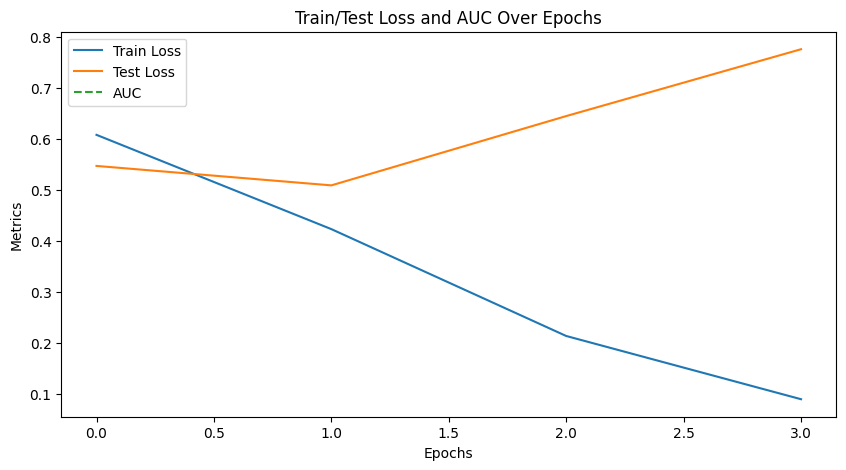

Accuracy: 0.7875
Sensitivity: 0.625
Specificity: 0.95
PPV: 0.9259259259259259
NPV: 0.7169811320754716
AUC: 0.90234375
Precision: 0.9259259259259259
Recall: 0.625
F1-score: 0.7462686567164178
Loss: 0.7752147294580937


In [90]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_large, ConvNeXt_Large_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_large(weights=ConvNeXt_Large_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_large5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ConvNeXt Small

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


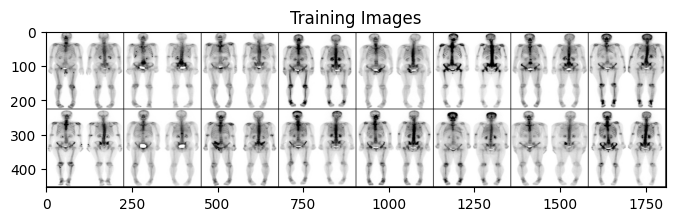

Labels: tensor([1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.6844942757805574, Test Loss: 0.6984026432037354
Epoch [2/4], Train Loss: 0.5586789828698033, Test Loss: 0.6654910564422607
Epoch [3/4], Train Loss: 0.4278740975644114, Test Loss: 0.6180953949689865
Epoch [4/4], Train Loss: 0.2666514227438031, Test Loss: 0.7865922540426254


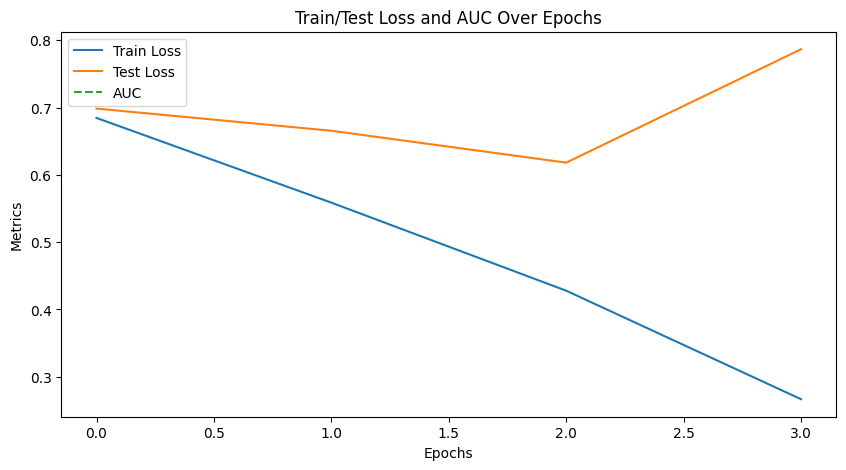

Accuracy: 0.7375
Sensitivity: 0.6
Specificity: 0.875
PPV: 0.8275862068965517
NPV: 0.6862745098039216
AUC: 0.8006249999999999
Precision: 0.8275862068965517
Recall: 0.6
F1-score: 0.6956521739130435
Loss: 0.7865922540426254


In [91]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_small, ConvNeXt_Small_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_small(weights=ConvNeXt_Small_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_small1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


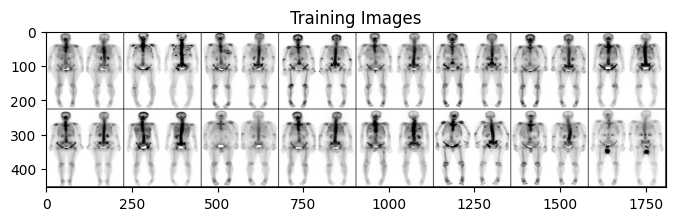

Labels: tensor([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1])
Epoch [1/4], Train Loss: 0.5473760249979288, Test Loss: 0.7549525901675225
Epoch [2/4], Train Loss: 0.3167205922694388, Test Loss: 0.873218996077776
Epoch [3/4], Train Loss: 0.12114439776689447, Test Loss: 1.0908935025334359
Epoch [4/4], Train Loss: 0.037206491582447127, Test Loss: 1.246091355383396


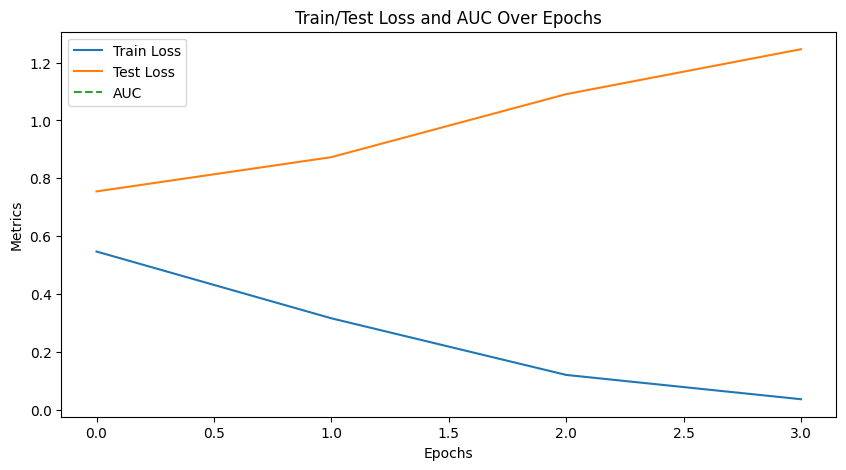

Accuracy: 0.75625
Sensitivity: 0.6125
Specificity: 0.9
PPV: 0.8596491228070176
NPV: 0.6990291262135923
AUC: 0.85734375
Precision: 0.8596491228070176
Recall: 0.6125
F1-score: 0.7153284671532847
Loss: 1.246091355383396


In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_small, ConvNeXt_Small_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_small(weights=ConvNeXt_Small_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_small2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


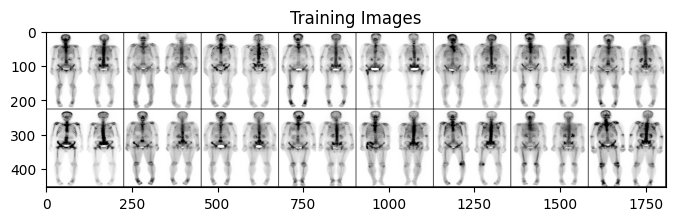

Labels: tensor([0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1])
Epoch [1/4], Train Loss: 0.5824829621005405, Test Loss: 0.5171935454010963
Epoch [2/4], Train Loss: 0.28168374616019787, Test Loss: 0.8401941541582346
Epoch [3/4], Train Loss: 0.08385520860399075, Test Loss: 0.4792808037251234
Epoch [4/4], Train Loss: 0.02649636967162753, Test Loss: 0.8454499382176437


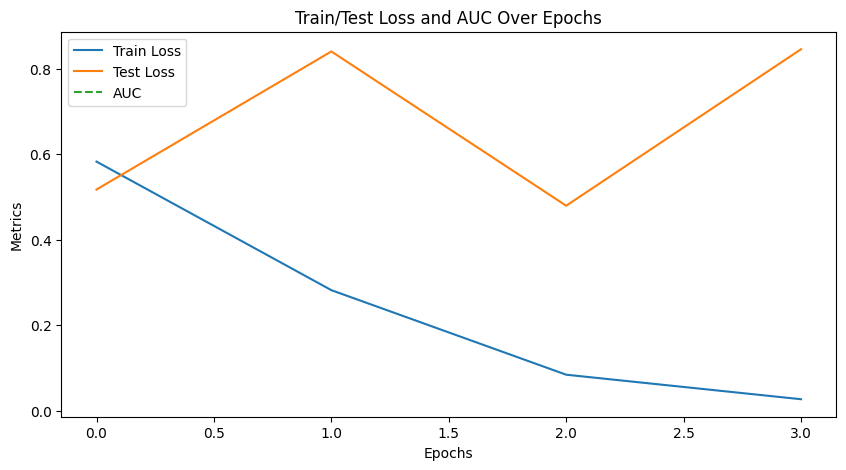

Accuracy: 0.8506493506493507
Sensitivity: 0.7272727272727273
Specificity: 0.974025974025974
PPV: 0.9655172413793104
NPV: 0.78125
AUC: 0.933040984989037
Precision: 0.9655172413793104
Recall: 0.7272727272727273
F1-score: 0.8296296296296296
Loss: 0.8454499382176437


In [93]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_small, ConvNeXt_Small_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_small(weights=ConvNeXt_Small_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_small3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


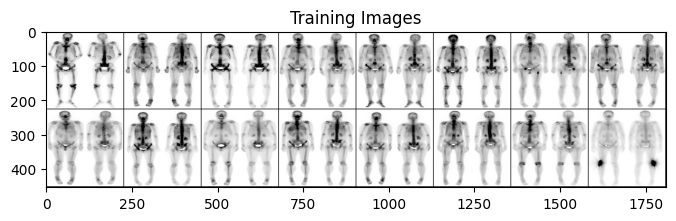

Labels: tensor([1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0])
Epoch [1/4], Train Loss: 0.6027287218755889, Test Loss: 0.46171241998672485
Epoch [2/4], Train Loss: 0.4289350184313591, Test Loss: 0.42075178027153015
Epoch [3/4], Train Loss: 0.23263718080209586, Test Loss: 0.47535526677966117
Epoch [4/4], Train Loss: 0.08699756349466325, Test Loss: 0.7690330384299159


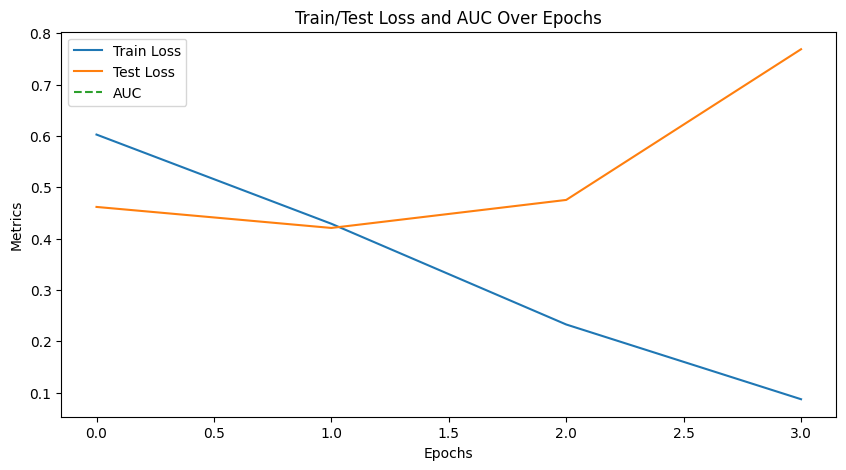

Accuracy: 0.8269230769230769
Sensitivity: 0.7051282051282052
Specificity: 0.9487179487179487
PPV: 0.9322033898305084
NPV: 0.7628865979381443
AUC: 0.9114069690992769
Precision: 0.9322033898305084
Recall: 0.7051282051282052
F1-score: 0.8029197080291971
Loss: 0.7690330384299159


In [94]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_small, ConvNeXt_Small_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_small(weights=ConvNeXt_Small_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_small4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


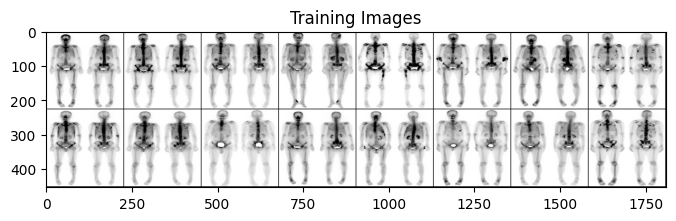

Labels: tensor([1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1])
Epoch [1/4], Train Loss: 0.5413553822170762, Test Loss: 0.47415417730808257
Epoch [2/4], Train Loss: 0.3010112504357273, Test Loss: 0.568683636188507
Epoch [3/4], Train Loss: 0.11047977203750775, Test Loss: 1.052341509028338
Epoch [4/4], Train Loss: 0.027679621277554176, Test Loss: 1.2629112826660276


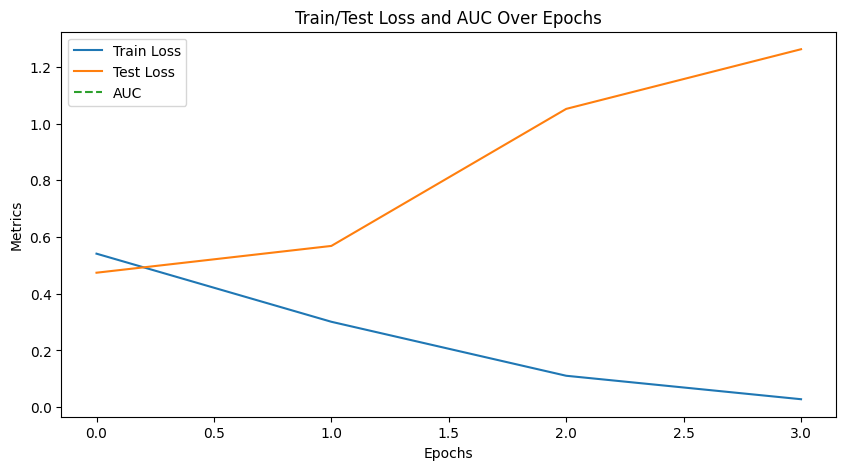

Accuracy: 0.8
Sensitivity: 0.6125
Specificity: 0.9875
PPV: 0.98
NPV: 0.7181818181818181
AUC: 0.88765625
Precision: 0.98
Recall: 0.6125
F1-score: 0.7538461538461539
Loss: 1.2629112826660276


In [95]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_small, ConvNeXt_Small_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_small(weights=ConvNeXt_Small_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_small5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

## ConvNeXt Tiny

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


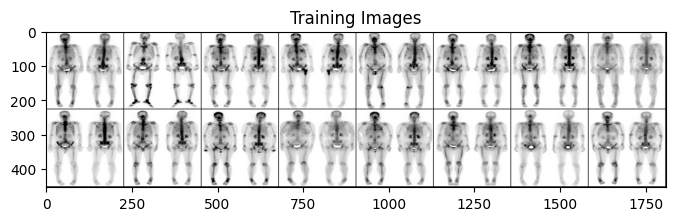

Labels: tensor([0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0])
Epoch [1/4], Train Loss: 0.5328955976925429, Test Loss: 0.7005994856357575
Epoch [2/4], Train Loss: 0.3241125111585682, Test Loss: 0.7732762716710567
Epoch [3/4], Train Loss: 0.1371540080047285, Test Loss: 0.6453232273459435
Epoch [4/4], Train Loss: 0.040924459789838365, Test Loss: 1.2984540138859302


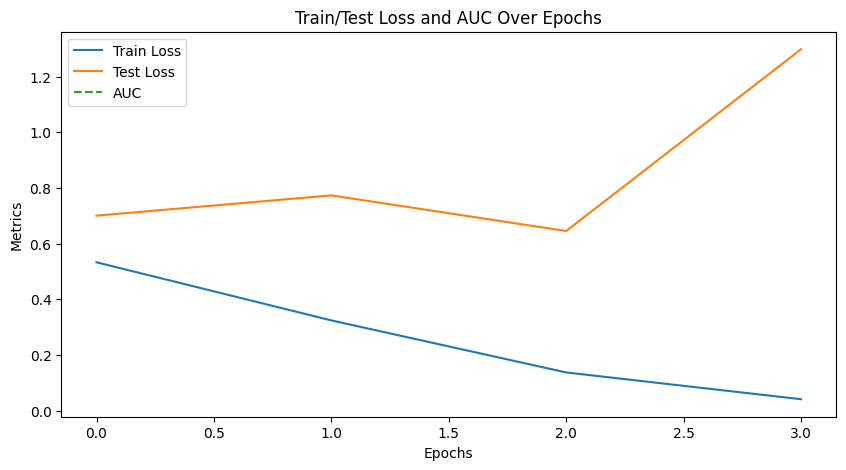

Accuracy: 0.76875
Sensitivity: 0.5875
Specificity: 0.95
PPV: 0.9215686274509803
NPV: 0.6972477064220184
AUC: 0.85125
Precision: 0.9215686274509803
Recall: 0.5875
F1-score: 0.7175572519083969
Loss: 1.2984540138859302


In [96]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set1/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_tiny1_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


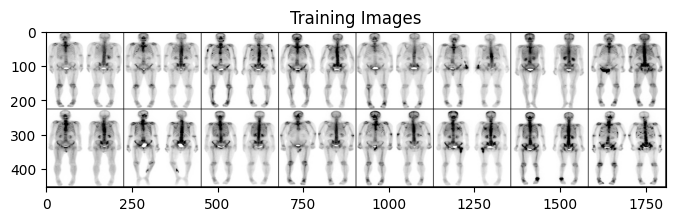

Labels: tensor([0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1])
Epoch [1/4], Train Loss: 0.5329415770699677, Test Loss: 0.5830361872911454
Epoch [2/4], Train Loss: 0.2961751502007246, Test Loss: 0.6554951921105385
Epoch [3/4], Train Loss: 0.09709498317385526, Test Loss: 1.4671612778212875
Epoch [4/4], Train Loss: 0.02987206688802633, Test Loss: 1.4114847463555633


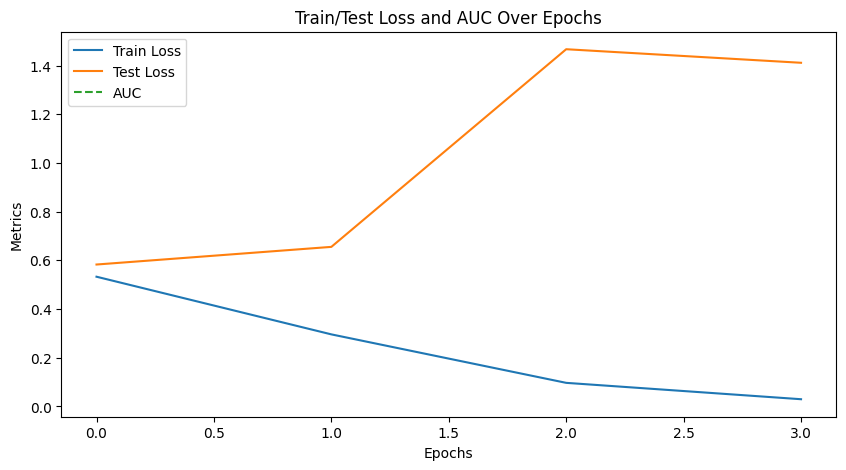

Accuracy: 0.76875
Sensitivity: 0.6375
Specificity: 0.9
PPV: 0.864406779661017
NPV: 0.7128712871287128
AUC: 0.84875
Precision: 0.864406779661017
Recall: 0.6375
F1-score: 0.7338129496402878
Loss: 1.4114847463555633


In [97]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set2/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_tiny2_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


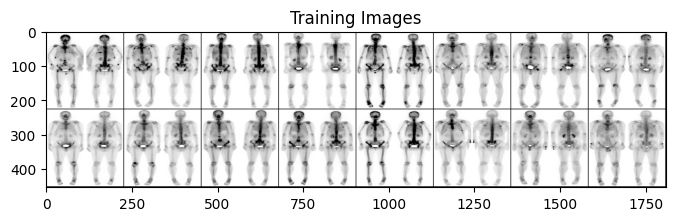

Labels: tensor([1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0])
Epoch [1/4], Train Loss: 0.6405486238812937, Test Loss: 0.633488392829895
Epoch [2/4], Train Loss: 0.44065132335696405, Test Loss: 0.4999084860086441
Epoch [3/4], Train Loss: 0.24390546068576283, Test Loss: 0.5224553197622299
Epoch [4/4], Train Loss: 0.10183630782762741, Test Loss: 0.6422353096306324


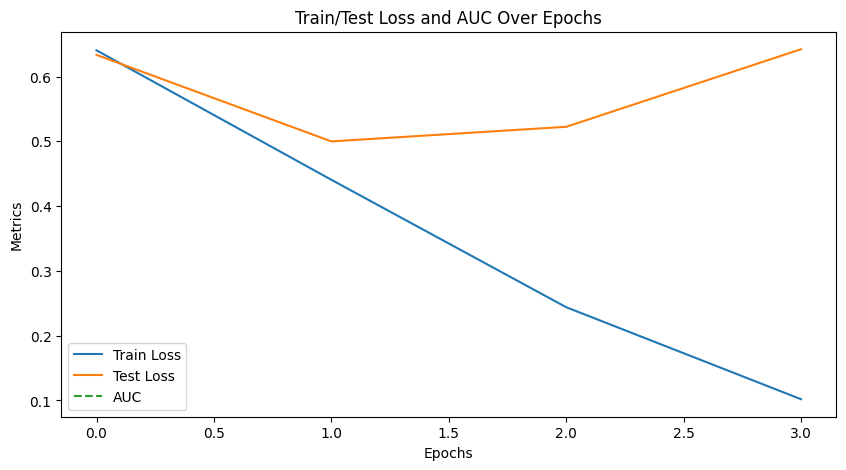

Accuracy: 0.8246753246753247
Sensitivity: 0.7402597402597403
Specificity: 0.9090909090909091
PPV: 0.890625
NPV: 0.7777777777777778
AUC: 0.8863214707370551
Precision: 0.890625
Recall: 0.7402597402597403
F1-score: 0.8085106382978724
Loss: 0.6422353096306324


In [98]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set3/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_tiny3_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


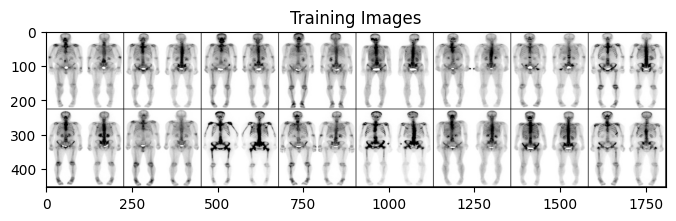

Labels: tensor([0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1])
Epoch [1/4], Train Loss: 0.6044127682893021, Test Loss: 0.4331881910562515
Epoch [2/4], Train Loss: 0.3814038499394088, Test Loss: 0.45855939723551276
Epoch [3/4], Train Loss: 0.1503203538527884, Test Loss: 0.6296309608966112
Epoch [4/4], Train Loss: 0.042309198538700424, Test Loss: 1.0336649923570804


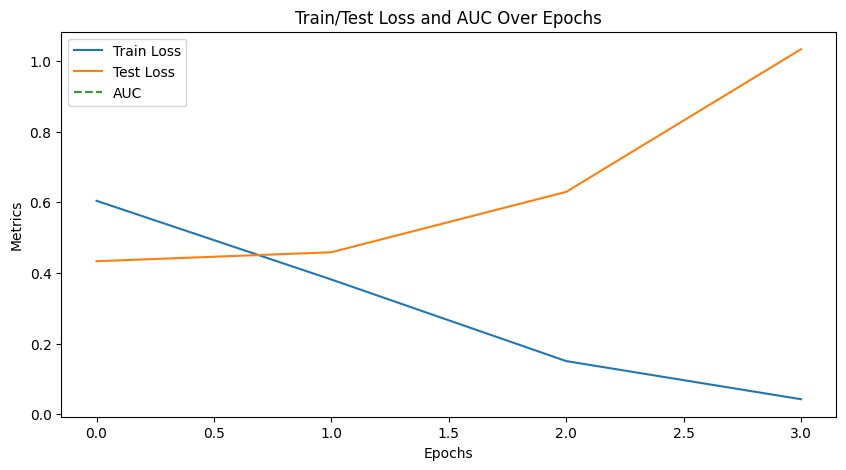

Accuracy: 0.8141025641025641
Sensitivity: 0.6794871794871795
Specificity: 0.9487179487179487
PPV: 0.9298245614035088
NPV: 0.7474747474747475
AUC: 0.9068047337278107
Precision: 0.9298245614035088
Recall: 0.6794871794871795
F1-score: 0.7851851851851852
Loss: 1.0336649923570804


In [99]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set4/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_tiny4_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


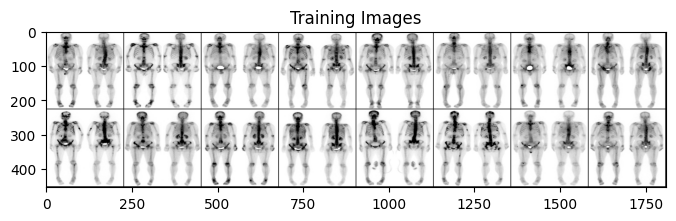

Labels: tensor([0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0])
Epoch [1/4], Train Loss: 0.558734678238341, Test Loss: 0.4830202624201775
Epoch [2/4], Train Loss: 0.2878649617518181, Test Loss: 0.6821117835119367
Epoch [3/4], Train Loss: 0.09661471152122052, Test Loss: 0.8023384305182845
Epoch [4/4], Train Loss: 0.02460547607774661, Test Loss: 1.0051382284495047


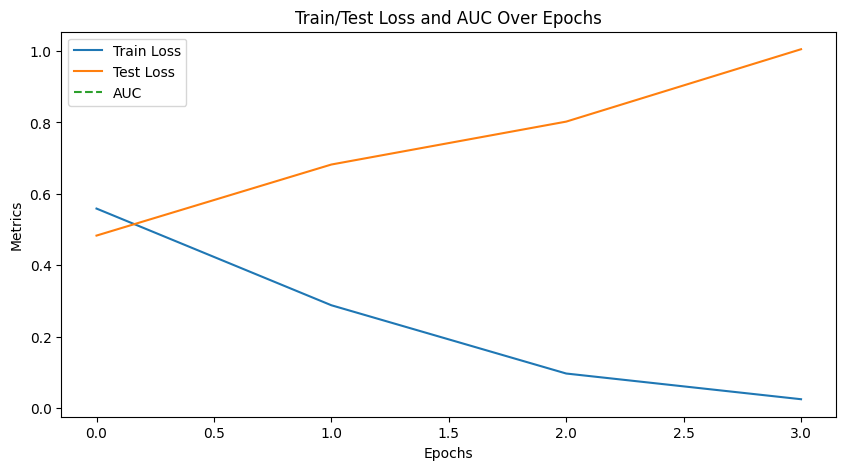

Accuracy: 0.775
Sensitivity: 0.575
Specificity: 0.975
PPV: 0.9583333333333334
NPV: 0.6964285714285714
AUC: 0.92015625
Precision: 0.9583333333333334
Recall: 0.575
F1-score: 0.71875
Loss: 1.0051382284495047


In [100]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
from sklearn.metrics import confusion_matrix, roc_auc_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import pandas as pd

# Evaluation Function
def evaluate_model(model, loader, device, criterion):
    model.eval()
    all_labels, all_preds, all_probs, all_loss = [], [], [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            all_loss.append(loss.item())
            probs = torch.softmax(outputs, dim=1)[:, 1].cpu().numpy()
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy().tolist())
            all_preds.extend(predicted.cpu().numpy().tolist())
            all_probs.extend(probs.tolist())

    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    cm = confusion_matrix(all_labels, all_preds)
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    ppv = tp / (tp + fp)
    npv = tn / (tn + fn)
    auc = roc_auc_score(all_labels, all_probs)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    loss = np.mean(all_loss)

    metrics = {
        'Accuracy': accuracy,
        'Sensitivity': sensitivity,
        'Specificity': specificity,
        'PPV': ppv,
        'NPV': npv,
        'AUC': auc,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        'Loss': loss
    }

    return metrics

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters
num_epochs = 4
num_classes = 2
batch_size = 16
learning_rate = 0.0001

# Data loading and transforming for separate train and test sets
train_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/train',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

test_dataset = torchvision.datasets.ImageFolder(
    root='D:/Bone_scan/preprocessing_comparison/segmented_cropped/set5/test',
    transform=transforms.Compose([
        transforms.Grayscale(num_output_channels=3),  # Convert grayscale to RGB
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize for 3 channels
    ])
)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Initialize the lists for storing loss over epochs
train_loss_over_epochs = []
test_loss_over_epochs = []
auc_over_epochs = []

# Model setup for ConvNeXt
model = convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)
first_conv_layer = model.features[0][0]

# Adjust the first convolutional layer for 1-channel grayscale input
model.features[0][0] = nn.Conv2d(3, first_conv_layer.out_channels,
                                 kernel_size=first_conv_layer.kernel_size,
                                 stride=first_conv_layer.stride,
                                 padding=first_conv_layer.padding, bias=False)

# Get the number of features before the classifier
num_features = model.classifier[2].in_features
model.classifier[2] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_features, num_classes)
)

model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=1e-4)

# Scheduler for Cosine Annealing
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=0)

# Training loop with added training data inspection
for epoch in range(num_epochs):
    model.train()
    train_losses = []

    for i, (images, labels) in enumerate(train_loader):
        # Visualize some training data (only in the first epoch and first batch)
        if epoch == 0 and i == 0:
            plt.figure(figsize=(8, 8))
            out = torchvision.utils.make_grid(images)
            plt.imshow(np.transpose(out.numpy(), (1, 2, 0)))
            plt.title("Training Images")
            plt.show()
            print("Labels:", labels)

        # Training loop
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

    # Evaluation
    model.eval()
    val_losses = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_losses.append(loss.item())

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {np.mean(train_losses)}, Test Loss: {np.mean(val_losses)}")

    if (epoch+1) % 10 == 0:
        metrics = evaluate_model(model, test_loader, device, criterion)
        for key, value in metrics.items():
            print(f"{key}: {value}")

    train_loss_over_epochs.append(np.mean(train_losses))
    test_loss_over_epochs.append(np.mean(val_losses))

    # Update the learning rate using the scheduler at the end of each epoch
    scheduler.step()

# Plotting for this fold
plt.figure(figsize=(10, 5))
plt.plot(train_loss_over_epochs, label='Train Loss')
plt.plot(test_loss_over_epochs, label='Test Loss')
plt.plot(auc_over_epochs, label='AUC', linestyle='--')  # Plot AUC
plt.xlabel('Epochs')
plt.ylabel('Metrics')
plt.legend()
plt.title('Train/Test Loss and AUC Over Epochs')
plt.show()

# Final Evaluation
metrics = evaluate_model(model, test_loader, device, criterion)
for key, value in metrics.items():
    print(f"{key}: {value}")

# Save Class Probabilities to Excel
def save_class_probabilities_to_excel(model, loader, save_path, device):
    model.eval()
    probabilities = []
    filenames = [filename[0] for filename in loader.dataset.samples]

    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            probabilities.extend(probs)

    df = pd.DataFrame(probabilities, columns=['Class_0_Prob', 'Class_1_Prob'])
    df['Filename'] = filenames
    df.to_excel(save_path, index=False)

# Specify the path for saving the Excel file
excel_save_path = 'h_cropped_segmented_convnext_tiny5_rgb.xlsx'
save_class_probabilities_to_excel(model, test_loader, excel_save_path, device)